In [1]:
#engine imports
import glob
import ntpath
import pandas as pd
data = []

In [2]:


a=1
b=2
c=3


data.append([a, b, c])

df = pd.DataFrame(data, columns=['A', 'B', 'C'])

In [3]:
df

,A,B,C
0,1,2,3


In [4]:
data=[]

In [5]:
#lime imports
import os
import keras
from keras.applications import xception as inc_net
from keras.preprocessing import image
from keras.models import load_model
from keras.applications.imagenet_utils import decode_predictions
from skimage.io import imread
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
print('Notebook run using keras:', keras.__version__)
import lime
import csv



Using TensorFlow backend.


Notebook run using keras: 2.2.4


In [6]:
import h5py

#f = h5py.File('E:/expr1/Xception-with-Your-Own-Dataset/result_exp1/model_fine_final.h5','r+')
f = h5py.File('E:/expr1/Xception-with-Your-Own-Dataset/resultc_t1_real/model_fine_final.h5','r+')

data_p = f.attrs['training_config']
data_p = data_p.decode().replace("learning_rate","lr").encode()
f.attrs['training_config'] = data_p
f.close()

#inet_model = load_model('E:/expr1/Xception-with-Your-Own-Dataset/result_exp1/model_fine_final.h5')
inet_model = load_model('E:/expr1/Xception-with-Your-Own-Dataset/resultc_t1_real/model_fine_final.h5')

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Use tf.cast instead.


In [7]:
def transform_img_fn(path_list):
    out = []
    for img_path in path_list:
        img = image.load_img(img_path, target_size=(299, 299))
        x = image.img_to_array(img)
        x = np.expand_dims(x, axis=0)
        x = inc_net.preprocess_input(x)
        out.append(x)
    return np.vstack(out)

In [8]:
from lime import lime_image
from skimage.segmentation import mark_boundaries
%load_ext autoreload
%autoreload 2
explainer = lime_image.LimeImageExplainer()

In [9]:

df_class=pd.read_excel("class_priori.xls", sheet_name='Sheet2', usecols="A:B")

In [10]:
df_class

,filename,Class
0,11.hqdefault.png,dalmatian
1,12.Dalmatian-Dog.png,dalmatian
2,17.774c9de81806c1cfbe2ae6325311ccd9---dalmatia...,dalmatian
3,2.Adult-Dalmatian.png,dalmatian
4,26.dog-running-dalmatian-puppy.png,dalmatian
5,31.dalmatian-dog-27197488.png,dalmatian
6,33.38fe29595c27d4feca8181b5f14c9a85.png,dalmatian
7,34.Brown-Dalmatian-Dog-Puppy-Pictures.png,dalmatian
8,39.Dog-Dalmatian-An_obedient_male_Dalmatian_si...,dalmatian
9,40.dalmatian-dog-white-background-adult-standi...,dalmatian


In [11]:
def converter(x):

    #x has shape (batch, width, height, channels)
    return (0.21 * x[:,:,:,:1]) + (0.72 * x[:,:,:,1:2]) + (0.07 * x[:,:,:,-1:])


def getmasks(filename):

    img_path = 'c:/Users/andradee/\Documents/audiodeep/image_downloader/image_downloader/images/3dogs/teste/'+filename
    img = image.load_img(img_path, target_size=(299, 299))
    img_tensor = image.img_to_array(img)
    img_tensor = np.expand_dims(img_tensor, axis=0)
    img_tensor /= 255.

    plt.imshow(img_tensor[0])
    plt.show()

    print(img_tensor.shape)

    file_class='E:/expr1/Xception-with-Your-Own-Dataset/classes_t1.txt'

    classes = []
    with open(file_class, 'r') as f:
        classes = list(map(lambda x: x.strip(), f.readlines()))


    for i in range(len(df_class.filename)): 
        if filename==df_class.filename[i]:
            print("Classpriori", df_class.Class[i])
            classpriori=df_class.Class[i]
            
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)

    x = inc_net.preprocess_input(x)


    images = np.vstack([x])
    pred = inet_model.predict(images, batch_size=30)

    num_class=pred.shape[1]

    result = [(classes[i], float(pred[0,i]) * 100.0) for i in range(num_class)]
    result.sort(reverse=True, key=lambda x: x[1])

    for i in range(num_class):
        (class_name, prob) = result[i]
        #print(i)
        #print("Top %d ====================" % (i + 1))
        #print("Class name: %s" % (class_name))
        #print("Probability: %.2f%%" % (prob))
        print('%s, %.2f%%' % (class_name, prob))
        if classpriori==class_name:
            clabel=i
        
                
         
            

    #%%time
    # Hide color is the color for a superpixel turned OFF. Alternatively, if it is NONE, the superpixel will be replaced by the average of its pixels
    explanation = explainer.explain_instance(images[0], inet_model.predict, top_labels=5,hide_color=0, num_samples=1000)
  
    temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=10, hide_rest=True)
    plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))
    plt.show()
    plt.imshow(mask)
    plt.show()
    
    mask2_path = 'c:/Users/andradee/\Documents/audiodeep/image_downloader/image_downloader/images/3dogs/mask/'+filename
    mask2 = image.load_img(mask2_path, target_size=(299, 299))
    mask2_tensor = image.img_to_array(mask2)
    mask2_tensor = np.expand_dims(mask2_tensor, axis=0)
    mask2_tensor /= 255.

    plt.imshow(mask2_tensor[0])
    plt.show()
    
    mask2=converter(mask2_tensor)
    mask2 = mask2.reshape([ 299, 299])
    mask2=(mask2 < 1)
    mask=mask

    plt.imshow(mask)
    plt.show()
    
    maskf_fp=(1-mask2)*mask #falso positivo
    maskf_fn=mask2*(1-mask) #falso negativo
    maskf_tp=mask2*mask #verdadeiro positivo
    maskf_tn=(1-mask2)*(1-mask) #verdadeiro negativo
    
    print("True Positive")
    plt.imshow(maskf_tp)
    plt.show()
    
    print("True Negative")
    plt.imshow(maskf_tn)
    plt.show()
    
    print("False Positive")
    plt.imshow(maskf_fp)
    plt.show()
    
    print("False Negative")
    plt.imshow(maskf_fn)
    plt.show()
    
    fp= np.count_nonzero(maskf_fp == 1)/ (299*299) *100
    fn = np.count_nonzero(maskf_fn == 1)/ (299*299) *100
    tp =np.count_nonzero(maskf_tp == 1)/ (299*299) *100
    tn = np.count_nonzero(maskf_tn == 1)/ (299*299) *100
    acc=((tp+tn)/(fp+tp+fn+tn)*100)
    pre=(tp/(tp+fp))*100
    rec=(tp/(tp+fn))*100
    spe=(tn/(tn+fp)*100)
    f1=2*(pre*rec)/(pre+rec)
        
    print("TP - FP:",tp, fp)
    print("FN - TN:",fn, tn)
    print("Acurracy:", acc)
    print("Precision:",pre )
    print("Recall:", rec)
    print("Specificity:", spe)
    print("clabel:",clabel)
    
    (class_name, prob) = result[0]
    rclabel=clabel
    clabel=0
    data.append([filename, clabel, classpriori, class_name, prob, fp, fn, tp, tn, acc, pre, rec, spe, f1])
    print(data)
    clabel=rclabel
    
    
    if clabel != 0:
        #%%time
        # Hide color is the color for a superpixel turned OFF. Alternatively, if it is NONE, the superpixel will be replaced by the average of its pixels
        explanation = explainer.explain_instance(images[0], inet_model.predict, top_labels=5,hide_color=0, num_samples=1000)
  
        temp, mask = explanation.get_image_and_mask(explanation.top_labels[clabel], positive_only=True, num_features=10, hide_rest=True)
        plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))
        plt.show()
        plt.imshow(mask)
        plt.show()
    
        mask2_path = 'c:/Users/andradee/\Documents/audiodeep/image_downloader/image_downloader/images/3dogs/mask/'+filename
        mask2 = image.load_img(mask2_path, target_size=(299, 299))
        mask2_tensor = image.img_to_array(mask2)
        mask2_tensor = np.expand_dims(mask2_tensor, axis=0)
        mask2_tensor /= 255.
    
        plt.imshow(mask2_tensor[0])
        plt.show()
    
        mask2=converter(mask2_tensor)
        mask2 = mask2.reshape([ 299, 299])
        mask2=(mask2 < 1)
        mask=mask

        plt.imshow(mask)
        plt.show()
    
        maskf_fp=(1-mask2)*mask #falso positivo
        maskf_fn=mask2*(1-mask) #falso negativo
        maskf_tp=mask2*mask #verdadeiro positivo
        maskf_tn=(1-mask2)*(1-mask) #verdadeiro negativo
    
        print("True Positive")
        plt.imshow(maskf_tp)
        plt.show()
    
        print("True Negative")
        plt.imshow(maskf_tn)
        plt.show()
    
        print("False Positive")
        plt.imshow(maskf_fp)
        plt.show()
    
        print("False Negative")
        plt.imshow(maskf_fn)
        plt.show()
    
        fp= np.count_nonzero(maskf_fp == 1)/ (299*299) *100
        fn = np.count_nonzero(maskf_fn == 1)/ (299*299) *100
        tp =np.count_nonzero(maskf_tp == 1)/ (299*299) *100
        tn = np.count_nonzero(maskf_tn == 1)/ (299*299) *100
        acc=((tp+tn)/(fp+tp+fn+tn)*100)
        pre=(tp/(tp+fp))*100
        rec=(tp/(tp+fn))*100
        spe=(tn/(tn+fp)*100)
        f1=2*(pre*rec)/(pre+rec)
        
        print("TP - FP:",tp, fp)
        print("FN - TN:",fn, tn)
        print("Acurracy:", acc)
        print("Precision:",pre )
        print("Recall:", rec)
        print("Specificity:", spe)
        print("clabel:",clabel)
    
        (class_name, prob) = result[0]
        data.append([filename, clabel, classpriori, class_name, prob, fp, fn, tp, tn, acc, pre, rec, spe, f1])
        print(data)
    
    

1 11.9a11ca35bc0c6f639ed0959ea61d7058.png


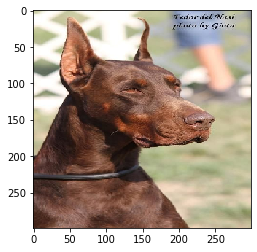

(1, 299, 299, 3)
Classpriori doberman
doberman, 99.95%
german_shepherd, 0.05%
BACKGROUND_Google, 0.00%
dalmatian, 0.00%
airplanes, 0.00%


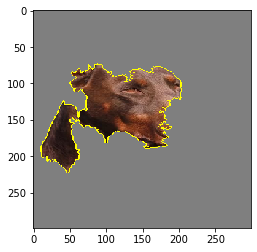

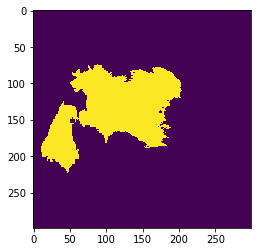

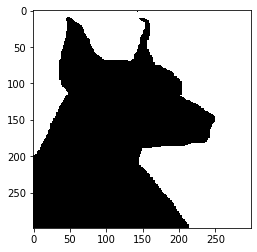

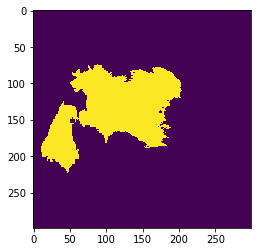

True Positive


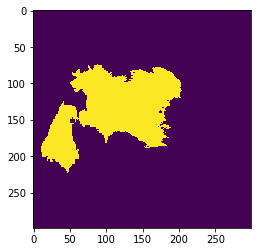

True Negative


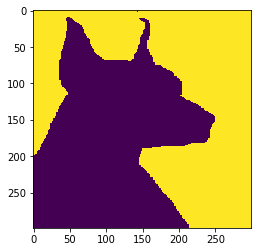

False Positive


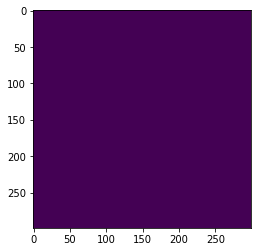

False Negative


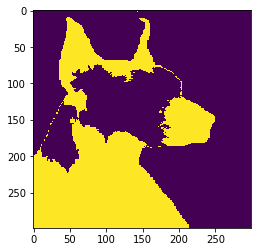

TP - FP: 15.74590888245098 0.0
FN - TN: 33.62042930168566 50.63366181586336
Acurracy: 66.37957069831434
Precision: 100.0
Recall: 31.89604386640686
Specificity: 100.0
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965]]
2 11.german-shepherd-ap-aozjlq-645.png


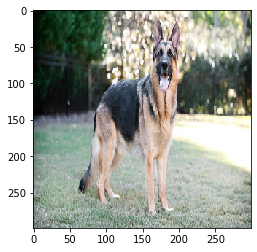

(1, 299, 299, 3)
Classpriori german_shepherd
german_shepherd, 100.00%
doberman, 0.00%
dalmatian, 0.00%
BACKGROUND_Google, 0.00%
airplanes, 0.00%


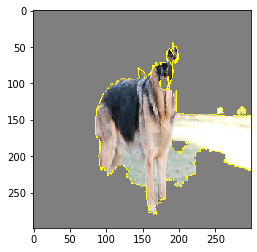

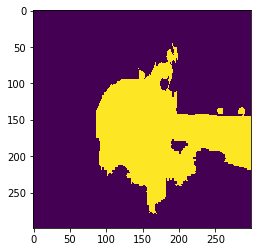

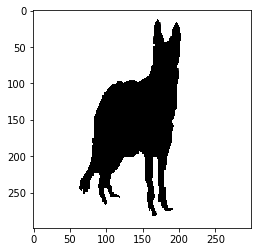

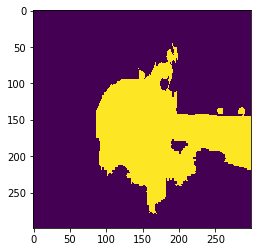

True Positive


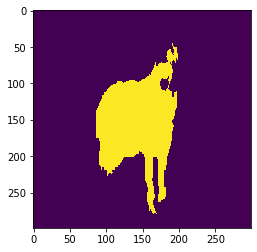

True Negative


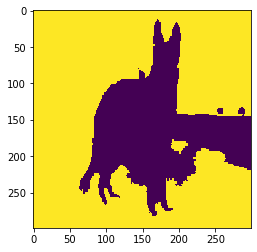

False Positive


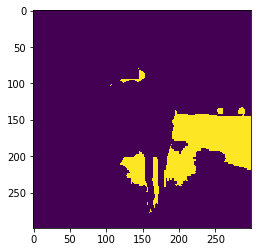

False Negative


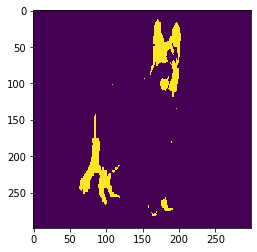

TP - FP: 14.404760573147952 10.306372411941702
FN - TN: 4.378027091419559 70.91083992349078
Acurracy: 85.31560049663874
Precision: 58.29259460438168
Recall: 76.69128156264888
Specificity: 87.31011307138232
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019]]
3 11.german-shepherd-dog.png


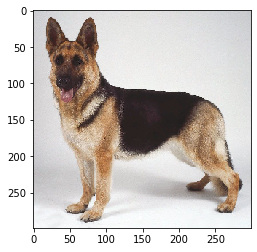

(1, 299, 299, 3)
Classpriori german_shepherd
german_shepherd, 100.00%
doberman, 0.00%
dalmatian, 0.00%
BACKGROUND_Google, 0.00%
airplanes, 0.00%


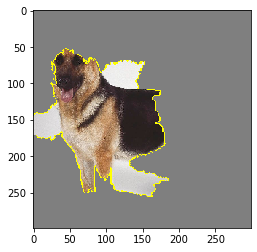

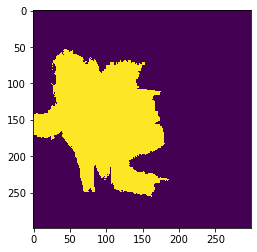

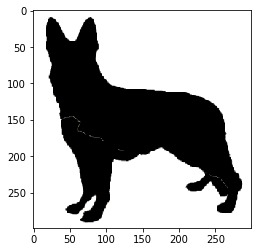

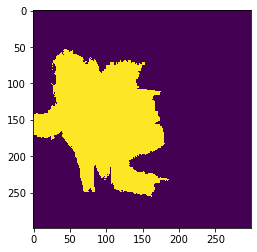

True Positive


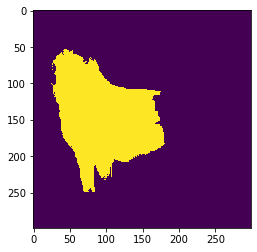

True Negative


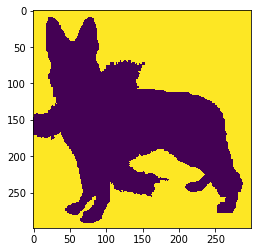

False Positive


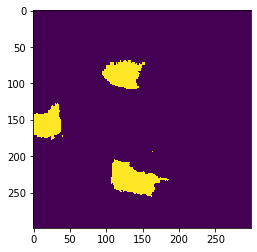

False Negative


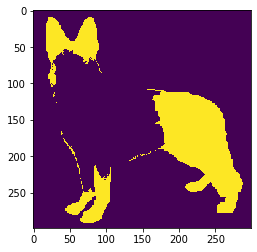

TP - FP: 18.911421572465635 5.60955694007897
FN - TN: 18.30852003892574 57.170501448529656
Acurracy: 76.08192302099529
Precision: 77.12343764255087
Recall: 50.8099173553719
Specificity: 91.06474717599686
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876]]
4 11.gsd_bred_to_do_header_.png


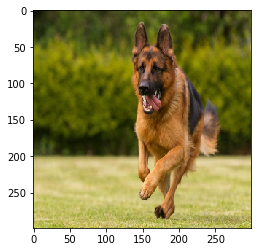

(1, 299, 299, 3)
Classpriori german_shepherd
german_shepherd, 100.00%
doberman, 0.00%
dalmatian, 0.00%
airplanes, 0.00%
BACKGROUND_Google, 0.00%


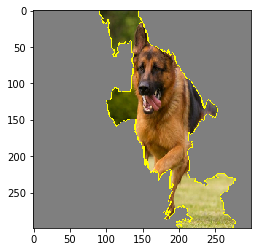

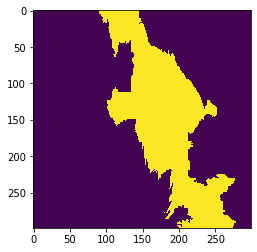

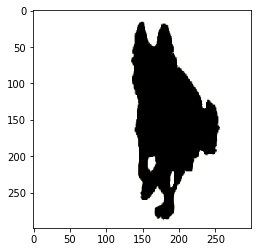

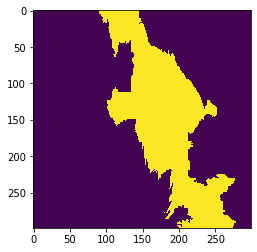

True Positive


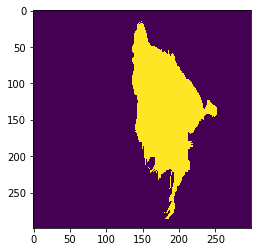

True Negative


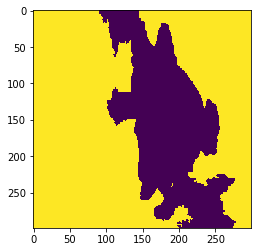

False Positive


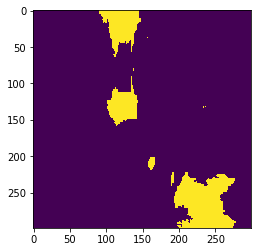

False Negative


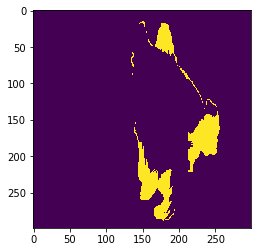

TP - FP: 15.209002136441427 9.146430129416897
FN - TN: 5.891432981733985 69.75313475240769
Acurracy: 84.96213688884912
Precision: 62.446036557361985
Recall: 72.07909245122985
Specificity: 88.40750244552504
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png',

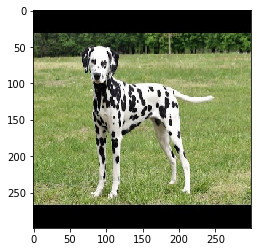

(1, 299, 299, 3)
Classpriori dalmatian
dalmatian, 100.00%
BACKGROUND_Google, 0.00%
german_shepherd, 0.00%
doberman, 0.00%
airplanes, 0.00%


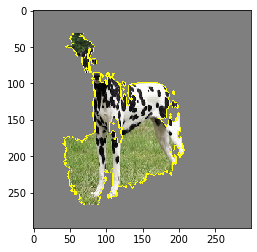

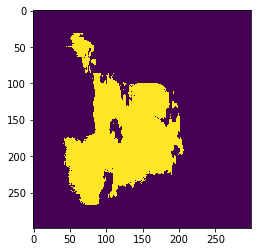

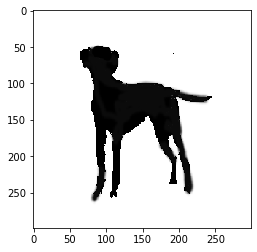

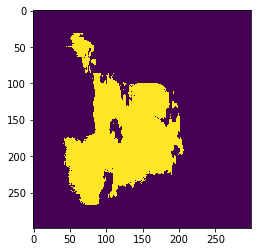

True Positive


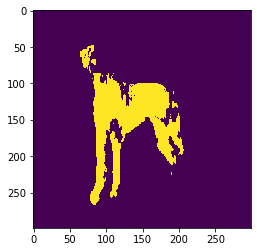

True Negative


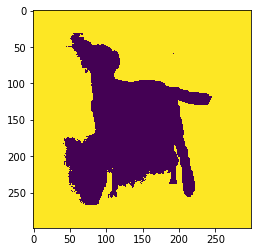

False Positive


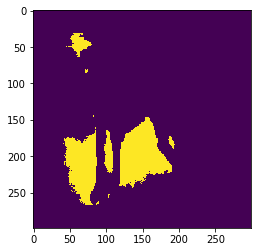

False Negative


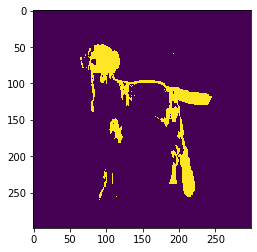

TP - FP: 10.910392501202447 9.357837160658159
FN - TN: 6.243778033802754 73.48799230433663
Acurracy: 84.3983848055391
Precision: 53.83002207505518
Recall: 63.60198226395409
Specificity: 88.70451630324713
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 0

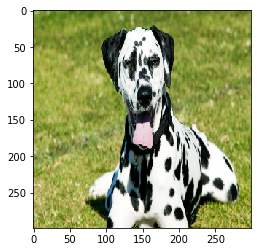

(1, 299, 299, 3)
Classpriori dalmatian
dalmatian, 100.00%
BACKGROUND_Google, 0.00%
german_shepherd, 0.00%
doberman, 0.00%
airplanes, 0.00%


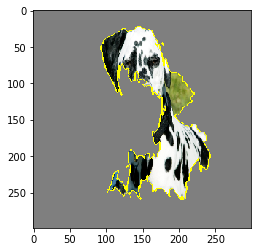

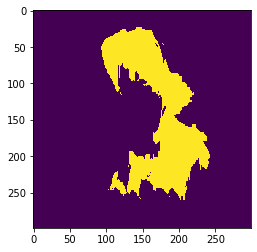

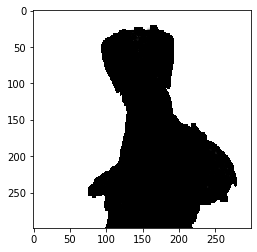

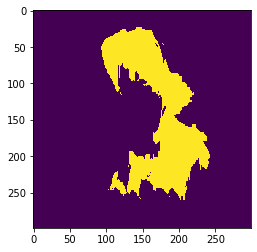

True Positive


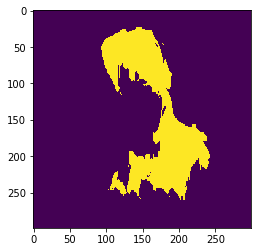

True Negative


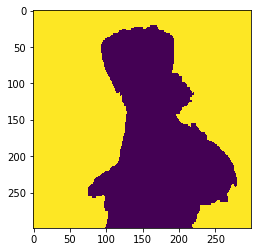

False Positive


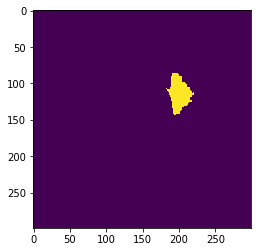

False Negative


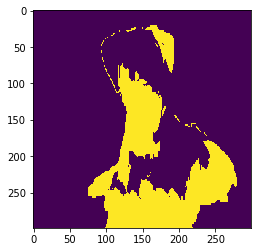

TP - FP: 15.234728918021052 1.3333184192570553
FN - TN: 20.36778112101654 63.06417154170535
Acurracy: 78.2989004597264
Precision: 91.95247096948421
Recall: 42.791165289515845
Specificity: 97.92954908636142
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png',

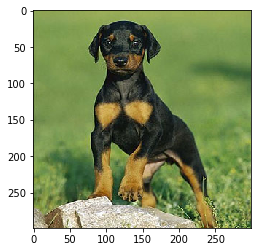

(1, 299, 299, 3)
Classpriori doberman
doberman, 100.00%
german_shepherd, 0.00%
BACKGROUND_Google, 0.00%
dalmatian, 0.00%
airplanes, 0.00%


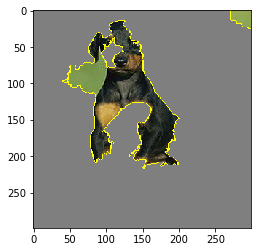

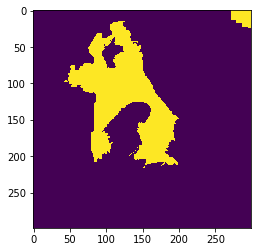

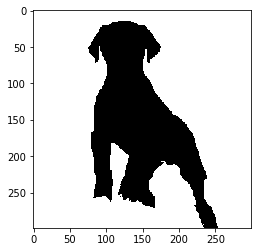

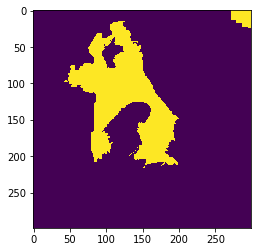

True Positive


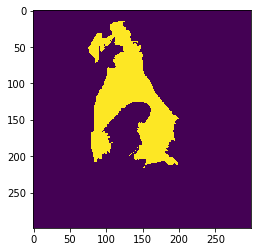

True Negative


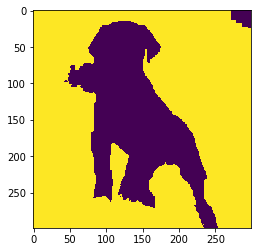

False Positive


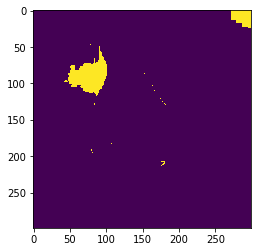

False Negative


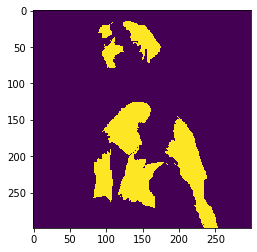

TP - FP: 12.357803603986532 2.762832630507489
FN - TN: 14.07926085837966 70.80010290712632
Acurracy: 83.15790651111286
Precision: 81.72806628199437
Recall: 46.74423524434101
Specificity: 96.24425995195085
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 

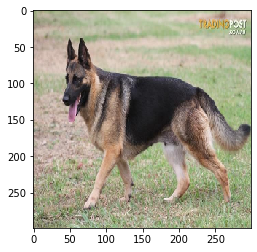

(1, 299, 299, 3)
Classpriori german_shepherd
german_shepherd, 100.00%
doberman, 0.00%
dalmatian, 0.00%
BACKGROUND_Google, 0.00%
airplanes, 0.00%


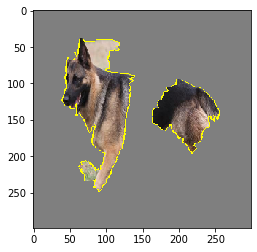

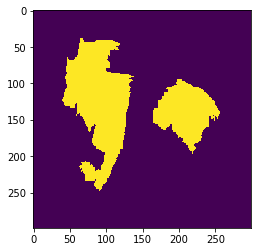

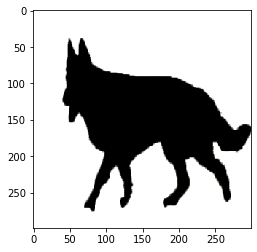

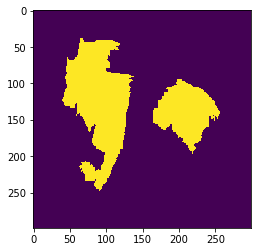

True Positive


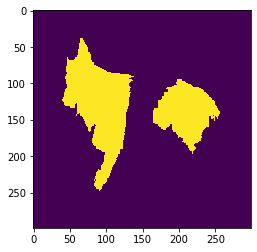

True Negative


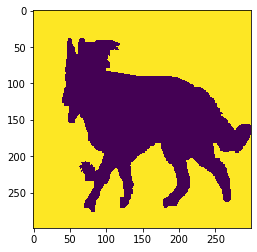

False Positive


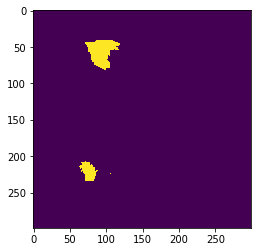

False Negative


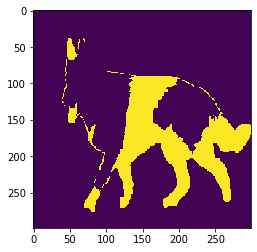

TP - FP: 16.035614814151966 1.724812921555687
FN - TN: 15.914810796299816 66.32476146799253
Acurracy: 82.3603762821445
Precision: 90.28844942687996
Recall: 50.18904915277973
Specificity: 97.46535825237932
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 

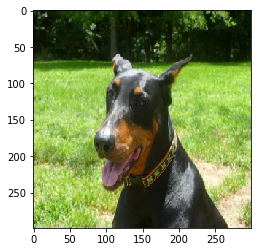

(1, 299, 299, 3)
Classpriori doberman
doberman, 100.00%
german_shepherd, 0.00%
BACKGROUND_Google, 0.00%
dalmatian, 0.00%
airplanes, 0.00%


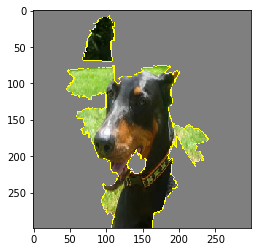

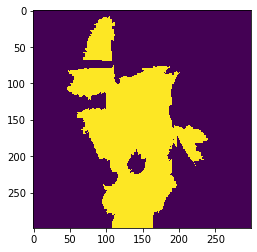

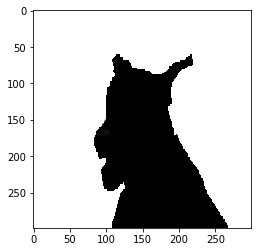

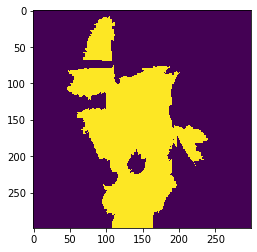

True Positive


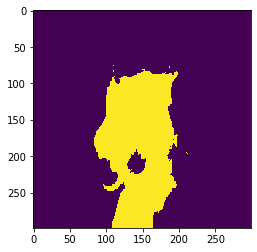

True Negative


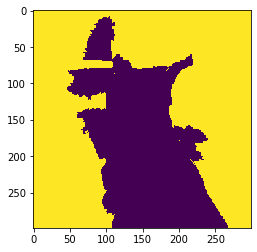

False Positive


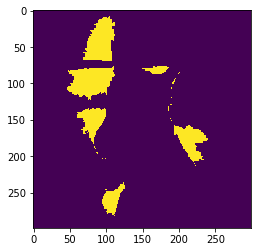

False Negative


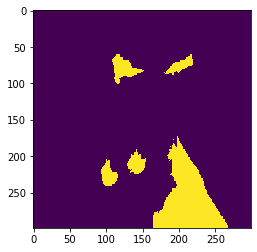

TP - FP: 19.094864710685563 7.930560060849431
FN - TN: 9.462981398418362 63.51159383004664
Acurracy: 82.6064585407322
Precision: 70.6551881130748
Recall: 66.86381261995221
Specificity: 88.89932675747612
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 0,

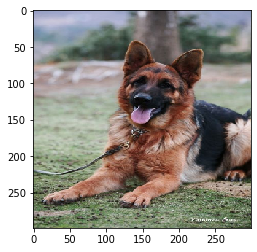

(1, 299, 299, 3)
Classpriori german_shepherd
german_shepherd, 100.00%
doberman, 0.00%
airplanes, 0.00%
BACKGROUND_Google, 0.00%
dalmatian, 0.00%


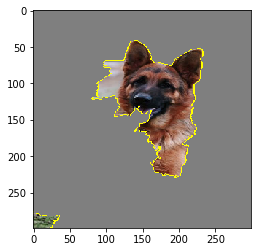

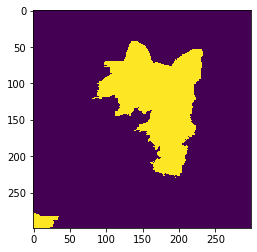

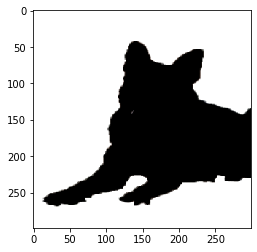

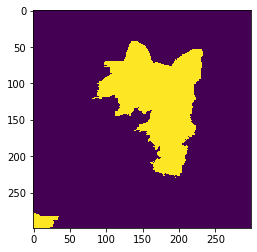

True Positive


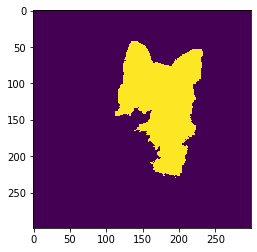

True Negative


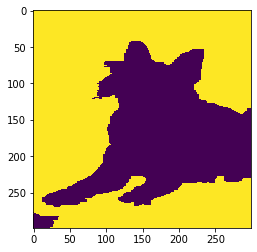

False Positive


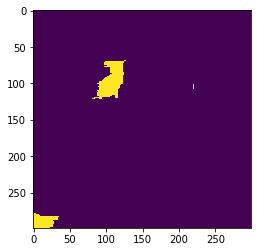

False Negative


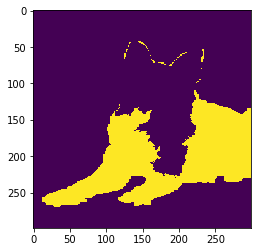

TP - FP: 14.267178219483004 2.0312971890694738
FN - TN: 21.786109775058442 61.91541481638908
Acurracy: 76.18259303587209
Precision: 87.53688833985314
Recall: 39.57247455944403
Specificity: 96.82345327012891
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png'

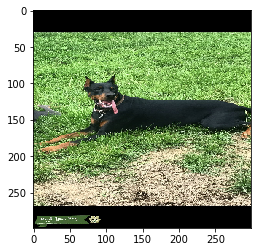

(1, 299, 299, 3)
Classpriori doberman
BACKGROUND_Google, 47.44%
doberman, 35.94%
dalmatian, 6.38%
german_shepherd, 5.40%
airplanes, 4.83%


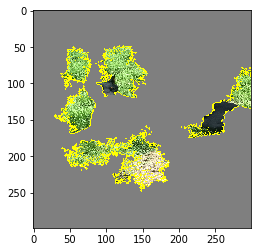

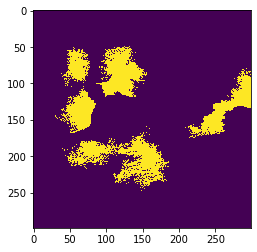

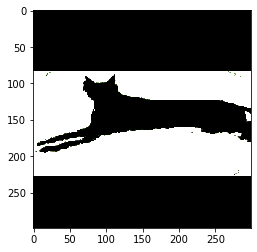

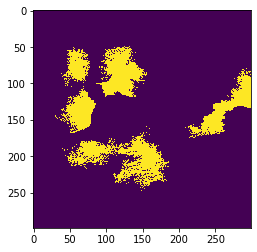

True Positive


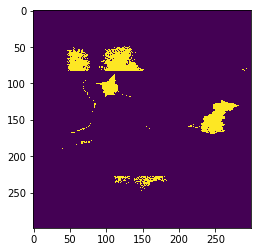

True Negative


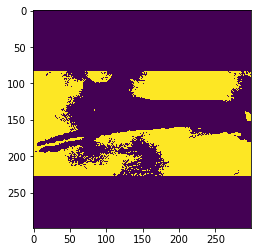

False Positive


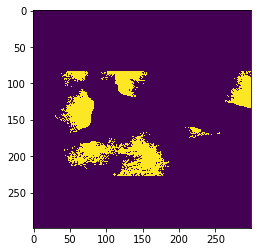

False Negative


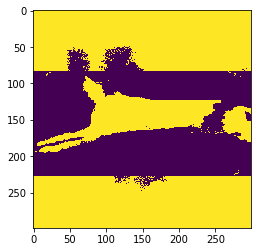

TP - FP: 4.492119774946588 8.338832898960861
FN - TN: 60.75099831098086 26.418049015111688
Acurracy: 30.910168790058272
Precision: 35.01002528114375
Recall: 6.885200932656699
Specificity: 76.00810993466996
clabel: 1
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png',

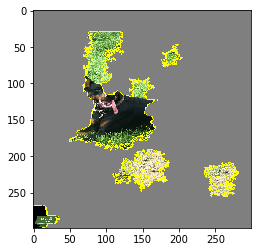

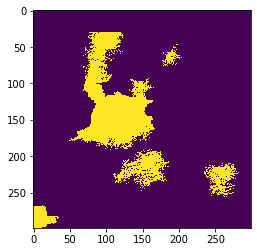

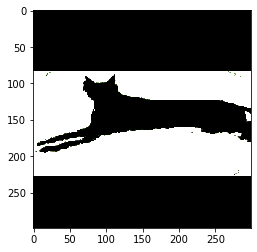

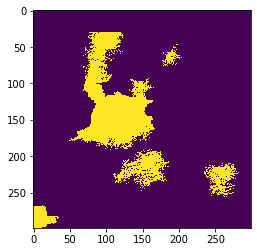

True Positive


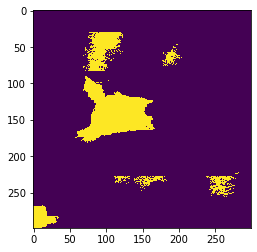

True Negative


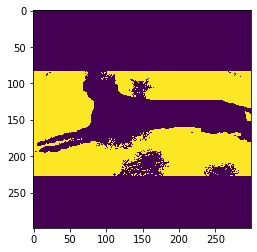

False Positive


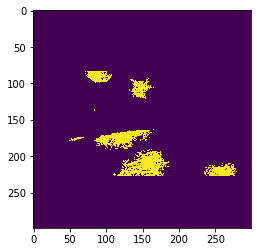

False Negative


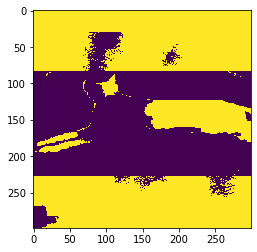

TP - FP: 9.33434749052024 4.193465397478775
FN - TN: 55.90877059540721 30.563416516593772
Acurracy: 39.89776400711401
Precision: 69.00115759880933
Recall: 14.307022356329721
Specificity: 87.93486306439674
clabel: 1
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 

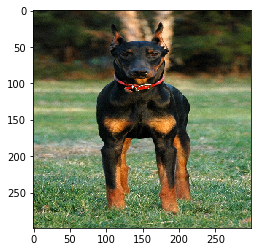

(1, 299, 299, 3)
Classpriori doberman
doberman, 95.39%
german_shepherd, 4.61%
dalmatian, 0.00%
BACKGROUND_Google, 0.00%
airplanes, 0.00%


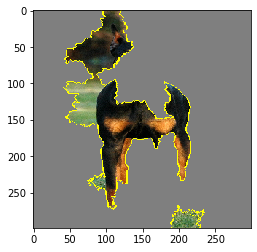

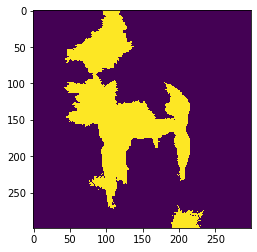

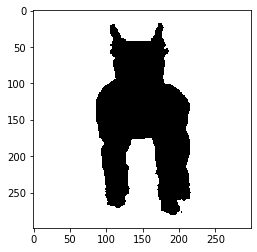

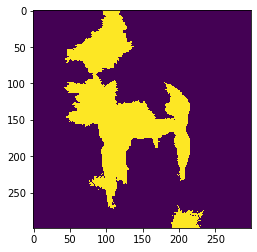

True Positive


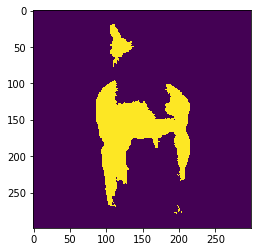

True Negative


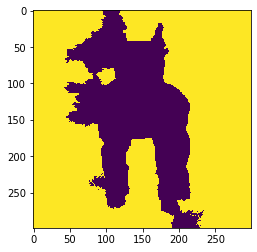

False Positive


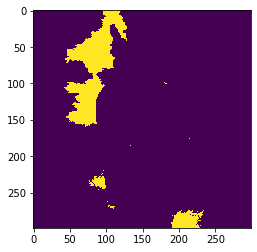

False Negative


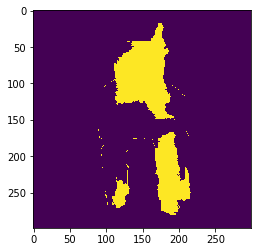

TP - FP: 11.974138991733874 7.338844084518071
FN - TN: 11.47861880739589 69.20839811635217
Acurracy: 81.18253710808605
Precision: 62.00046333835283
Recall: 51.05642199647065
Specificity: 90.41266037349855
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 

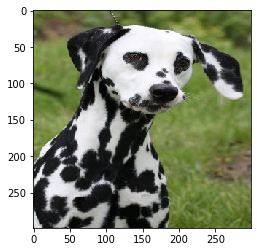

(1, 299, 299, 3)
Classpriori dalmatian
dalmatian, 100.00%
BACKGROUND_Google, 0.00%
doberman, 0.00%
german_shepherd, 0.00%
airplanes, 0.00%


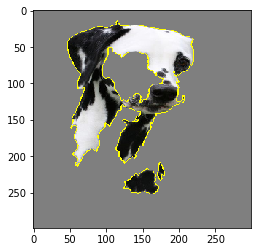

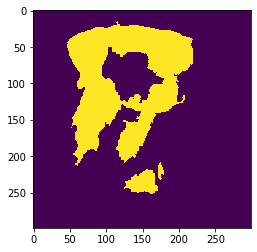

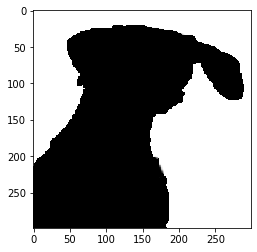

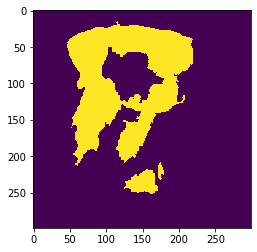

True Positive


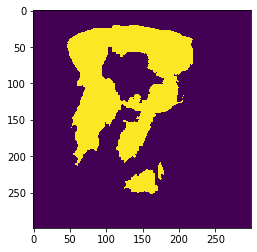

True Negative


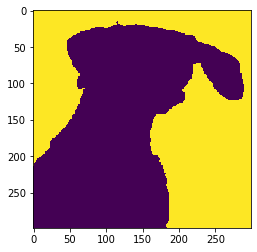

False Positive


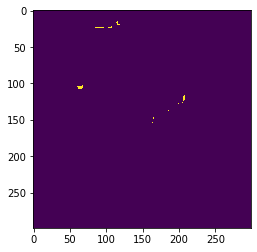

False Negative


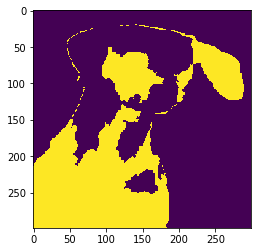

TP - FP: 20.53892014630709 0.10626279348105724
FN - TN: 31.979508059193968 47.37530900101788
Acurracy: 67.91422914732497
Precision: 99.48529013382456
Recall: 39.108025217243146
Specificity: 99.7762020306721
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png'

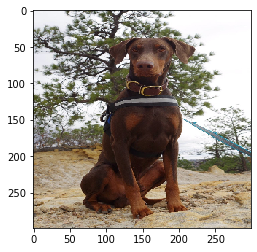

(1, 299, 299, 3)
Classpriori doberman
doberman, 100.00%
german_shepherd, 0.00%
BACKGROUND_Google, 0.00%
dalmatian, 0.00%
airplanes, 0.00%


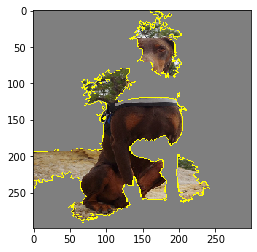

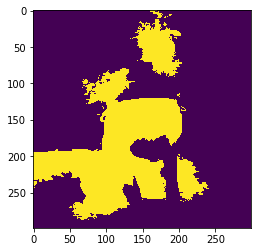

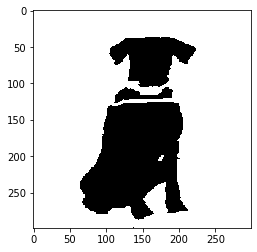

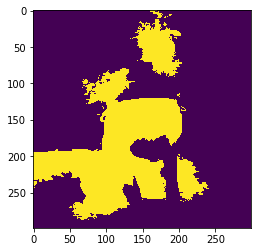

True Positive


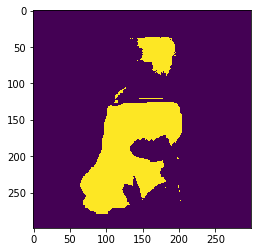

True Negative


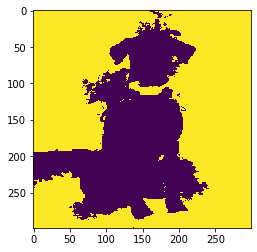

False Positive


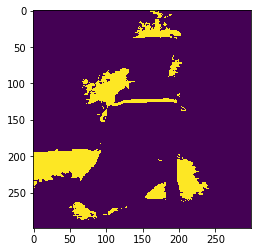

False Negative


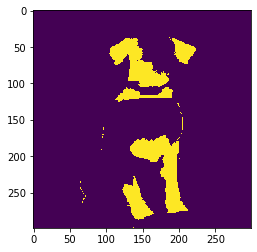

TP - FP: 15.912573684858112 10.00212525586962
FN - TN: 9.270589814431606 64.81471124484067
Acurracy: 80.72728492969878
Precision: 61.40366022099448
Recall: 63.1873500932753
Specificity: 86.63118393708793
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 0

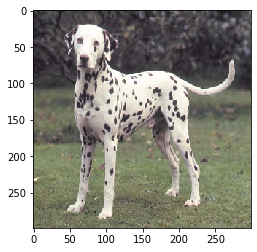

(1, 299, 299, 3)
Classpriori dalmatian
dalmatian, 100.00%
BACKGROUND_Google, 0.00%
german_shepherd, 0.00%
doberman, 0.00%
airplanes, 0.00%


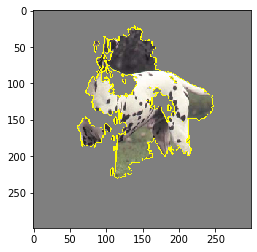

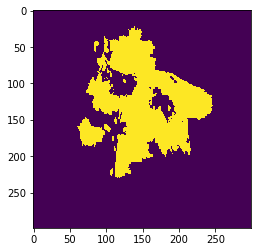

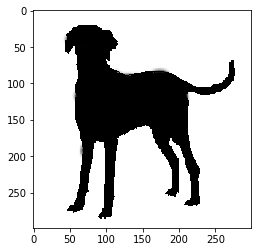

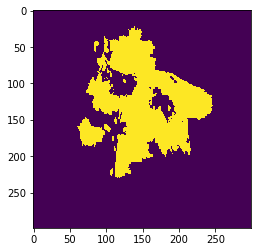

True Positive


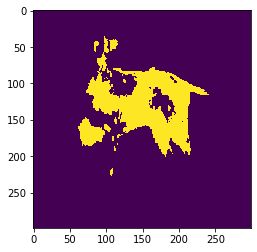

True Negative


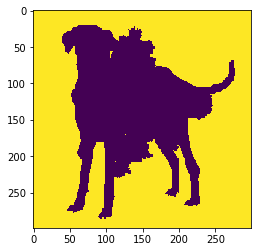

False Positive


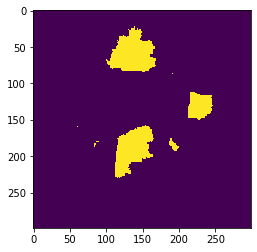

False Negative


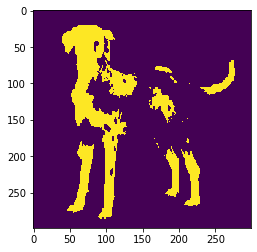

TP - FP: 11.778391740584556 6.834375454413262
FN - TN: 14.725786065032832 66.66144673996935
Acurracy: 78.4398384805539
Precision: 63.28125
Recall: 44.4397552226208
Specificity: 90.70100143061516
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 0, 'german

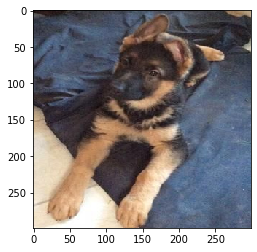

(1, 299, 299, 3)
Classpriori german_shepherd
german_shepherd, 100.00%
doberman, 0.00%
BACKGROUND_Google, 0.00%
dalmatian, 0.00%
airplanes, 0.00%


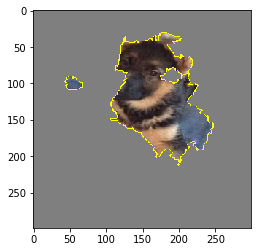

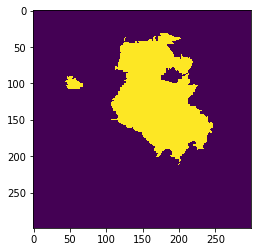

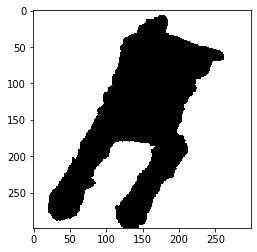

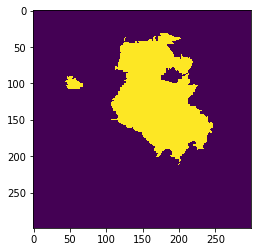

True Positive


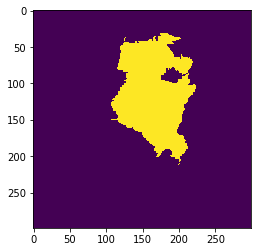

True Negative


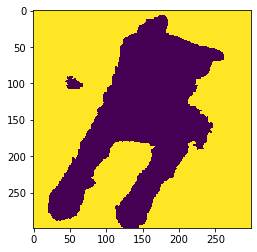

False Positive


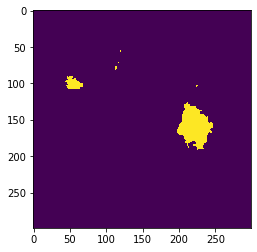

False Negative


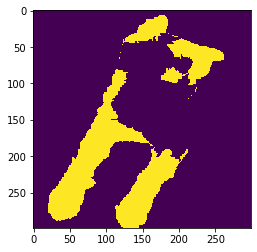

TP - FP: 13.789554926678674 2.4283844699723716
FN - TN: 17.839845191888234 65.94221541146072
Acurracy: 79.7317703381394
Precision: 85.0265535554176
Recall: 43.59726986596881
Specificity: 96.44820365159347
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 

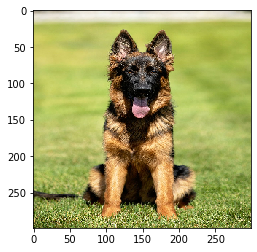

(1, 299, 299, 3)
Classpriori german_shepherd
german_shepherd, 100.00%
doberman, 0.00%
airplanes, 0.00%
BACKGROUND_Google, 0.00%
dalmatian, 0.00%


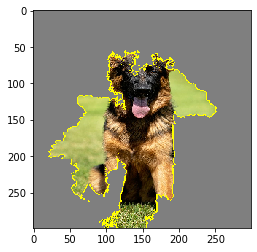

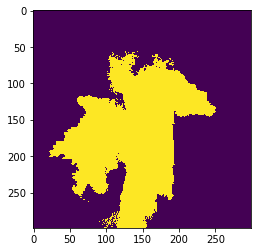

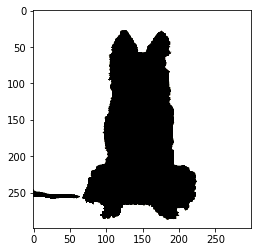

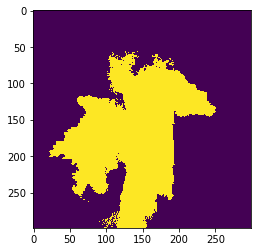

True Positive


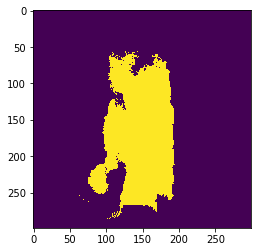

True Negative


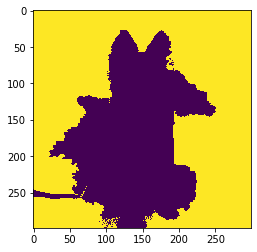

False Positive


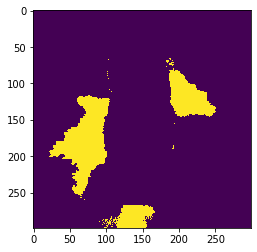

False Negative


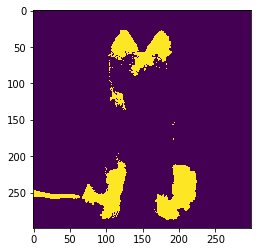

TP - FP: 18.80739589042628 10.382434200959722
FN - TN: 8.750461404234851 62.05970850437914
Acurracy: 80.86710439480542
Precision: 64.431330472103
Recall: 68.24694565085035
Specificity: 85.66796368352789
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 0,

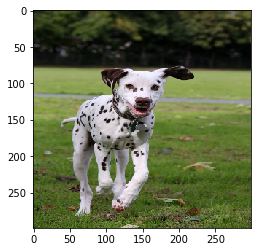

(1, 299, 299, 3)
Classpriori dalmatian
dalmatian, 100.00%
BACKGROUND_Google, 0.00%
german_shepherd, 0.00%
doberman, 0.00%
airplanes, 0.00%


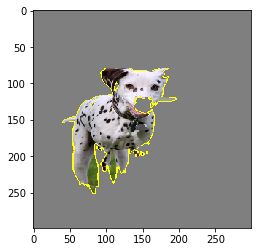

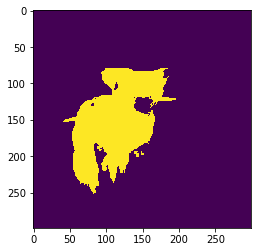

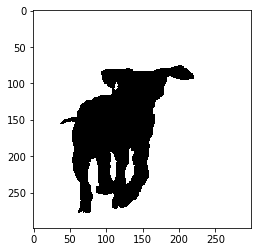

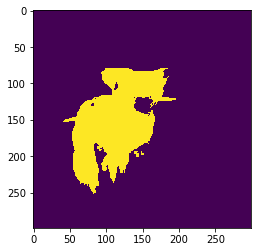

True Positive


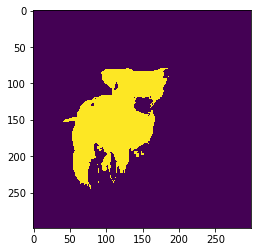

True Negative


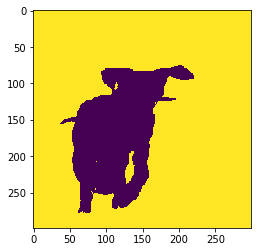

False Positive


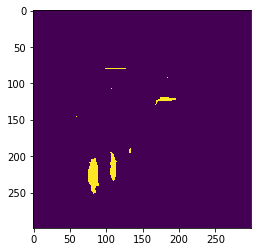

False Negative


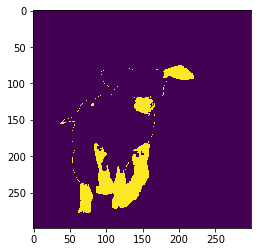

TP - FP: 13.196720394626457 1.0335454860683884
FN - TN: 5.873536090200333 79.89619802910481
Acurracy: 93.09291842373128
Precision: 92.73699103914478
Recall: 69.20053962109215
Specificity: 98.72291021671826
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png',

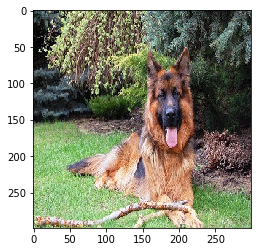

(1, 299, 299, 3)
Classpriori german_shepherd
german_shepherd, 100.00%
doberman, 0.00%
airplanes, 0.00%
BACKGROUND_Google, 0.00%
dalmatian, 0.00%


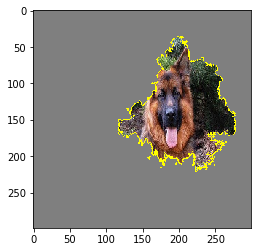

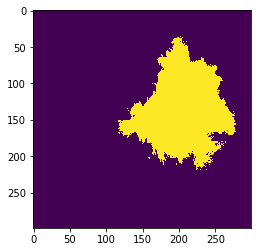

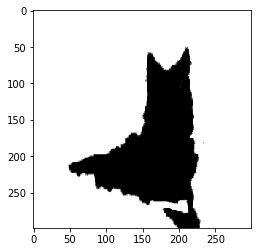

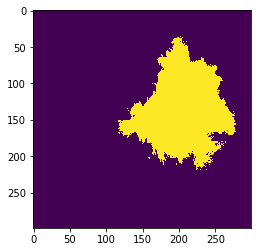

True Positive


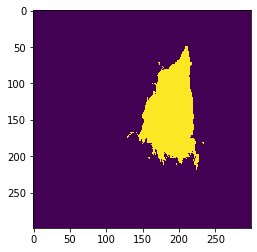

True Negative


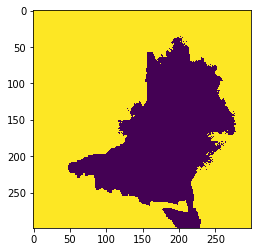

False Positive


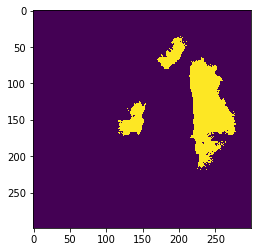

False Negative


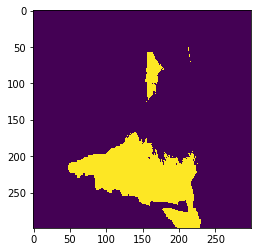

TP - FP: 8.832115971857139 8.014451739913424
FN - TN: 13.210143063276696 69.94328922495274
Acurracy: 78.77540519680987
Precision: 52.426797689396466
Recall: 40.06901451334619
Specificity: 89.71949207260205
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png',

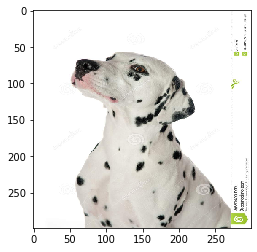

(1, 299, 299, 3)
Classpriori dalmatian
dalmatian, 100.00%
BACKGROUND_Google, 0.00%
german_shepherd, 0.00%
doberman, 0.00%
airplanes, 0.00%


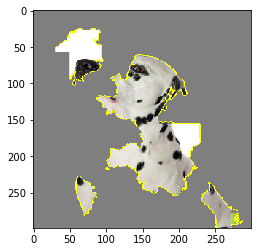

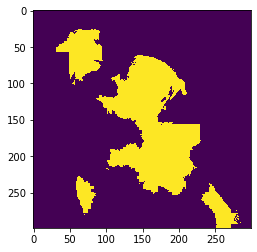

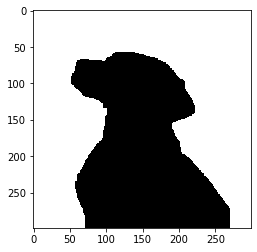

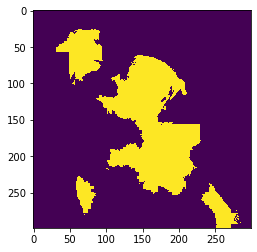

True Positive


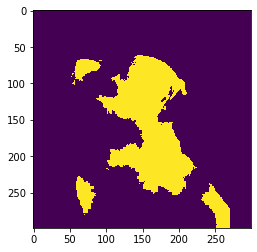

True Negative


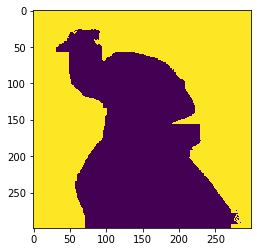

False Positive


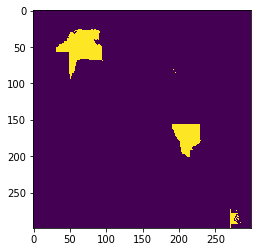

False Negative


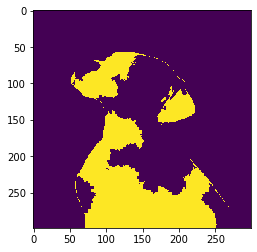

TP - FP: 17.615015491996733 3.841120345410007
FN - TN: 21.696625317390186 56.84723884520307
Acurracy: 74.46225433719981
Precision: 82.09780002085287
Recall: 44.80864987907241
Specificity: 93.67074609259805
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png',

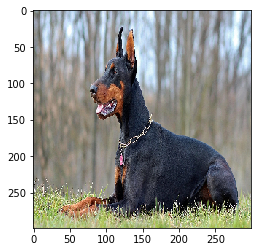

(1, 299, 299, 3)
Classpriori doberman
doberman, 100.00%
german_shepherd, 0.00%
BACKGROUND_Google, 0.00%
dalmatian, 0.00%
airplanes, 0.00%


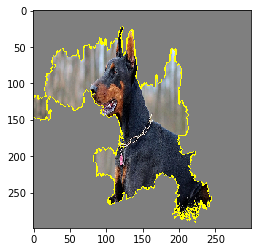

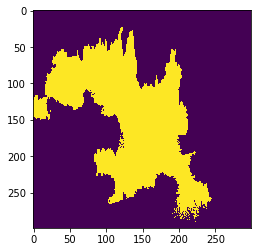

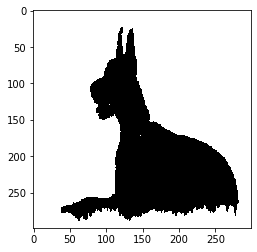

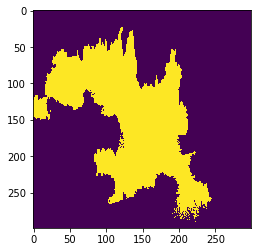

True Positive


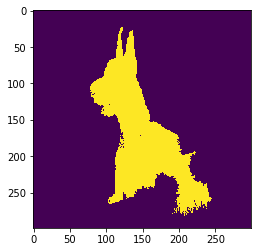

True Negative


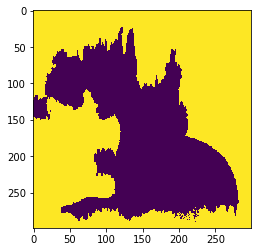

False Positive


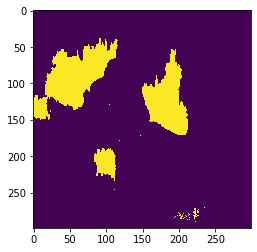

False Negative


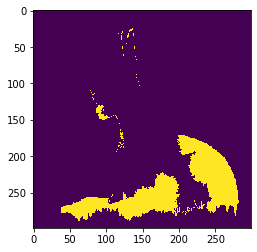

TP - FP: 16.845449156049707 11.967427657408754
FN - TN: 10.414872316864464 60.772250869677066
Acurracy: 77.61770002572679
Precision: 58.465002523389884
Recall: 61.79475606253334
Specificity: 83.54759341842227
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.pn

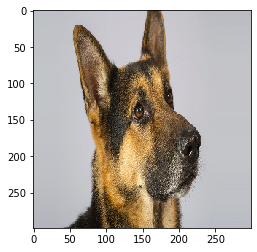

(1, 299, 299, 3)
Classpriori german_shepherd
german_shepherd, 100.00%
doberman, 0.00%
BACKGROUND_Google, 0.00%
dalmatian, 0.00%
airplanes, 0.00%


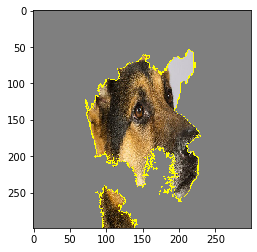

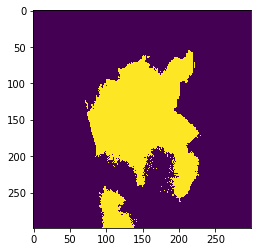

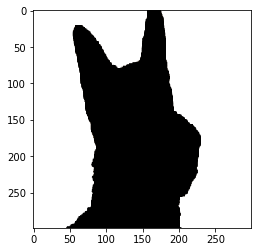

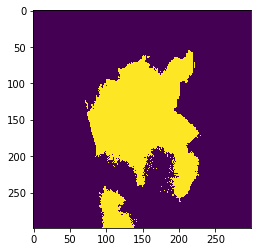

True Positive


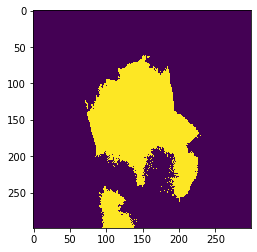

True Negative


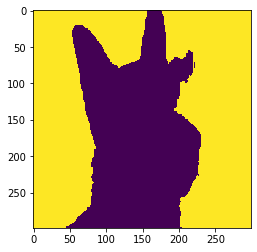

False Positive


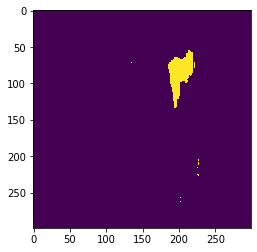

False Negative


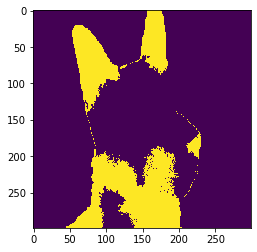

TP - FP: 20.144069976845895 1.598416125099272
FN - TN: 18.380107605060346 59.877406292994486
Acurracy: 80.02147626984038
Precision: 92.64842061940529
Recall: 52.28942249063615
Specificity: 97.39992721979623
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png'

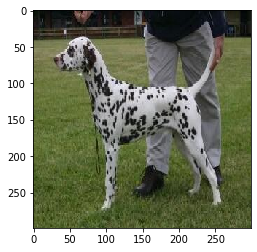

(1, 299, 299, 3)
Classpriori dalmatian
dalmatian, 100.00%
BACKGROUND_Google, 0.00%
german_shepherd, 0.00%
doberman, 0.00%
airplanes, 0.00%


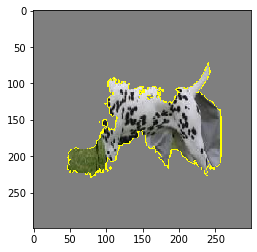

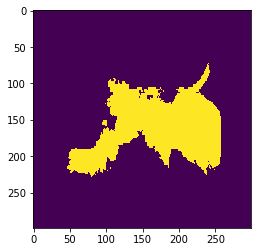

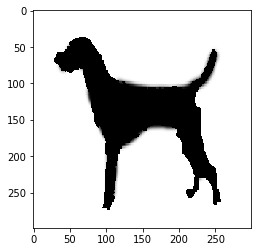

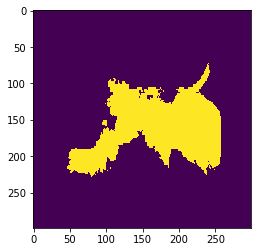

True Positive


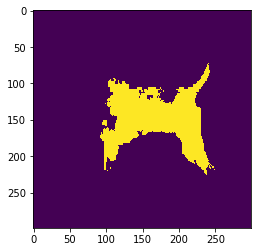

True Negative


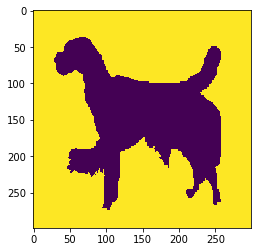

False Positive


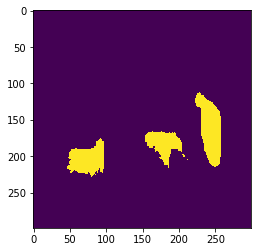

False Negative


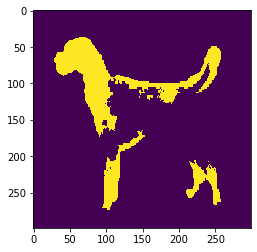

TP - FP: 11.185557208532343 5.91044842898849
FN - TN: 11.63745371975705 71.26654064272212
Acurracy: 82.45209785125446
Precision: 65.4278984559016
Recall: 49.00999803960008
Specificity: 92.3416960157688
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 0, 

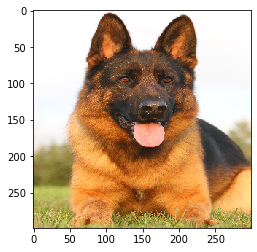

(1, 299, 299, 3)
Classpriori german_shepherd
german_shepherd, 100.00%
doberman, 0.00%
airplanes, 0.00%
BACKGROUND_Google, 0.00%
dalmatian, 0.00%


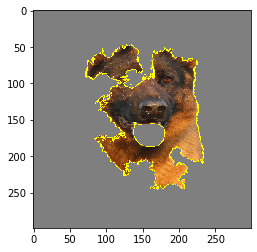

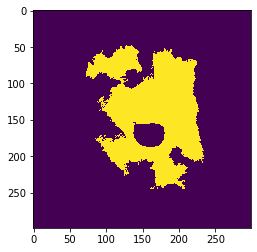

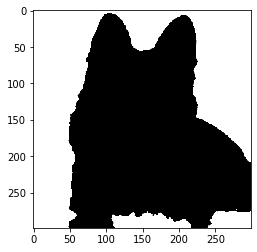

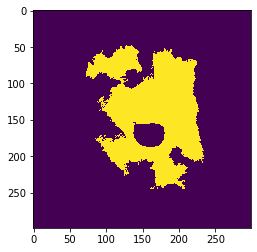

True Positive


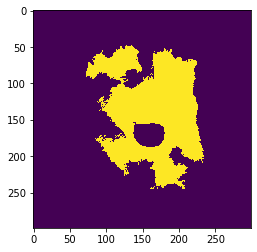

True Negative


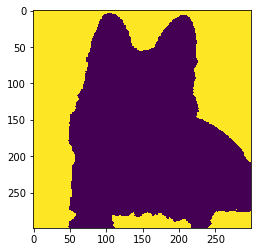

False Positive


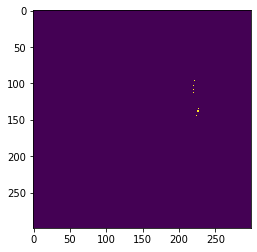

False Negative


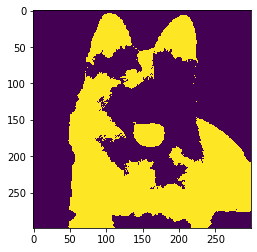

TP - FP: 19.431549982662386 0.016778335812798514
FN - TN: 37.95035849710853 42.601313184416284
Acurracy: 62.03286316707868
Precision: 99.91372864784034
Recall: 33.863547758284604
Specificity: 99.9606309545681
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.pn

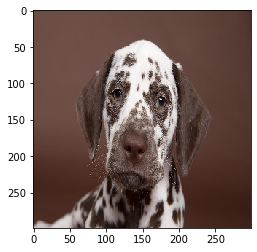

(1, 299, 299, 3)
Classpriori dalmatian
dalmatian, 100.00%
BACKGROUND_Google, 0.00%
german_shepherd, 0.00%
doberman, 0.00%
airplanes, 0.00%


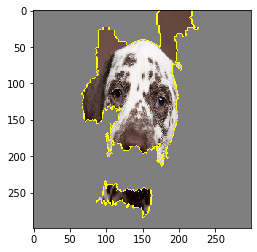

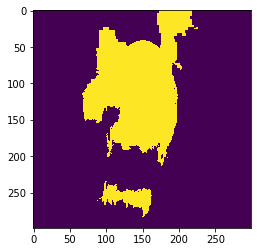

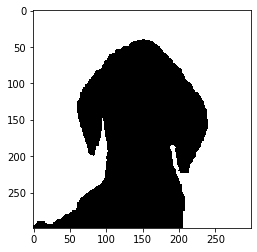

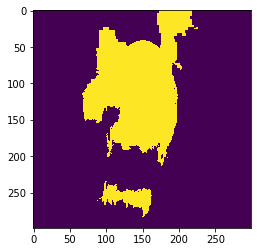

True Positive


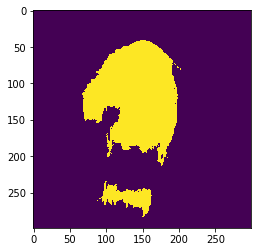

True Negative


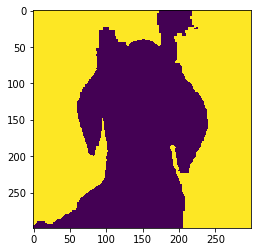

False Positive


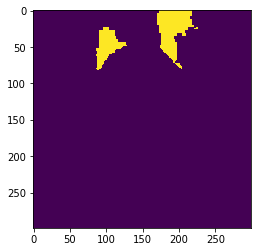

False Negative


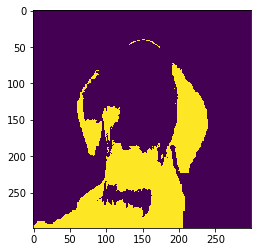

TP - FP: 17.825303967517144 3.7147235489535912
FN - TN: 20.963971320231316 57.49600116329795
Acurracy: 75.32130513081509
Precision: 82.7543231032871
Recall: 45.95420727838977
Specificity: 93.93125376898196
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png',

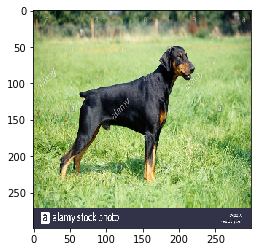

(1, 299, 299, 3)
Classpriori doberman
doberman, 99.99%
german_shepherd, 0.01%
BACKGROUND_Google, 0.00%
dalmatian, 0.00%
airplanes, 0.00%


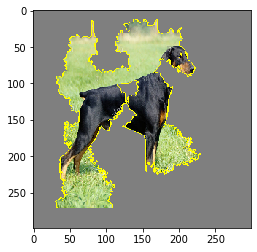

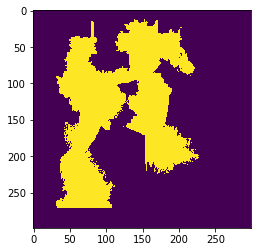

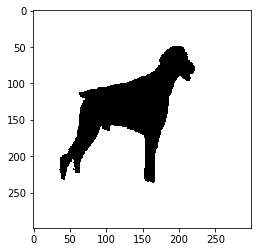

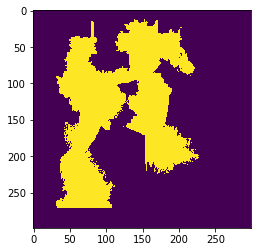

True Positive


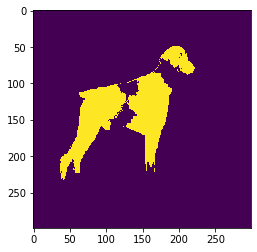

True Negative


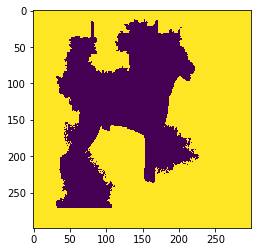

False Positive


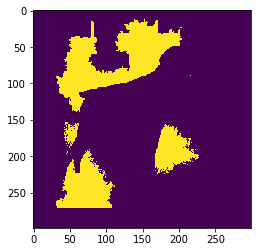

False Negative


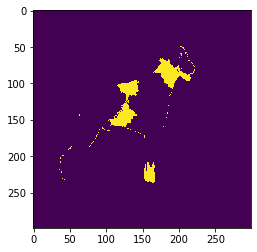

TP - FP: 11.152000536906746 16.764913144148274
FN - TN: 2.782966633482847 69.30011968546214
Acurracy: 80.45212022236888
Precision: 39.9471111467265
Recall: 80.02889709423664
Specificity: 80.52064515290542
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 

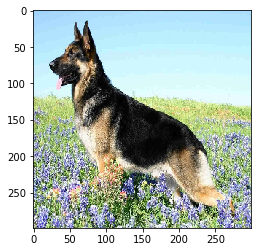

(1, 299, 299, 3)
Classpriori german_shepherd
german_shepherd, 100.00%
doberman, 0.00%
dalmatian, 0.00%
BACKGROUND_Google, 0.00%
airplanes, 0.00%


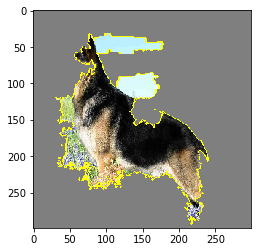

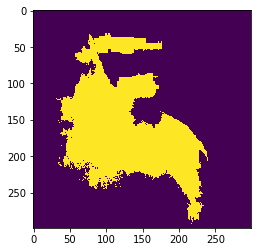

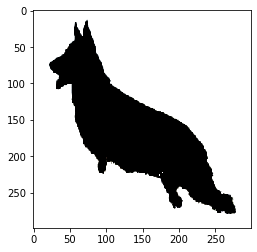

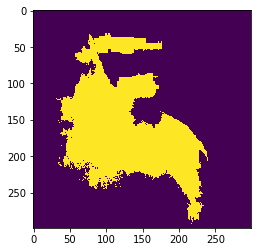

True Positive


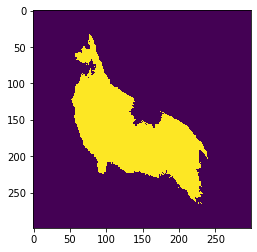

True Negative


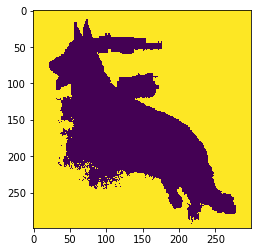

False Positive


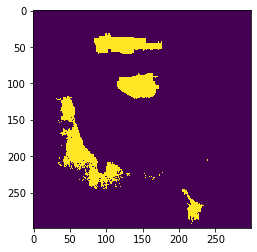

False Negative


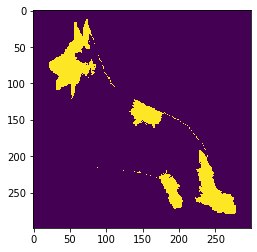

TP - FP: 18.725741322803994 7.639735573427591
FN - TN: 7.622957237614791 66.01156586615362
Acurracy: 84.73730718895762
Precision: 71.02371558270757
Recall: 71.06894209543216
Specificity: 89.62715468144886
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 

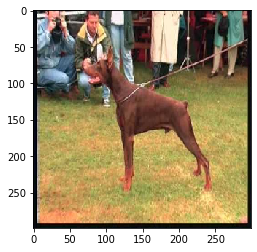

(1, 299, 299, 3)
Classpriori doberman
doberman, 99.91%
german_shepherd, 0.07%
BACKGROUND_Google, 0.02%
dalmatian, 0.00%
airplanes, 0.00%


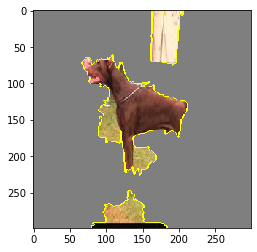

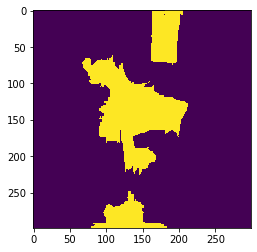

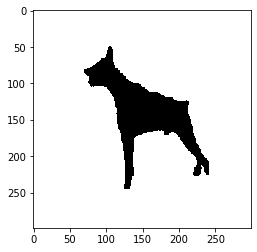

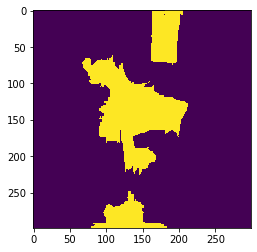

True Positive


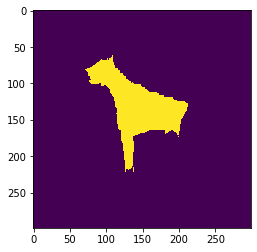

True Negative


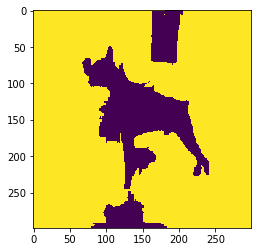

False Positive


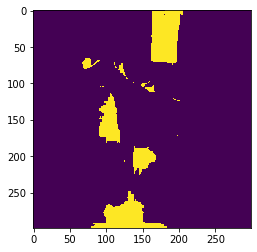

False Negative


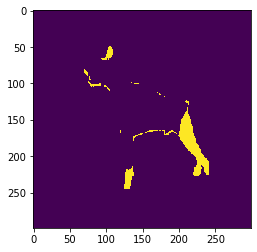

TP - FP: 8.339951454681716 8.211317546783594
FN - TN: 2.3366629008624065 81.11206809767228
Acurracy: 89.45201955235399
Precision: 50.38859228221937
Recall: 78.11419591409116
Specificity: 90.80720296533761
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 

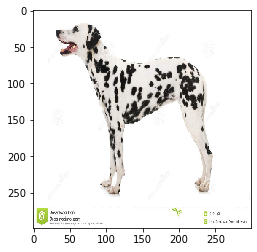

(1, 299, 299, 3)
Classpriori dalmatian
dalmatian, 100.00%
BACKGROUND_Google, 0.00%
german_shepherd, 0.00%
doberman, 0.00%
airplanes, 0.00%


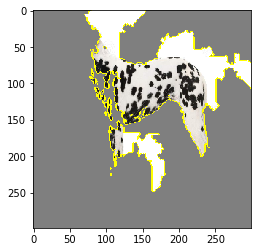

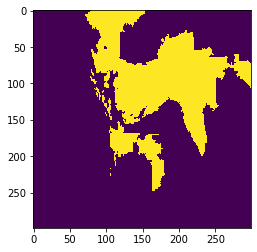

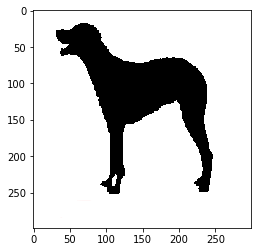

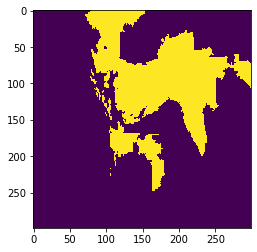

True Positive


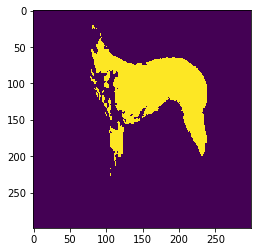

True Negative


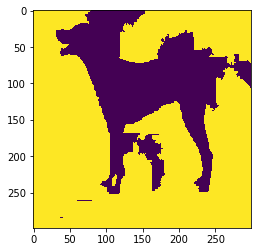

False Positive


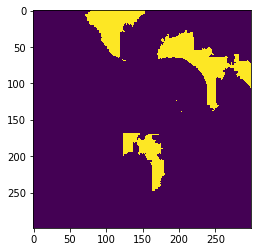

False Negative


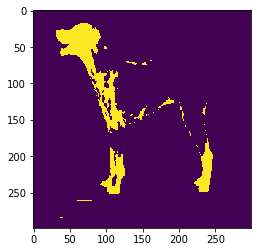

TP - FP: 13.028937036498473 9.505486515810786
FN - TN: 7.109540161743157 70.35603628594758
Acurracy: 83.38497332244606
Precision: 57.81792911744267
Recall: 64.69673405909798
Specificity: 88.09753911228762
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 

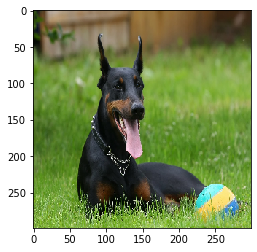

(1, 299, 299, 3)
Classpriori doberman
doberman, 99.99%
german_shepherd, 0.01%
BACKGROUND_Google, 0.00%
dalmatian, 0.00%
airplanes, 0.00%


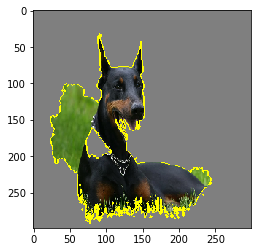

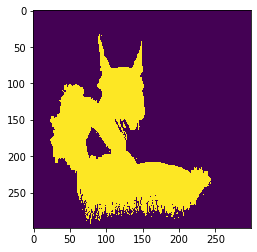

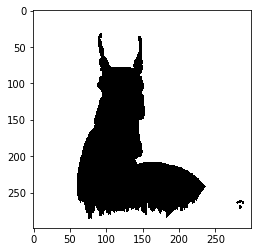

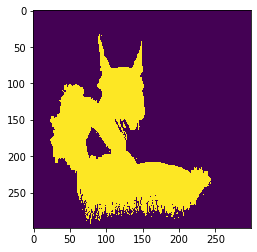

True Positive


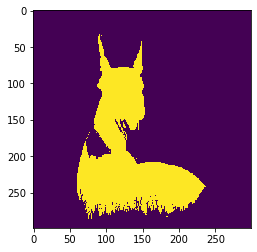

True Negative


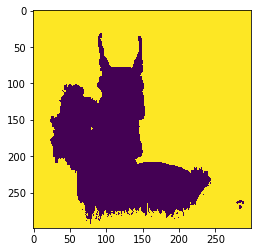

False Positive


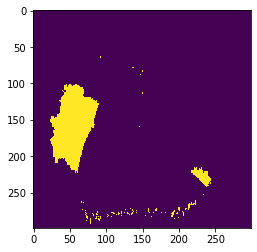

False Negative


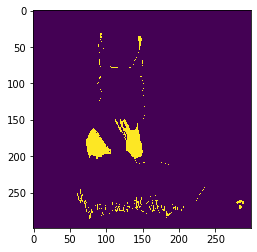

TP - FP: 19.472936544333955 6.13863379604255
FN - TN: 2.8120490822250312 71.57638057739847
Acurracy: 91.04931712173243
Precision: 76.03179455823907
Recall: 87.38141846107514
Specificity: 92.10109675005037
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 

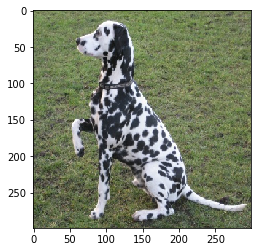

(1, 299, 299, 3)
Classpriori dalmatian
dalmatian, 100.00%
BACKGROUND_Google, 0.00%
german_shepherd, 0.00%
doberman, 0.00%
airplanes, 0.00%


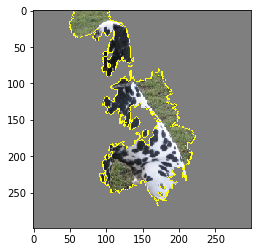

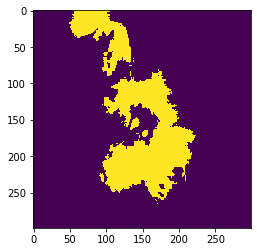

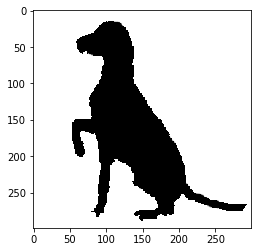

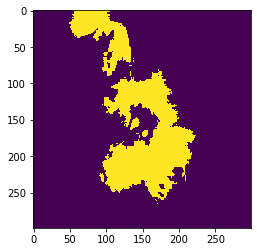

True Positive


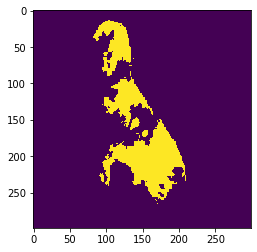

True Negative


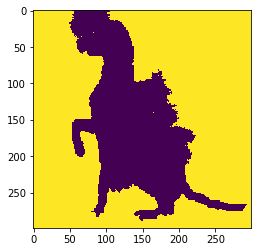

False Positive


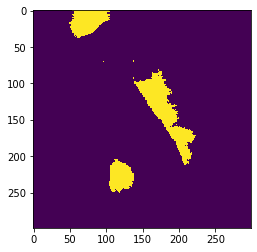

False Negative


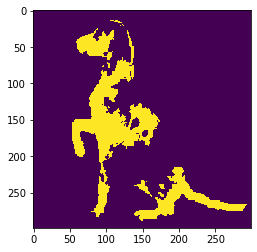

TP - FP: 10.801892596279682 6.493215959553026
FN - TN: 13.219091509043523 69.48579993512377
Acurracy: 80.28769253140345
Precision: 62.45634458672874
Recall: 44.9685681024447
Specificity: 91.4539351647381
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 0

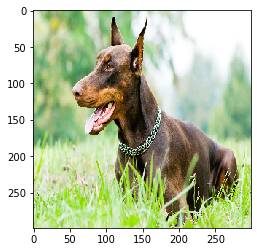

(1, 299, 299, 3)
Classpriori doberman
doberman, 99.98%
german_shepherd, 0.02%
BACKGROUND_Google, 0.00%
dalmatian, 0.00%
airplanes, 0.00%


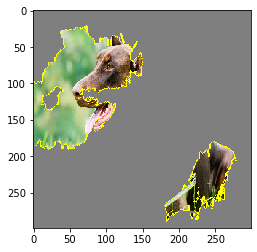

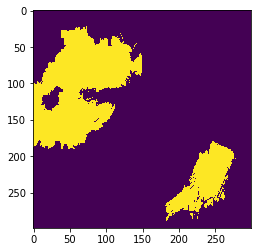

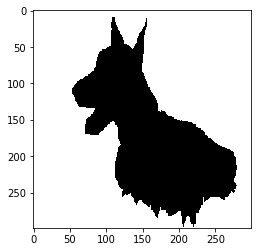

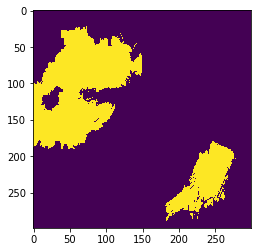

True Positive


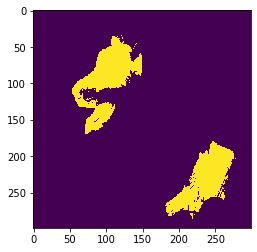

True Negative


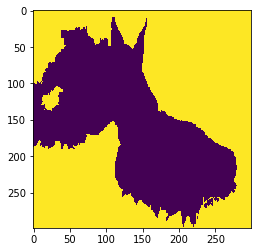

False Positive


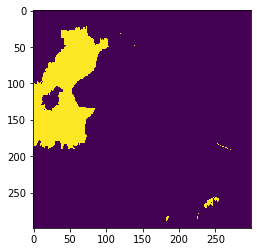

False Negative


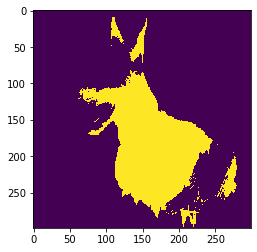

TP - FP: 10.249326070178185 10.56587733917965
FN - TN: 20.506482030402346 58.67831456023982
Acurracy: 68.92764063041801
Precision: 49.23961523993767
Recall: 33.32484725050916
Specificity: 84.74113561101689
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png',

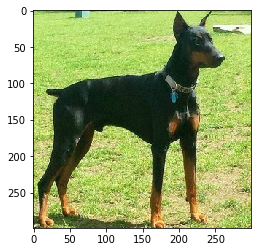

(1, 299, 299, 3)
Classpriori doberman
doberman, 100.00%
german_shepherd, 0.00%
BACKGROUND_Google, 0.00%
dalmatian, 0.00%
airplanes, 0.00%


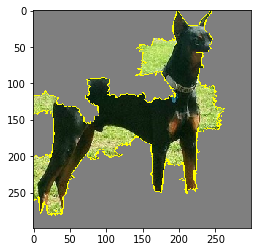

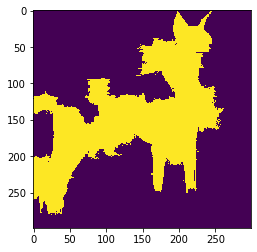

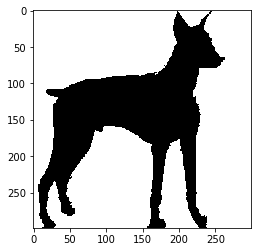

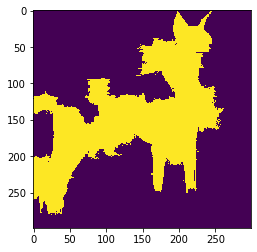

True Positive


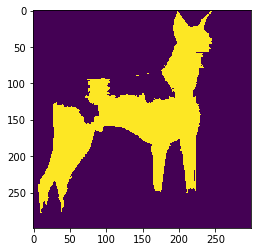

True Negative


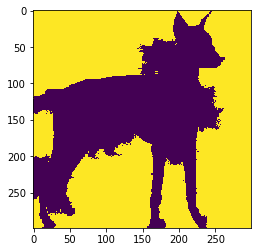

False Positive


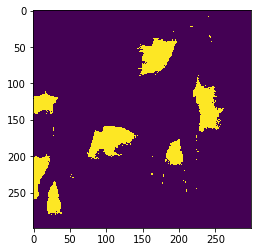

False Negative


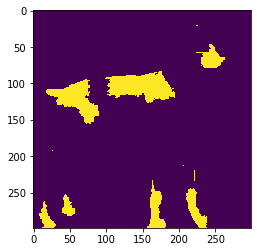

TP - FP: 23.13285086296574 8.625183163499289
FN - TN: 8.322054563148065 59.9199114103869
Acurracy: 83.05276227335264
Precision: 72.84094111017188
Recall: 73.54290387966287
Specificity: 87.41677545691905
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 0,

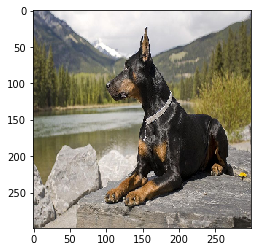

(1, 299, 299, 3)
Classpriori doberman
doberman, 100.00%
german_shepherd, 0.00%
BACKGROUND_Google, 0.00%
dalmatian, 0.00%
airplanes, 0.00%


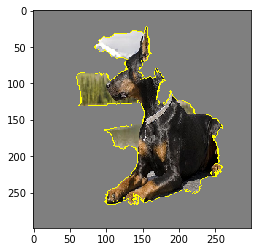

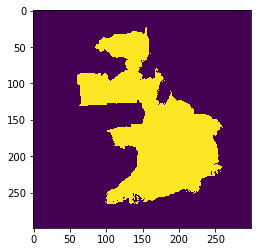

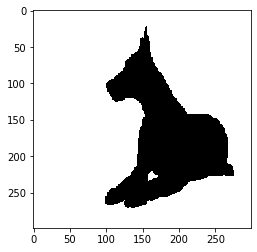

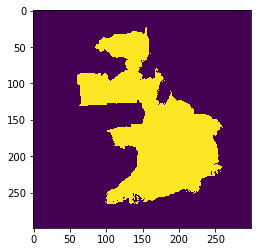

True Positive


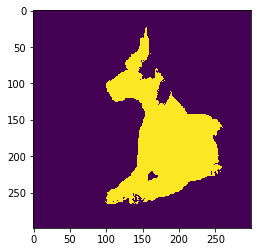

True Negative


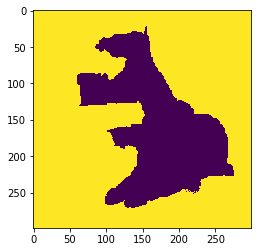

False Positive


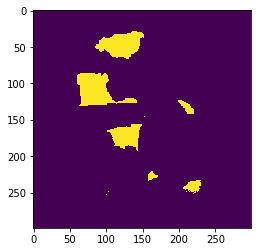

False Negative


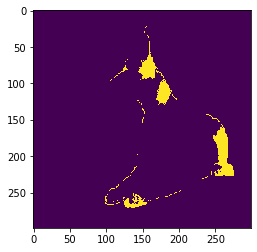

TP - FP: 18.545653851746625 5.72700529076856
FN - TN: 2.9451572130065657 72.78218364447825
Acurracy: 91.32783749622487
Precision: 76.40552995391705
Recall: 86.29573726122936
Specificity: 92.70530575027071
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 

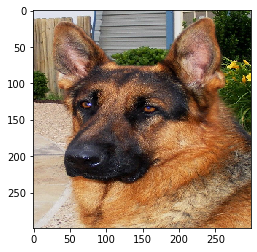

(1, 299, 299, 3)
Classpriori german_shepherd
german_shepherd, 100.00%
doberman, 0.00%
dalmatian, 0.00%
airplanes, 0.00%
BACKGROUND_Google, 0.00%


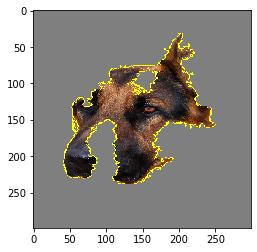

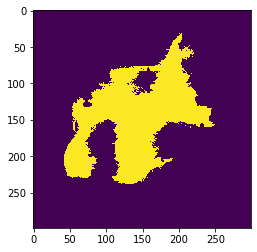

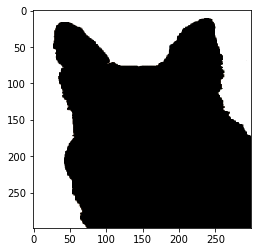

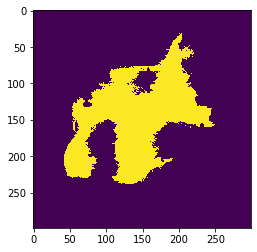

True Positive


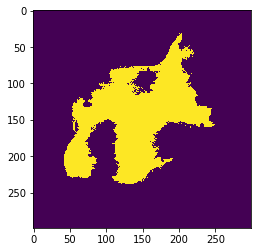

True Negative


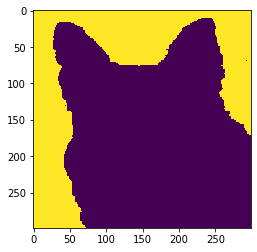

False Positive


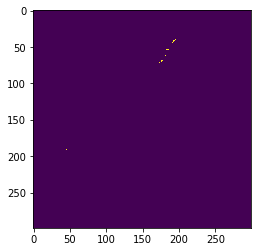

False Negative


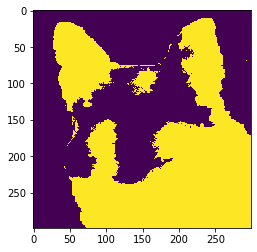

TP - FP: 20.289482220556817 0.030201004463037324
FN - TN: 46.64153644813817 33.03878032684198
Acurracy: 53.32826254739879
Precision: 99.85137069250247
Recall: 30.314019753664116
Specificity: 99.90867271005277
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.pn

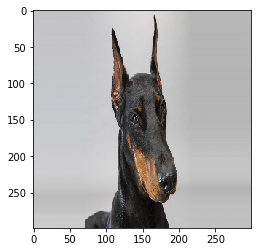

(1, 299, 299, 3)
Classpriori doberman
doberman, 99.70%
german_shepherd, 0.30%
BACKGROUND_Google, 0.00%
dalmatian, 0.00%
airplanes, 0.00%


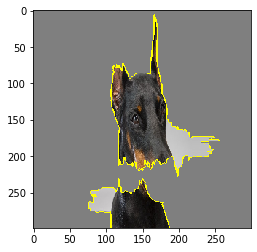

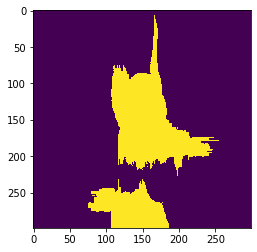

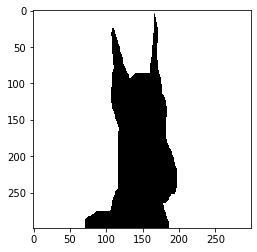

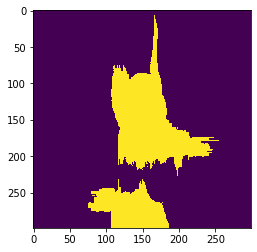

True Positive


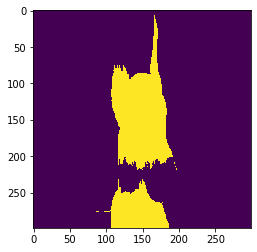

True Negative


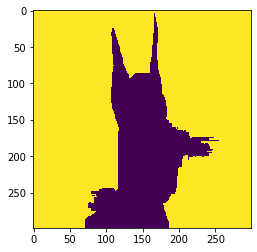

False Positive


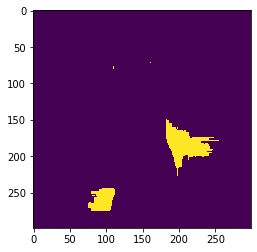

False Negative


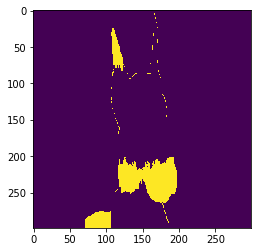

TP - FP: 14.252636995111912 3.2494043690786456
FN - TN: 5.409335466046241 77.08862316976321
Acurracy: 91.34126016487512
Precision: 81.43414072985237
Recall: 72.48833769484582
Specificity: 95.95533464210628
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png',

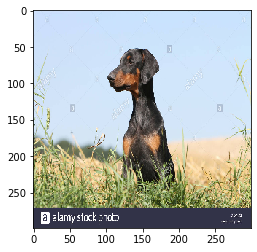

(1, 299, 299, 3)
Classpriori doberman
doberman, 99.97%
german_shepherd, 0.03%
BACKGROUND_Google, 0.00%
dalmatian, 0.00%
airplanes, 0.00%


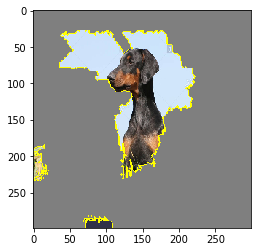

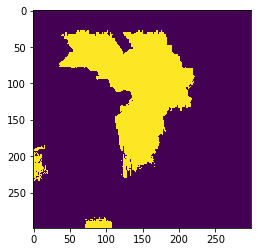

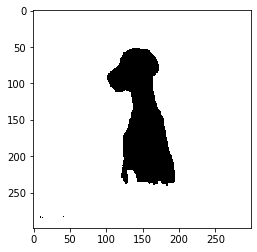

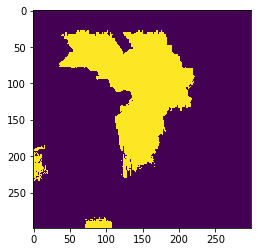

True Positive


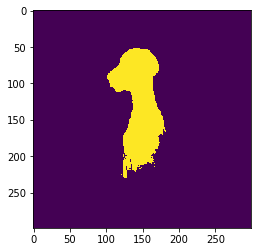

True Negative


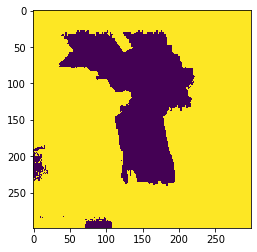

False Positive


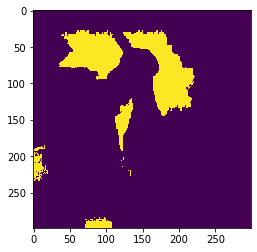

False Negative


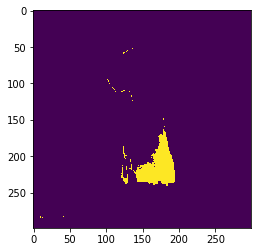

TP - FP: 8.449569915325332 11.544613594926231
FN - TN: 2.6286059440051006 77.37721054574334
Acurracy: 85.82678046106867
Precision: 42.26013986013986
Recall: 76.27221324717286
Specificity: 87.01712014289848
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png',

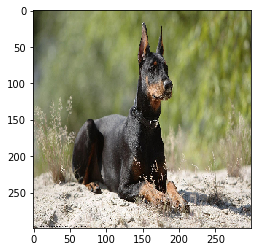

(1, 299, 299, 3)
Classpriori doberman
doberman, 99.92%
german_shepherd, 0.07%
BACKGROUND_Google, 0.01%
dalmatian, 0.00%
airplanes, 0.00%


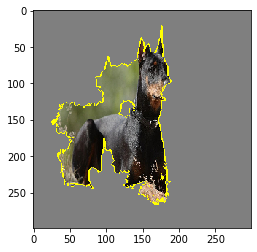

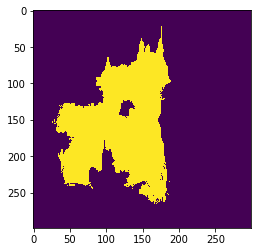

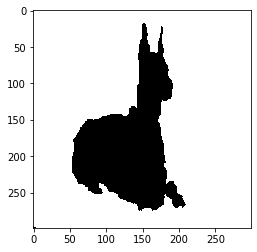

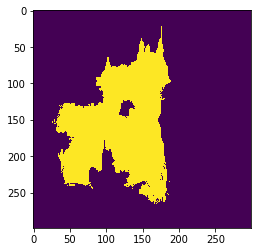

True Positive


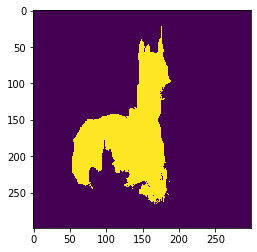

True Negative


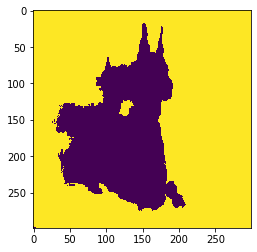

False Positive


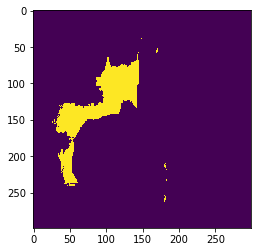

False Negative


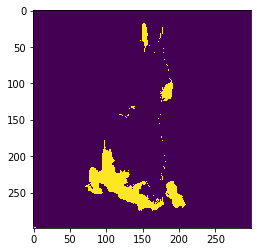

TP - FP: 15.602733750181766 6.633035424659679
FN - TN: 4.74155770069686 73.02267312446169
Acurracy: 88.62540687464346
Precision: 70.16952563006188
Recall: 76.69342423575985
Specificity: 91.6728687177903
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 0,

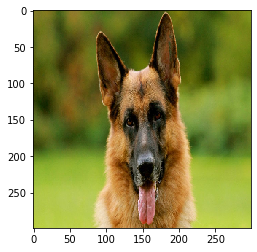

(1, 299, 299, 3)
Classpriori german_shepherd
german_shepherd, 100.00%
doberman, 0.00%
airplanes, 0.00%
BACKGROUND_Google, 0.00%
dalmatian, 0.00%


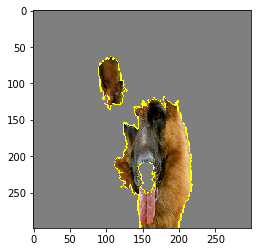

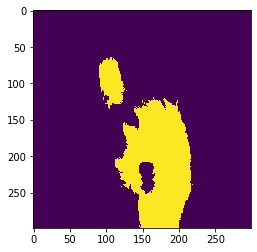

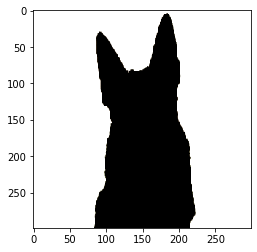

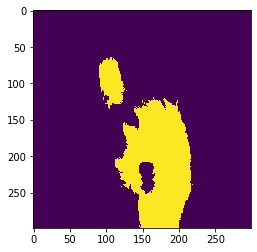

True Positive


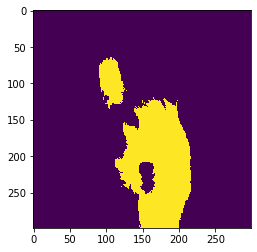

True Negative


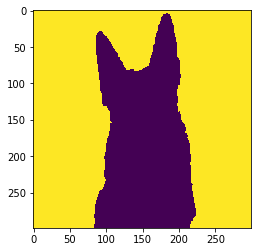

False Positive


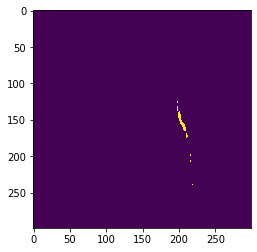

False Negative


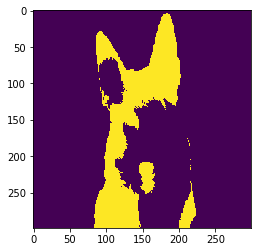

TP - FP: 15.654187313341014 0.14764935515262692
FN - TN: 16.301831075715036 67.89633225579132
Acurracy: 83.55051956913233
Precision: 99.06561902739435
Recall: 48.98666386642865
Specificity: 99.78300894266177
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png

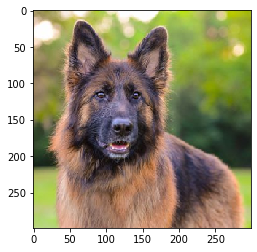

(1, 299, 299, 3)
Classpriori german_shepherd
german_shepherd, 100.00%
airplanes, 0.00%
doberman, 0.00%
BACKGROUND_Google, 0.00%
dalmatian, 0.00%


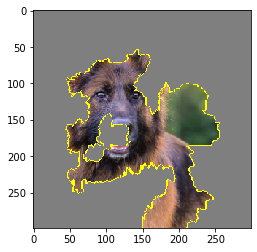

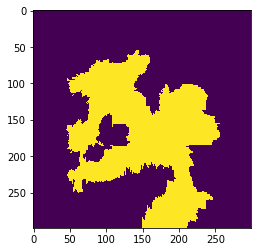

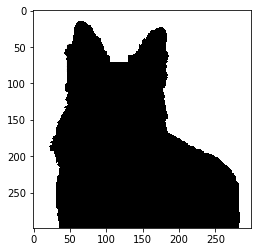

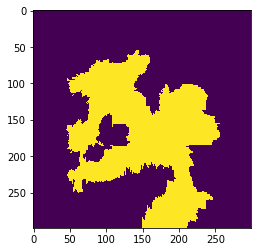

True Positive


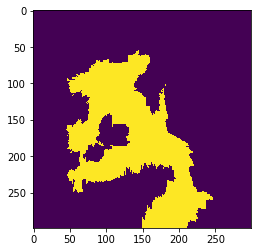

True Negative


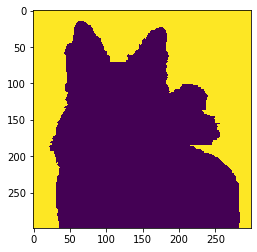

False Positive


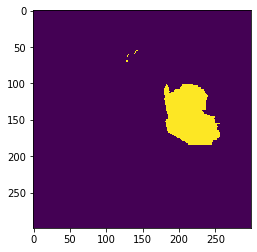

False Negative


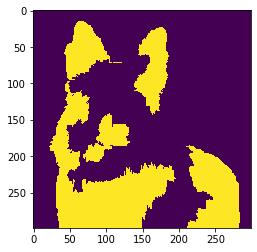

TP - FP: 23.70331428060089 5.196809879084126
FN - TN: 29.735685283162383 41.364190557152604
Acurracy: 65.06750483775349
Precision: 82.01803614970778
Recall: 44.355834641548924
Specificity: 88.83870657761975
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png'

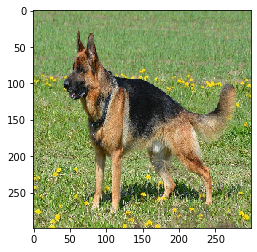

(1, 299, 299, 3)
Classpriori german_shepherd
german_shepherd, 100.00%
doberman, 0.00%
BACKGROUND_Google, 0.00%
dalmatian, 0.00%
airplanes, 0.00%


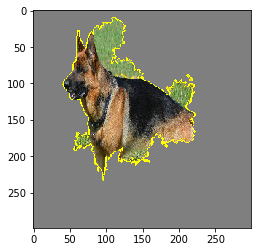

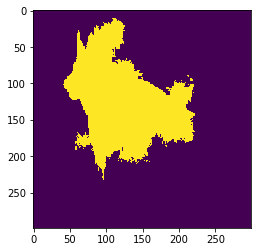

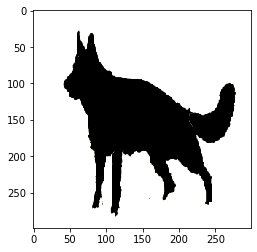

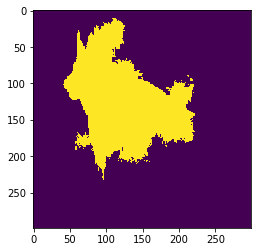

True Positive


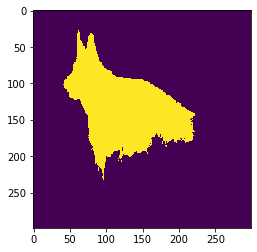

True Negative


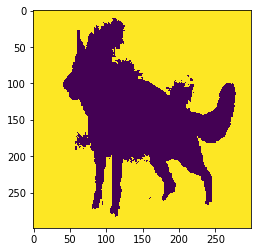

False Positive


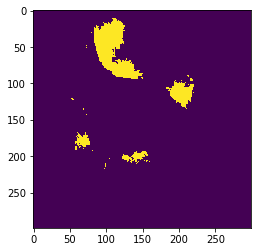

False Negative


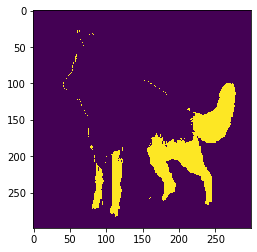

TP - FP: 17.169830315097144 4.5133723336428
FN - TN: 9.396986610888021 68.91981074037203
Acurracy: 86.08964105546917
Precision: 79.18493680680939
Recall: 64.62885773230602
Specificity: 93.85376999238385
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 0,

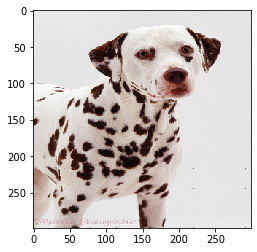

(1, 299, 299, 3)
Classpriori dalmatian
dalmatian, 100.00%
BACKGROUND_Google, 0.00%
german_shepherd, 0.00%
doberman, 0.00%
airplanes, 0.00%


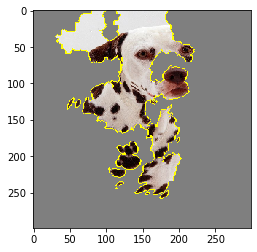

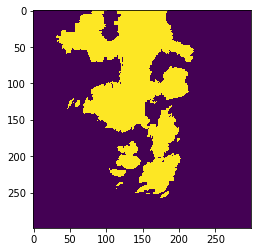

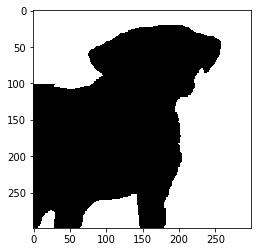

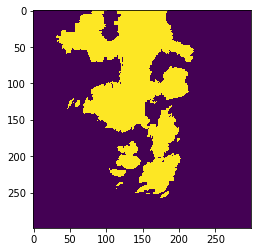

True Positive


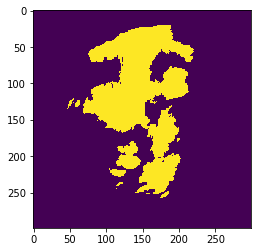

True Negative


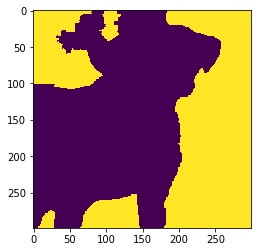

False Positive


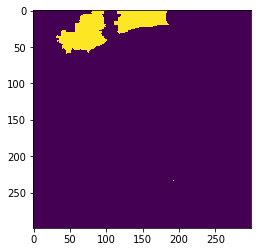

False Negative


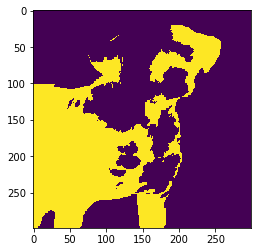

TP - FP: 19.0031431415756 4.590552678381673
FN - TN: 33.39448104607331 43.011823133969415
Acurracy: 62.014966275545014
Precision: 80.54330820651401
Recall: 36.26718469814704
Specificity: 90.35646309655286
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 

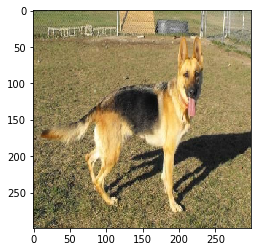

(1, 299, 299, 3)
Classpriori german_shepherd
german_shepherd, 98.95%
doberman, 0.61%
dalmatian, 0.19%
BACKGROUND_Google, 0.19%
airplanes, 0.06%


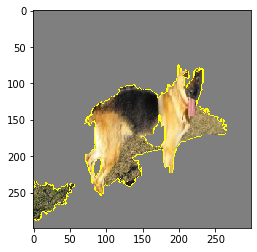

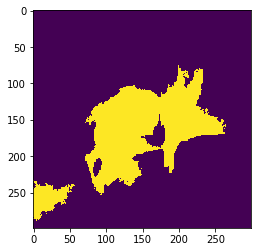

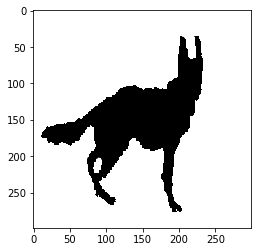

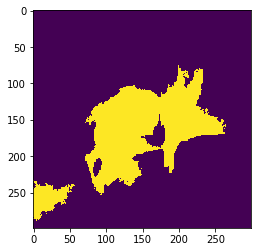

True Positive


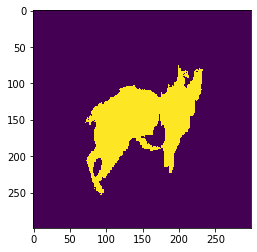

True Negative


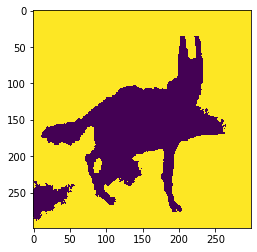

False Positive


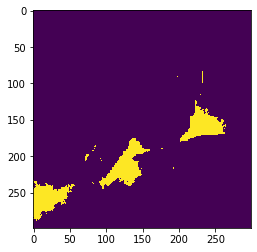

False Negative


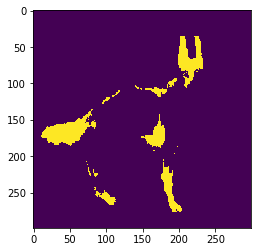

TP - FP: 13.495374772094271 5.640876500262861
FN - TN: 5.620742497287503 75.24300623035536
Acurracy: 88.73838100244963
Precision: 70.52256254383914
Recall: 70.5968402574605
Specificity: 93.02595732322882
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 0

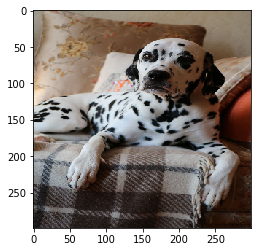

(1, 299, 299, 3)
Classpriori dalmatian
dalmatian, 100.00%
BACKGROUND_Google, 0.00%
german_shepherd, 0.00%
doberman, 0.00%
airplanes, 0.00%


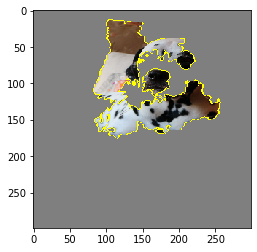

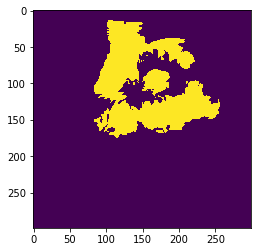

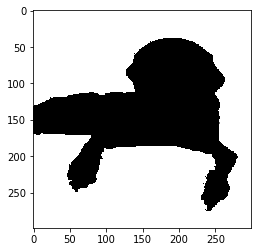

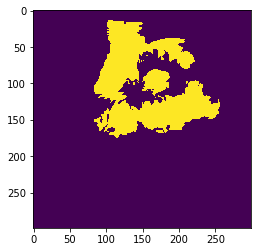

True Positive


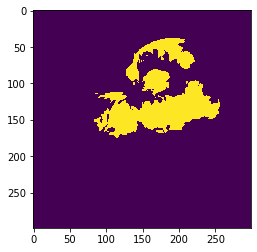

True Negative


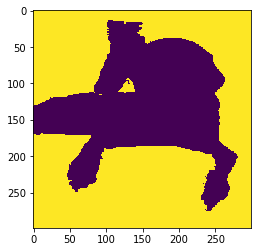

False Positive


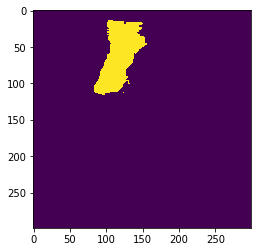

False Negative


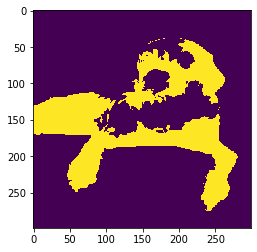

TP - FP: 10.584892786434157 4.48205277345891
FN - TN: 22.79840270243062 62.134651737676315
Acurracy: 72.71954452411047
Precision: 70.25241276911656
Recall: 31.707153627073215
Specificity: 93.27187856807039
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png',

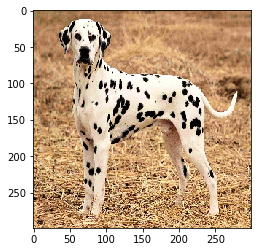

(1, 299, 299, 3)
Classpriori dalmatian
dalmatian, 100.00%
BACKGROUND_Google, 0.00%
german_shepherd, 0.00%
doberman, 0.00%
airplanes, 0.00%


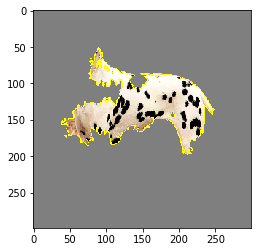

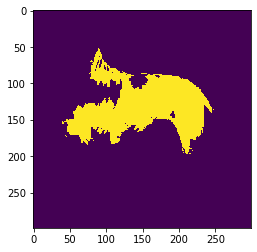

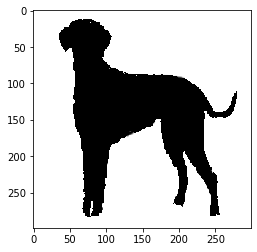

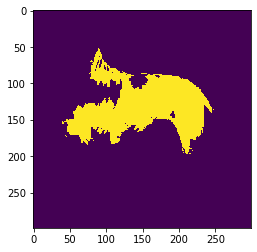

True Positive


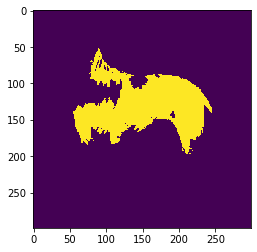

True Negative


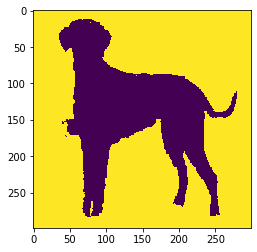

False Positive


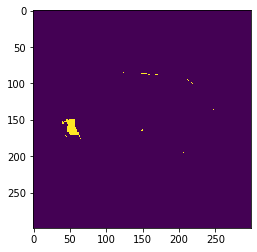

False Negative


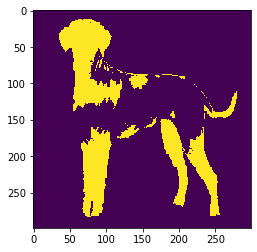

TP - FP: 13.250411069227413 0.3668862764398608
FN - TN: 16.16760438921265 70.21509826512008
Acurracy: 83.46550933434749
Precision: 97.30573353047478
Recall: 45.041825095057035
Specificity: 99.48019841206954
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png'

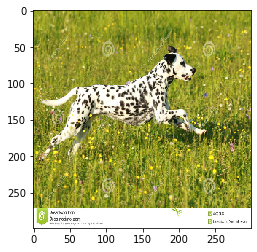

(1, 299, 299, 3)
Classpriori dalmatian
dalmatian, 97.51%
BACKGROUND_Google, 1.72%
doberman, 0.36%
german_shepherd, 0.30%
airplanes, 0.11%


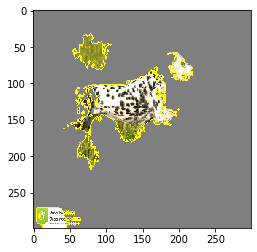

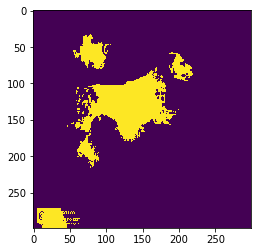

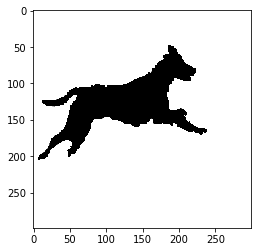

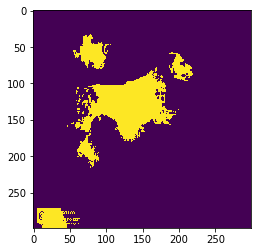

True Positive


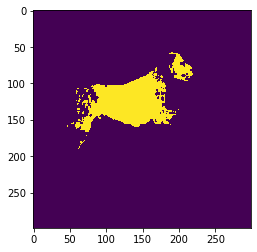

True Negative


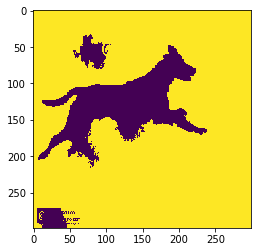

False Positive


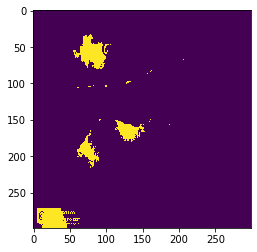

False Negative


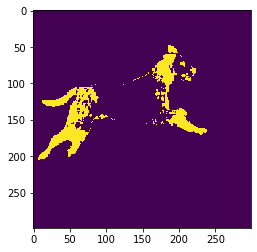

TP - FP: 7.449581100882541 3.866847126989631
FN - TN: 5.748257849464771 82.93531392266306
Acurracy: 90.3848950235456
Precision: 65.82979144015023
Recall: 56.44546147978643
Specificity: 95.54521790675498
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 0,

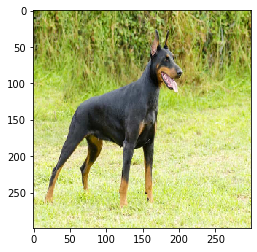

(1, 299, 299, 3)
Classpriori doberman
doberman, 100.00%
german_shepherd, 0.00%
BACKGROUND_Google, 0.00%
dalmatian, 0.00%
airplanes, 0.00%


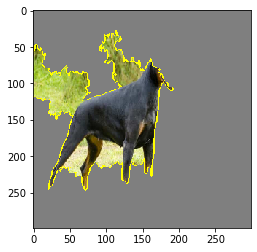

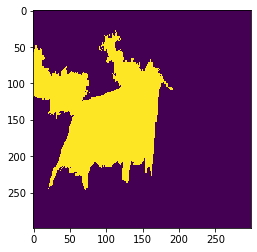

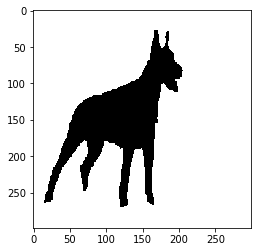

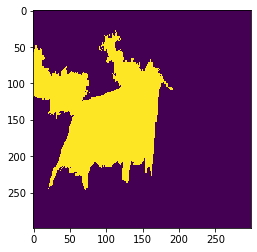

True Positive


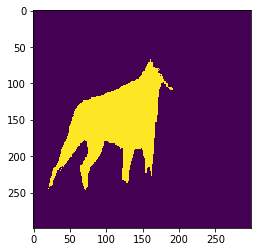

True Negative


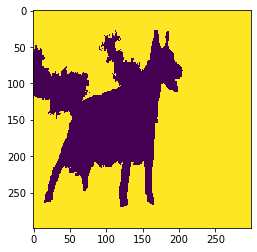

False Positive


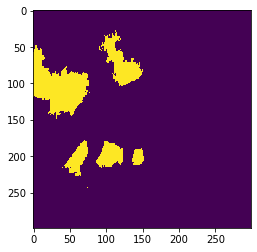

False Negative


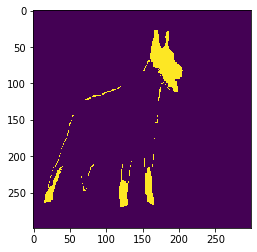

TP - FP: 13.386874867171509 8.579322378944306
FN - TN: 3.808682229505263 74.22512052437892
Acurracy: 87.61199539155044
Precision: 60.943069559018234
Recall: 77.85077733688934
Specificity: 89.63905549251633
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png',

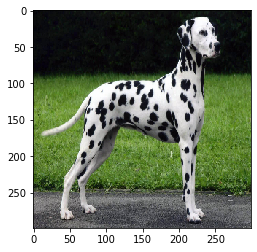

(1, 299, 299, 3)
Classpriori dalmatian
dalmatian, 100.00%
BACKGROUND_Google, 0.00%
german_shepherd, 0.00%
doberman, 0.00%
airplanes, 0.00%


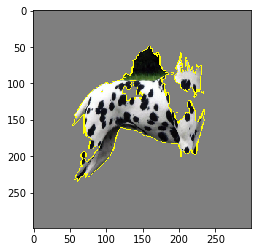

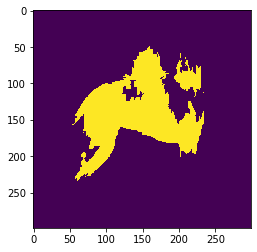

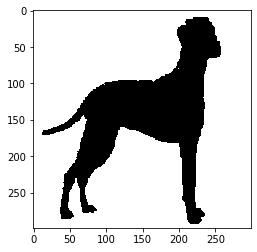

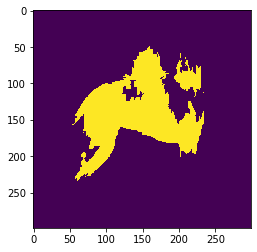

True Positive


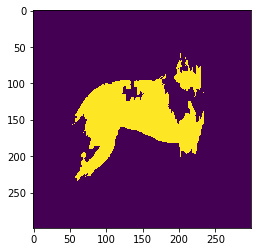

True Negative


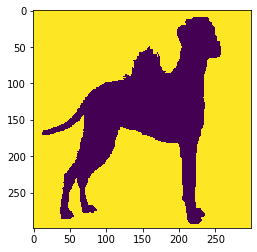

False Positive


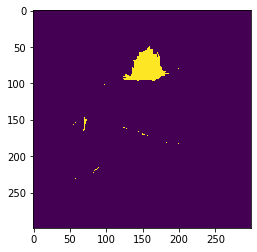

False Negative


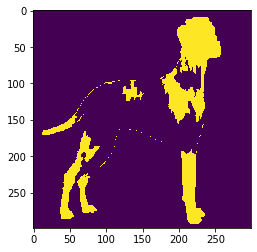

TP - FP: 14.021095960895291 1.8243643807116252
FN - TN: 11.737005178912987 72.4175344794801
Acurracy: 86.43863044037539
Precision: 88.4865170125653
Recall: 54.43373284696891
Specificity: 97.54267548551368
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 

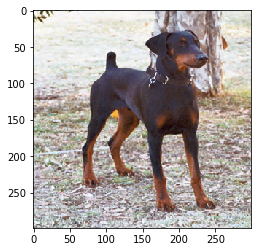

(1, 299, 299, 3)
Classpriori doberman
doberman, 100.00%
german_shepherd, 0.00%
BACKGROUND_Google, 0.00%
dalmatian, 0.00%
airplanes, 0.00%


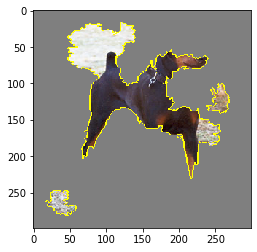

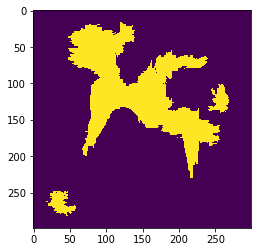

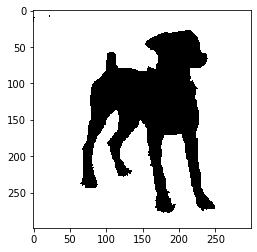

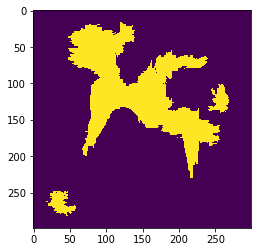

True Positive


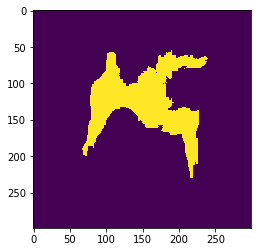

True Negative


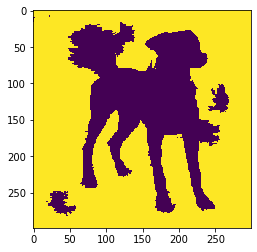

False Positive


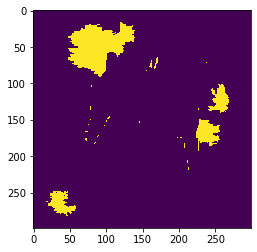

False Negative


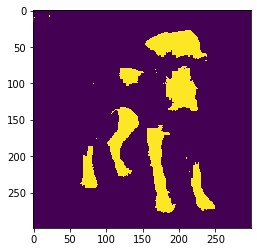

TP - FP: 12.243710920459502 6.864576458876299
FN - TN: 11.514412590463193 69.377300030201
Acurracy: 81.6210109506605
Precision: 64.07539659310424
Recall: 51.534839924670436
Specificity: 90.99631754228957
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 0

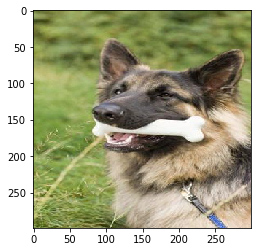

(1, 299, 299, 3)
Classpriori german_shepherd
german_shepherd, 99.98%
doberman, 0.01%
airplanes, 0.00%
BACKGROUND_Google, 0.00%
dalmatian, 0.00%


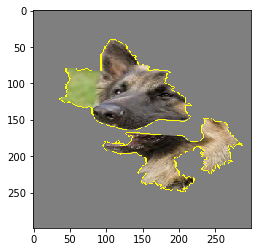

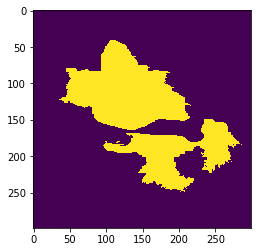

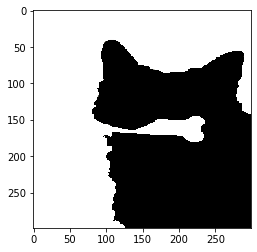

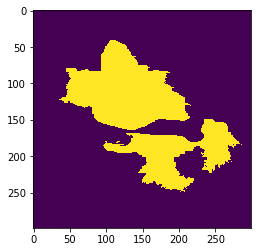

True Positive


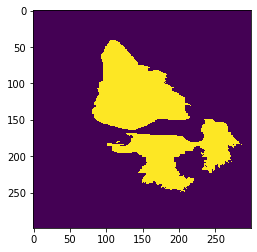

True Negative


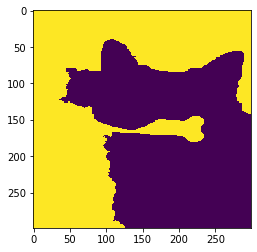

False Positive


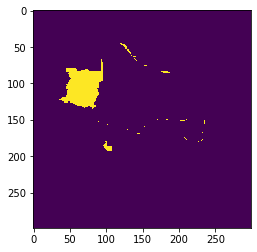

False Negative


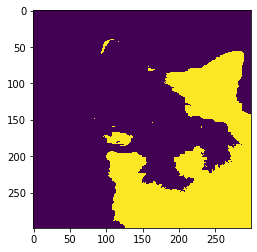

TP - FP: 19.023277144550956 2.7192089573942124
FN - TN: 28.322949407724746 49.93456449033008
Acurracy: 68.95784163488104
Precision: 87.4935692972528
Recall: 40.17907767907768
Specificity: 94.8356807511737
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 

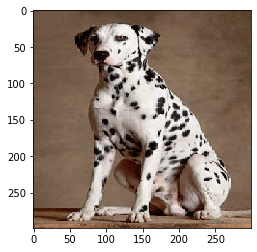

(1, 299, 299, 3)
Classpriori dalmatian
dalmatian, 100.00%
BACKGROUND_Google, 0.00%
german_shepherd, 0.00%
doberman, 0.00%
airplanes, 0.00%


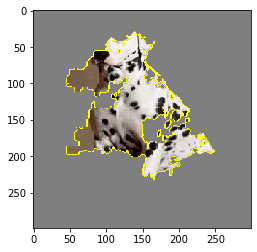

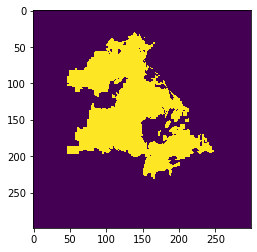

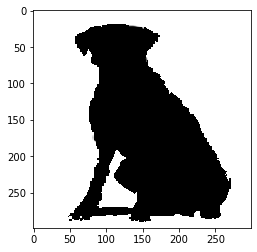

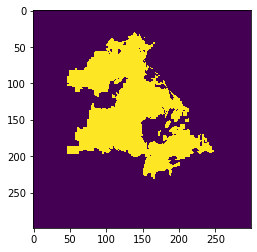

True Positive


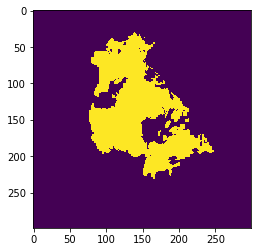

True Negative


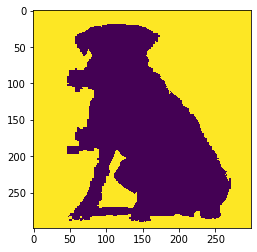

False Positive


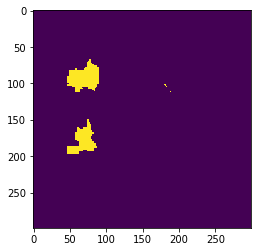

False Negative


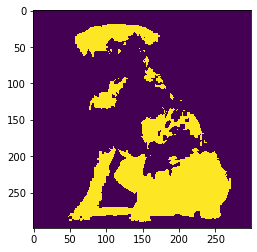

TP - FP: 16.999809845527455 2.473126698806501
FN - TN: 21.808480889475508 58.718582566190534
Acurracy: 75.71839241171799
Precision: 87.29967258314666
Recall: 43.80458279290964
Specificity: 95.95839578839616
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png'

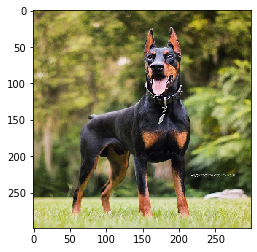

(1, 299, 299, 3)
Classpriori doberman
doberman, 99.98%
german_shepherd, 0.02%
BACKGROUND_Google, 0.00%
dalmatian, 0.00%
airplanes, 0.00%


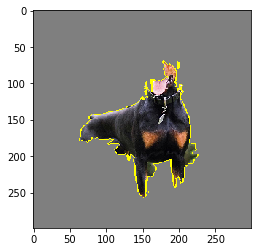

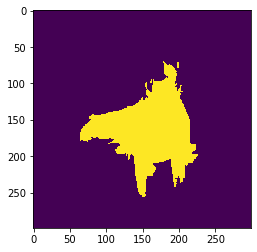

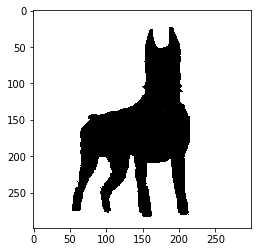

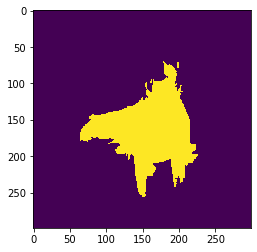

True Positive


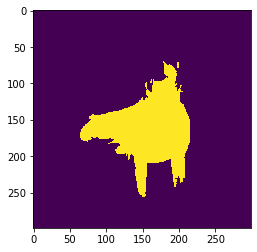

True Negative


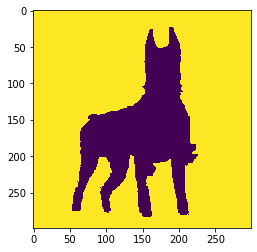

False Positive


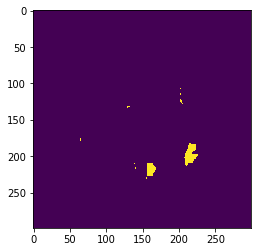

False Negative


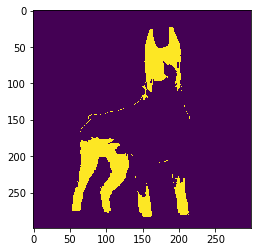

TP - FP: 13.247055402064852 0.6331025380029306
FN - TN: 8.787373743023007 77.33246831690921
Acurracy: 90.57952371897406
Precision: 95.43879442340237
Recall: 60.11980303568709
Specificity: 99.18797165074173
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png',

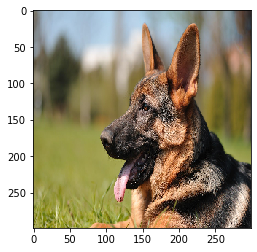

(1, 299, 299, 3)
Classpriori german_shepherd
german_shepherd, 100.00%
doberman, 0.00%
dalmatian, 0.00%
BACKGROUND_Google, 0.00%
airplanes, 0.00%


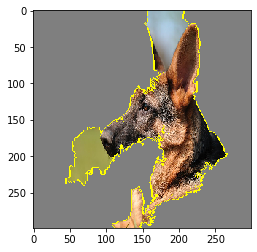

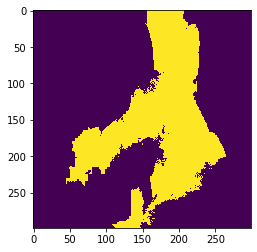

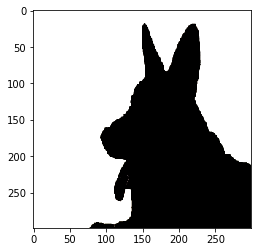

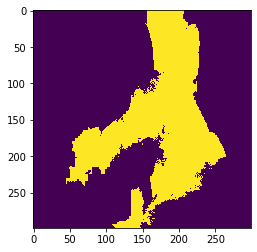

True Positive


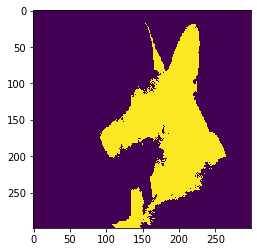

True Negative


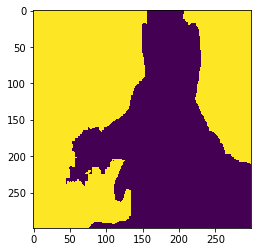

False Positive


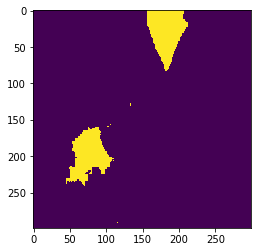

False Negative


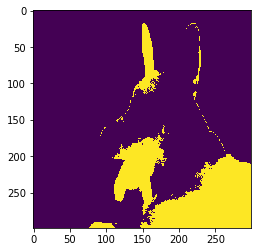

TP - FP: 21.515419290611963 6.259437813894698
FN - TN: 16.965134618181004 55.26000827731233
Acurracy: 76.7754275679243
Precision: 77.46365430308887
Recall: 55.91244695075868
Specificity: 89.82526955035546
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 

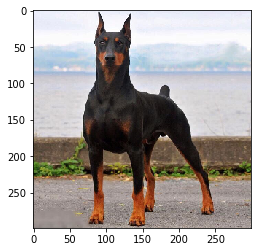

(1, 299, 299, 3)
Classpriori doberman
doberman, 100.00%
german_shepherd, 0.00%
BACKGROUND_Google, 0.00%
dalmatian, 0.00%
airplanes, 0.00%


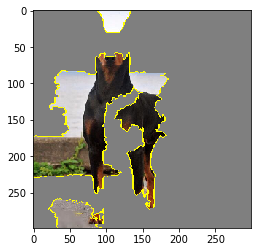

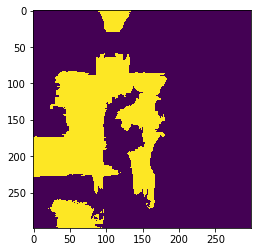

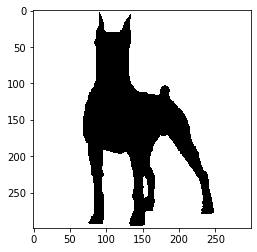

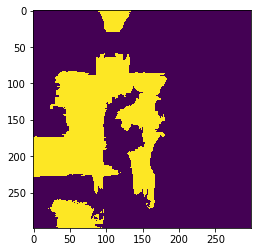

True Positive


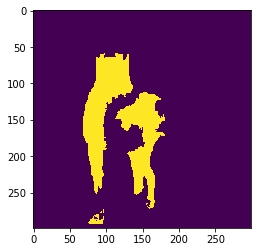

True Negative


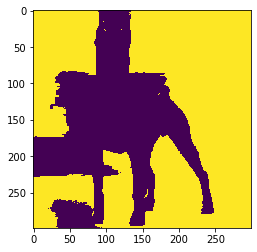

False Positive


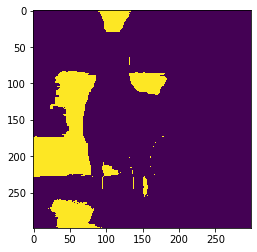

False Negative


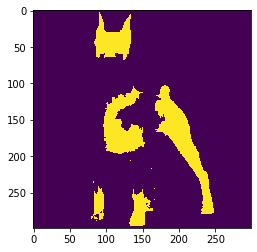

TP - FP: 11.53007237055514 13.181060614534513
FN - TN: 11.379067348239953 63.909799666670395
Acurracy: 75.43987203722554
Precision: 46.65942422596415
Recall: 50.32957375128168
Specificity: 82.90191526407429
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png'

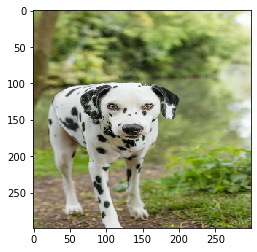

(1, 299, 299, 3)
Classpriori dalmatian
dalmatian, 100.00%
BACKGROUND_Google, 0.00%
german_shepherd, 0.00%
doberman, 0.00%
airplanes, 0.00%


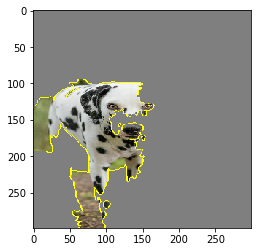

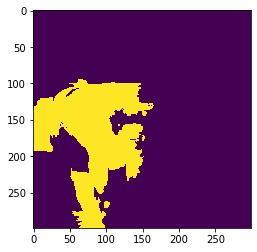

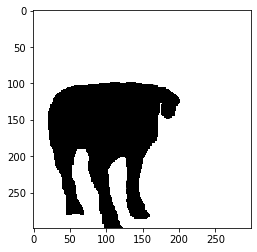

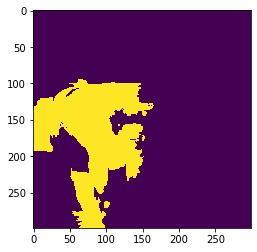

True Positive


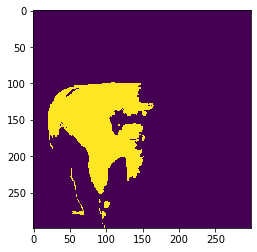

True Negative


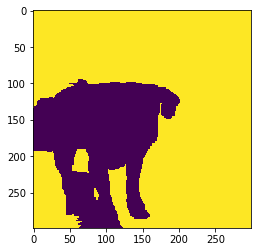

False Positive


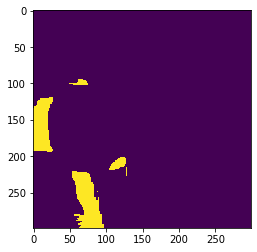

False Negative


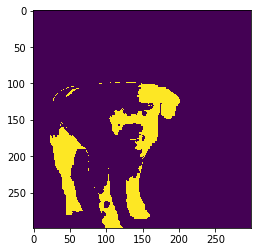

TP - FP: 13.507678885023658 4.497712553550856
FN - TN: 9.77393988881556 72.22066867260992
Acurracy: 85.72834755763358
Precision: 75.0201900975337
Recall: 58.01864129912558
Specificity: 94.13737297155438
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 0,

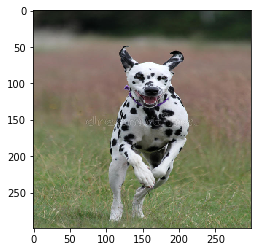

(1, 299, 299, 3)
Classpriori dalmatian
dalmatian, 100.00%
BACKGROUND_Google, 0.00%
german_shepherd, 0.00%
doberman, 0.00%
airplanes, 0.00%


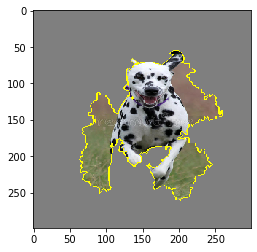

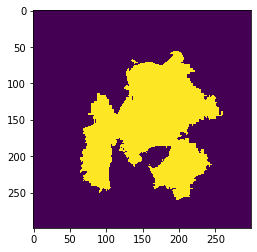

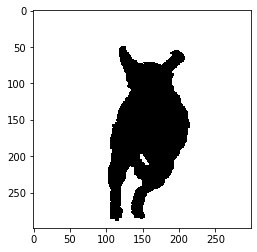

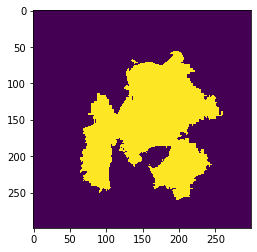

True Positive


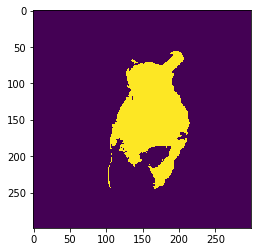

True Negative


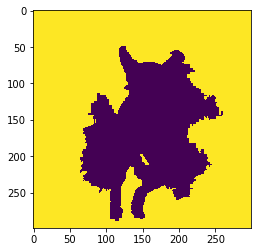

False Positive


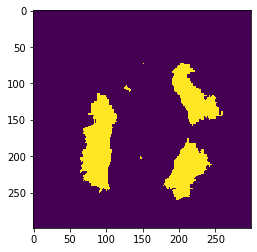

False Negative


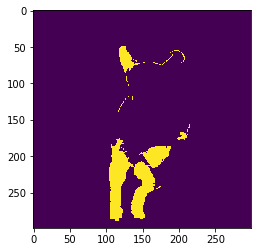

TP - FP: 12.589344638203151 10.584892786434157
FN - TN: 5.445129249113545 71.38063332624914
Acurracy: 83.96997796445228
Precision: 54.32474177044115
Recall: 69.80710785833901
Specificity: 87.08616501542072
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png',

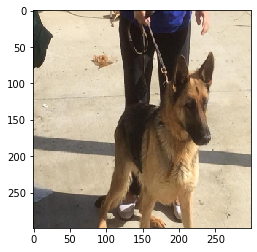

(1, 299, 299, 3)
Classpriori german_shepherd
german_shepherd, 100.00%
doberman, 0.00%
dalmatian, 0.00%
BACKGROUND_Google, 0.00%
airplanes, 0.00%


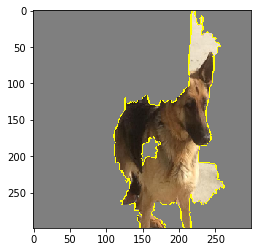

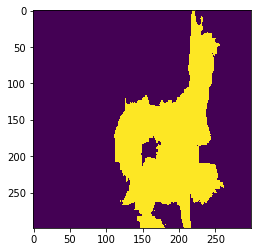

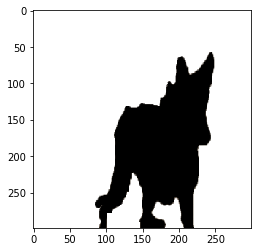

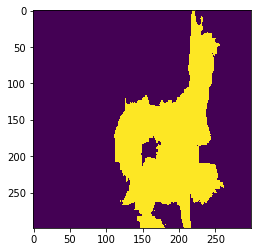

True Positive


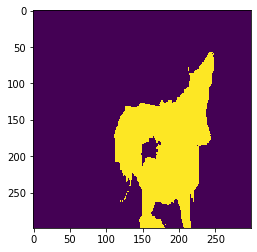

True Negative


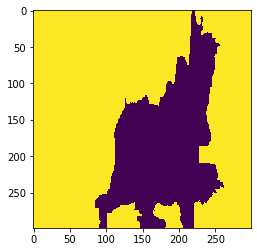

False Positive


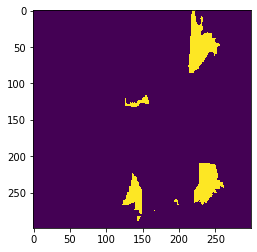

False Negative


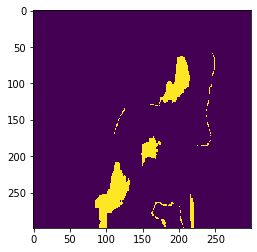

TP - FP: 19.08815337636044 4.71023814051297
FN - TN: 4.766165926555631 71.43544255657096
Acurracy: 90.5235959329314
Precision: 80.20774581688286
Recall: 80.01969426990527
Specificity: 93.81417554168196
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 0, 

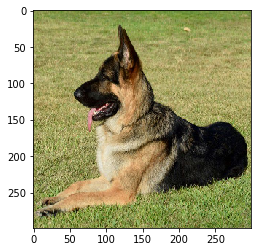

(1, 299, 299, 3)
Classpriori german_shepherd
german_shepherd, 100.00%
doberman, 0.00%
dalmatian, 0.00%
BACKGROUND_Google, 0.00%
airplanes, 0.00%


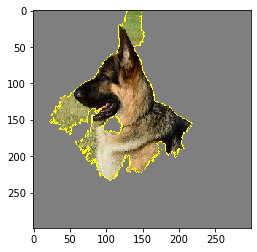

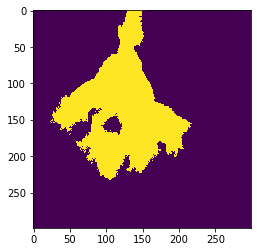

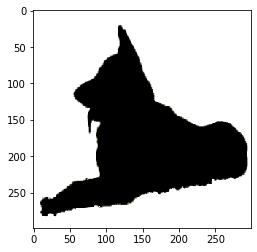

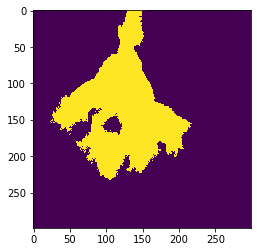

True Positive


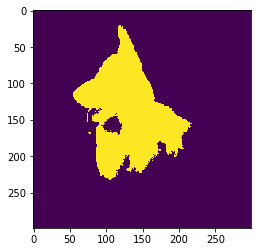

True Negative


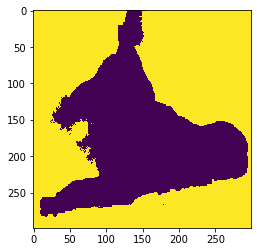

False Positive


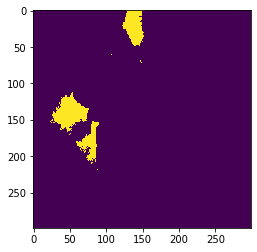

False Negative


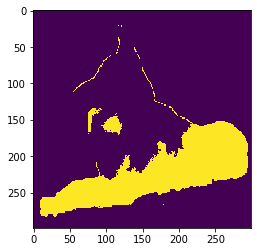

TP - FP: 16.955067616693327 3.6174092012393597
FN - TN: 18.14632945940202 61.28119372266529
Acurracy: 78.23626133935862
Precision: 82.41626794258373
Recall: 48.303113348841656
Specificity: 94.42605997931749
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png'

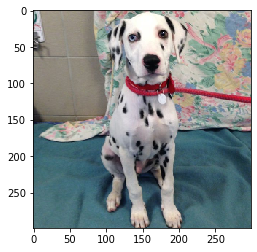

(1, 299, 299, 3)
Classpriori dalmatian
dalmatian, 100.00%
BACKGROUND_Google, 0.00%
german_shepherd, 0.00%
doberman, 0.00%
airplanes, 0.00%


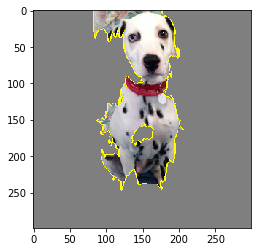

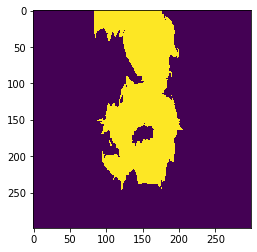

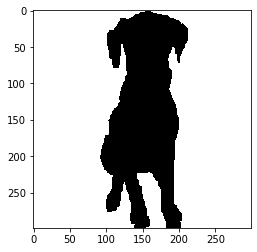

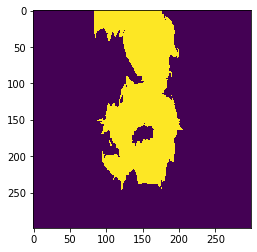

True Positive


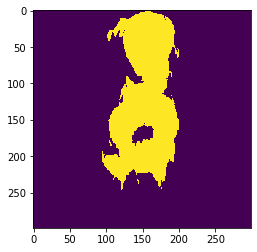

True Negative


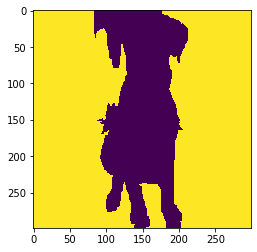

False Positive


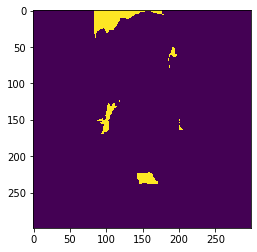

False Negative


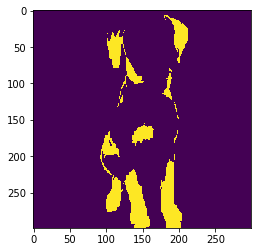

TP - FP: 17.83425241328397 2.385879352579949
FN - TN: 8.135255757765574 71.64461247637051
Acurracy: 89.47886488965449
Precision: 88.20047574265641
Recall: 68.67381659990525
Specificity: 96.77716668681252
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 0

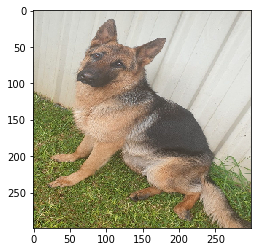

(1, 299, 299, 3)
Classpriori german_shepherd
german_shepherd, 100.00%
doberman, 0.00%
dalmatian, 0.00%
BACKGROUND_Google, 0.00%
airplanes, 0.00%


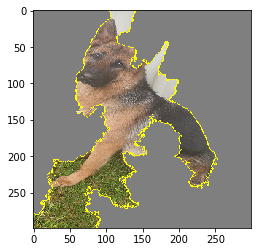

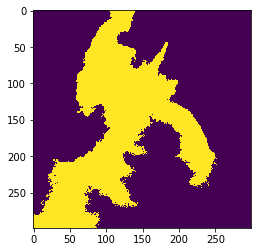

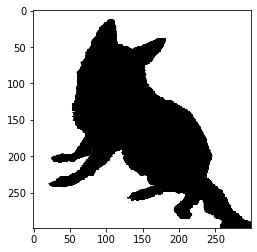

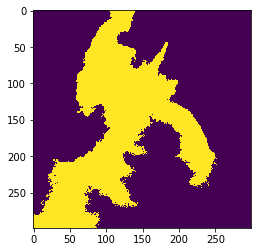

True Positive


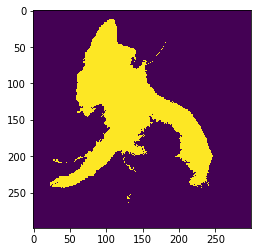

True Negative


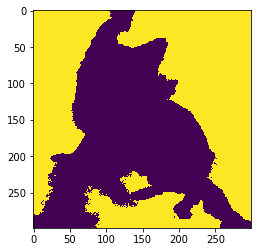

False Positive


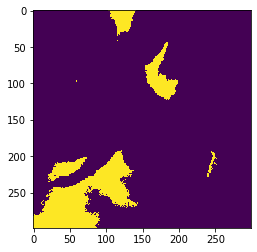

False Negative


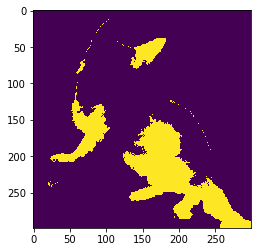

TP - FP: 20.481873804543575 10.828737933580161
FN - TN: 14.946141542040916 53.74324671983535
Acurracy: 74.22512052437892
Precision: 65.4151186053158
Recall: 57.81264799671646
Specificity: 83.22997505543238
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png',

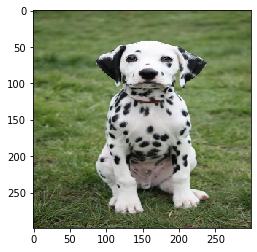

(1, 299, 299, 3)
Classpriori dalmatian
dalmatian, 100.00%
BACKGROUND_Google, 0.00%
german_shepherd, 0.00%
doberman, 0.00%
airplanes, 0.00%


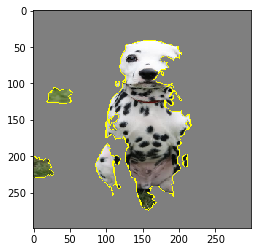

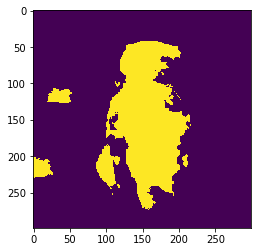

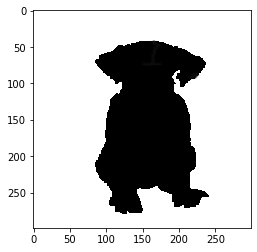

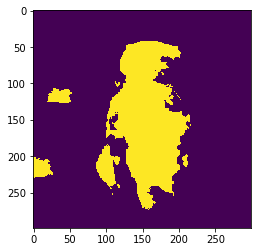

True Positive


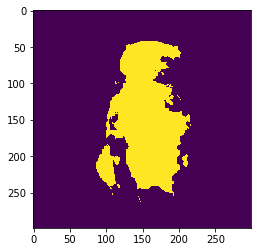

True Negative


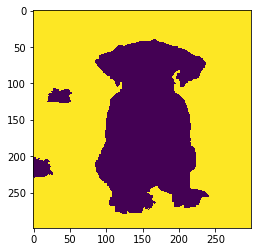

False Positive


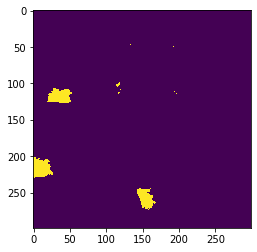

False Negative


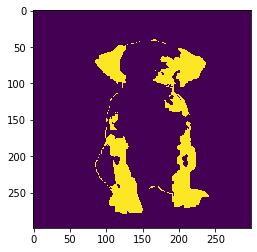

TP - FP: 17.61837115915929 1.756132481739578
FN - TN: 10.997639847429 69.62785651167212
Acurracy: 87.24622767083143
Precision: 90.93585820680099
Recall: 61.56822890200524
Specificity: 97.53987903099438
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 0, 

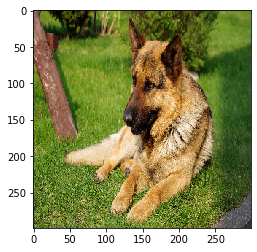

(1, 299, 299, 3)
Classpriori german_shepherd
german_shepherd, 100.00%
doberman, 0.00%
BACKGROUND_Google, 0.00%
airplanes, 0.00%
dalmatian, 0.00%


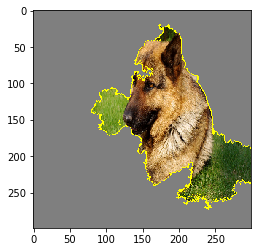

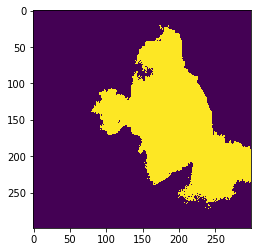

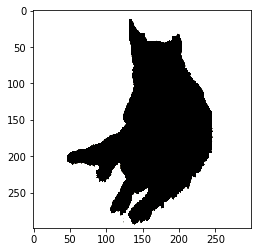

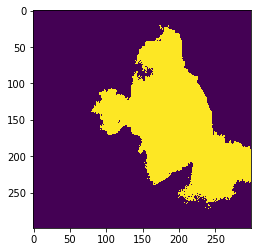

True Positive


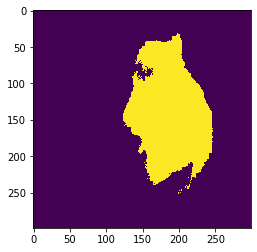

True Negative


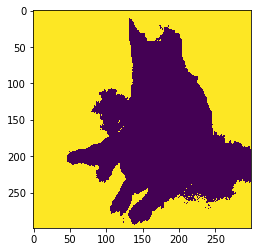

False Positive


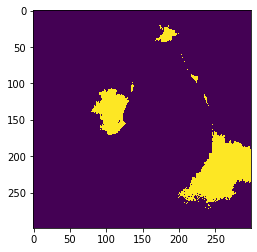

False Negative


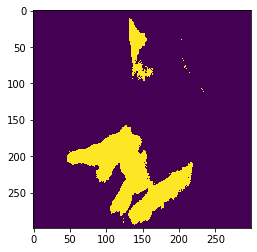

TP - FP: 18.175411908144206 8.51444614713482
FN - TN: 11.167660316998692 62.14248162772229
Acurracy: 80.31789353586649
Precision: 68.0985708897364
Recall: 61.941066595509476
Specificity: 87.94959473150963
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 

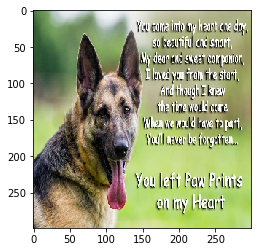

(1, 299, 299, 3)
Classpriori german_shepherd
german_shepherd, 100.00%
airplanes, 0.00%
doberman, 0.00%
BACKGROUND_Google, 0.00%
dalmatian, 0.00%


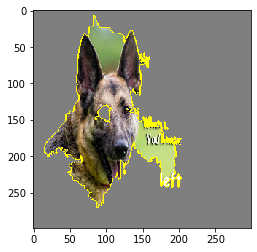

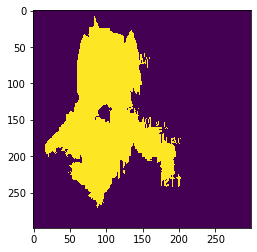

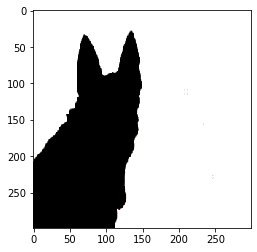

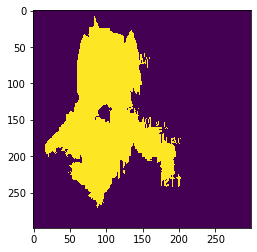

True Positive


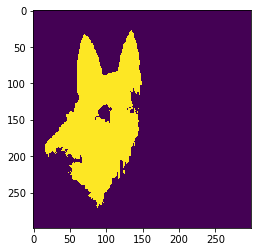

True Negative


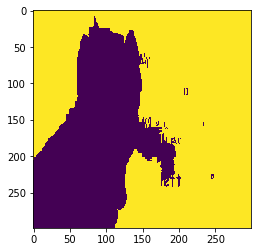

False Positive


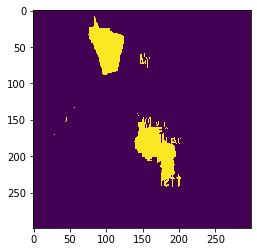

False Negative


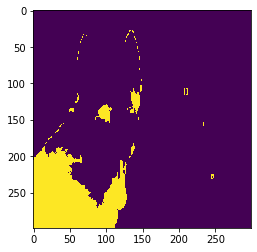

TP - FP: 17.88794308788492 5.636402277379448
FN - TN: 11.674366058545207 64.80128857619042
Acurracy: 82.68923166407535
Precision: 76.0401312348438
Recall: 60.509289038556126
Specificity: 91.99803087086325
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 

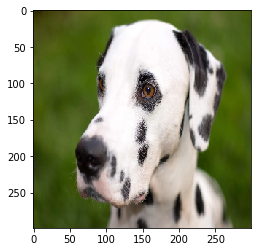

(1, 299, 299, 3)
Classpriori dalmatian
dalmatian, 100.00%
BACKGROUND_Google, 0.00%
doberman, 0.00%
german_shepherd, 0.00%
airplanes, 0.00%


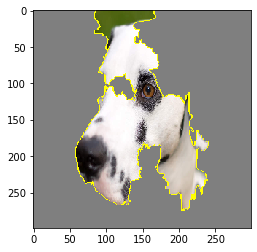

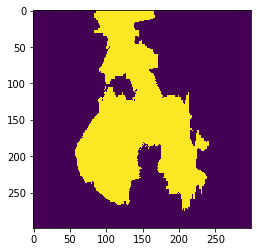

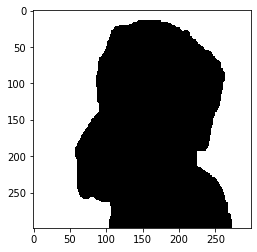

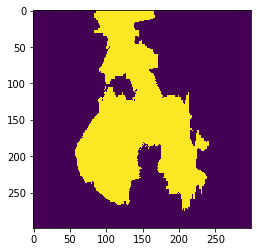

True Positive


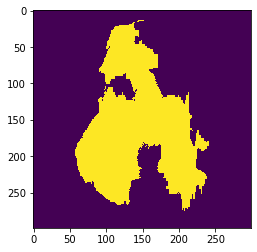

True Negative


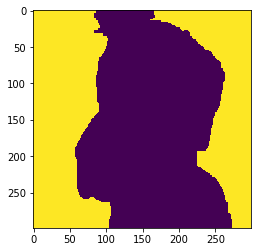

False Positive


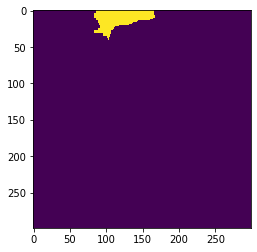

False Negative


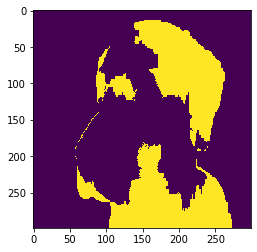

TP - FP: 26.32856455744343 1.9585910672140132
FN - TN: 25.472869430990702 46.23997494435185
Acurracy: 72.56853950179527
Precision: 93.0760409664281
Recall: 50.82593768219215
Specificity: 95.9364121605941
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 0

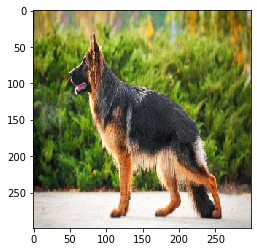

(1, 299, 299, 3)
Classpriori german_shepherd
german_shepherd, 100.00%
doberman, 0.00%
dalmatian, 0.00%
BACKGROUND_Google, 0.00%
airplanes, 0.00%


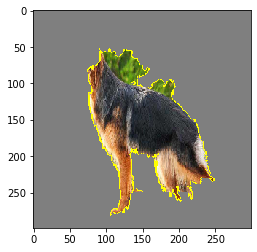

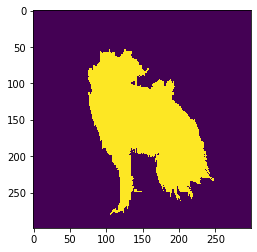

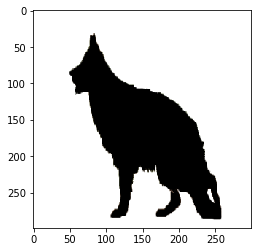

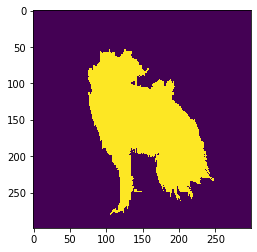

True Positive


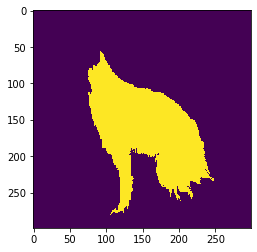

True Negative


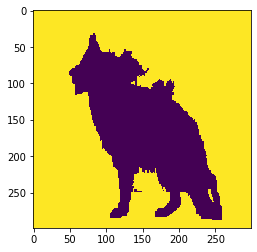

False Positive


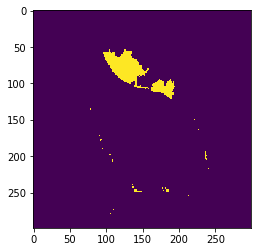

False Negative


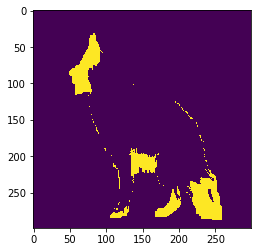

TP - FP: 19.553472556235388 2.492142146061006
FN - TN: 6.221406919385689 71.73297837831791
Acurracy: 91.2864509345533
Precision: 88.69551981328327
Recall: 75.86251790131493
Specificity: 96.64245456463426
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 0

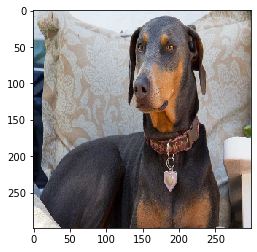

(1, 299, 299, 3)
Classpriori doberman
doberman, 100.00%
german_shepherd, 0.00%
BACKGROUND_Google, 0.00%
dalmatian, 0.00%
airplanes, 0.00%


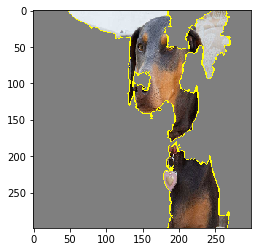

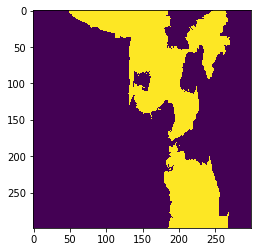

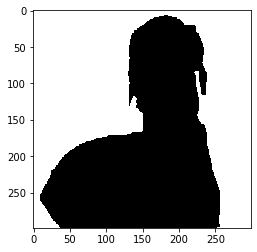

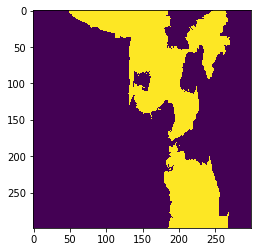

True Positive


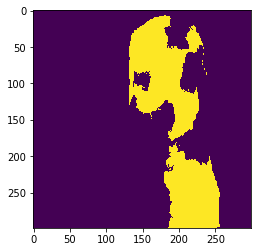

True Negative


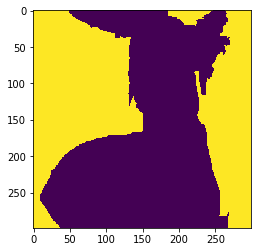

False Positive


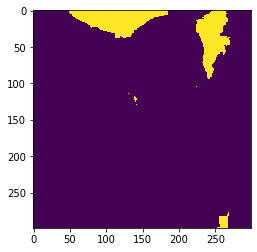

False Negative


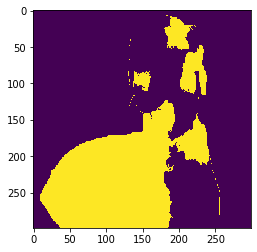

TP - FP: 17.88794308788492 6.352277938725518
FN - TN: 29.410185568394088 46.349593404995474
Acurracy: 64.2375364928804
Precision: 73.79447187485579
Recall: 37.81955776280005
Specificity: 87.94676967484506
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 

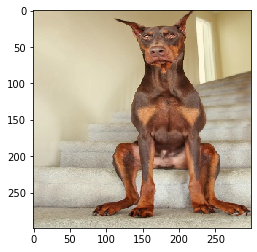

(1, 299, 299, 3)
Classpriori doberman
doberman, 98.36%
german_shepherd, 1.64%
BACKGROUND_Google, 0.00%
dalmatian, 0.00%
airplanes, 0.00%


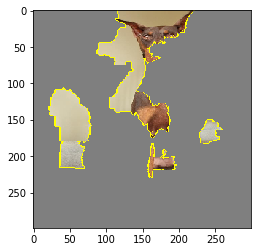

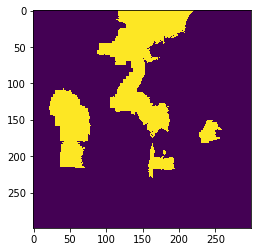

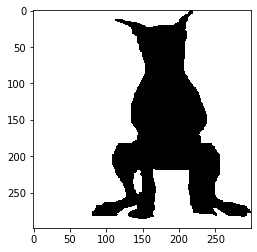

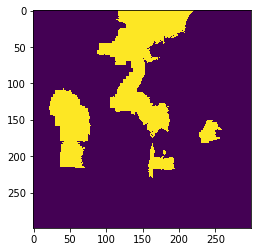

True Positive


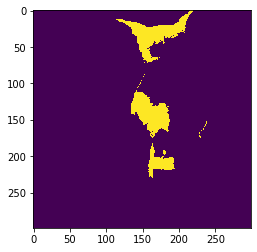

True Negative


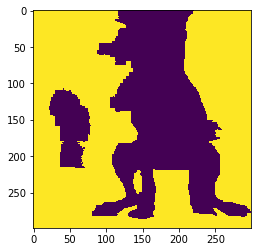

False Positive


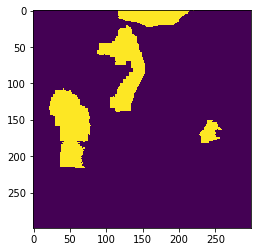

False Negative


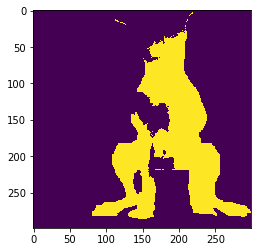

TP - FP: 5.287412892473239 10.99428418026644
FN - TN: 21.908032348631448 61.81027057862888
Acurracy: 67.09768347110212
Precision: 32.474580928826605
Recall: 19.442273680746926
Specificity: 84.89890609636184
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png'

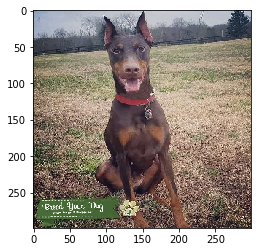

(1, 299, 299, 3)
Classpriori doberman
doberman, 100.00%
german_shepherd, 0.00%
BACKGROUND_Google, 0.00%
dalmatian, 0.00%
airplanes, 0.00%


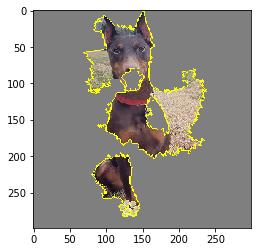

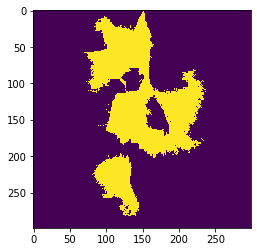

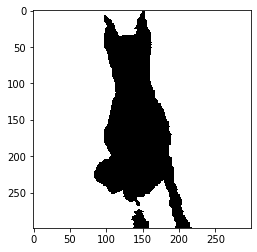

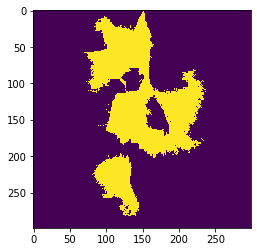

True Positive


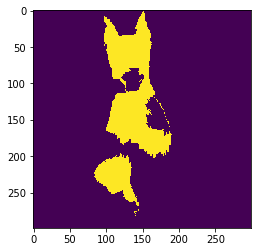

True Negative


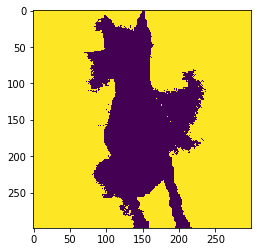

False Positive


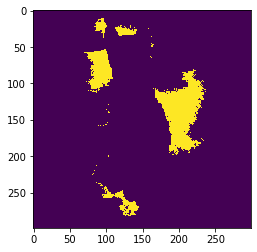

False Negative


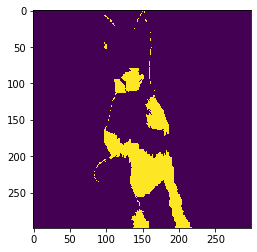

TP - FP: 12.39471594277469 7.223632845270187
FN - TN: 8.291853558685027 72.0897976532701
Acurracy: 84.48451359604479
Precision: 63.179200638576894
Recall: 59.916729750189255
Specificity: 90.89229554204803
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 

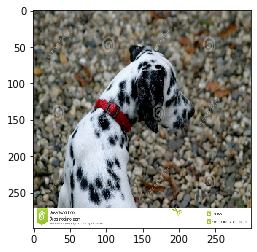

(1, 299, 299, 3)
Classpriori dalmatian
dalmatian, 100.00%
BACKGROUND_Google, 0.00%
german_shepherd, 0.00%
doberman, 0.00%
airplanes, 0.00%


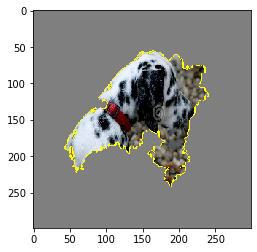

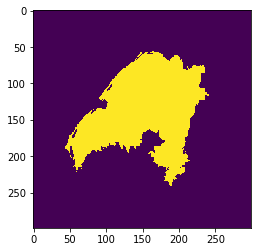

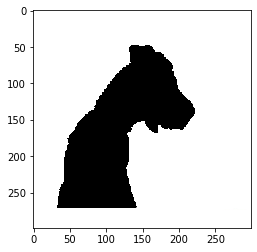

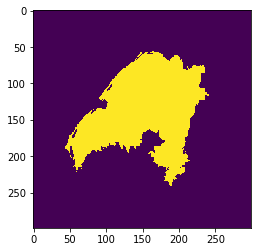

True Positive


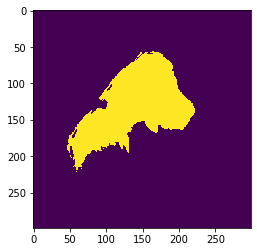

True Negative


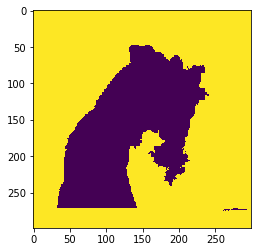

False Positive


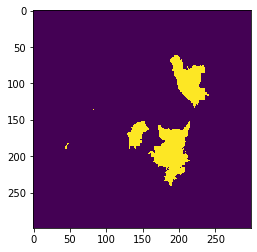

False Negative


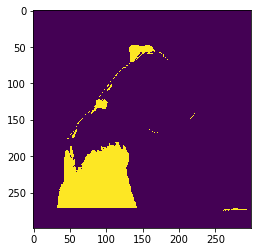

TP - FP: 14.449502801982081 5.65094350175054
FN - TN: 8.99878077426427 70.90077292200311
Acurracy: 85.35027572398519
Precision: 71.8864774624374
Recall: 61.62285932357009
Specificity: 92.61813612320641
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 0, 

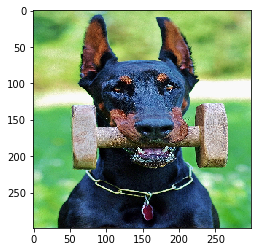

(1, 299, 299, 3)
Classpriori doberman
german_shepherd, 81.61%
doberman, 17.06%
airplanes, 0.78%
dalmatian, 0.32%
BACKGROUND_Google, 0.23%


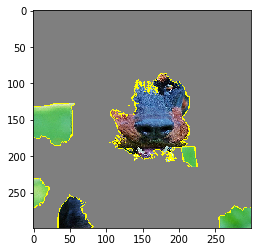

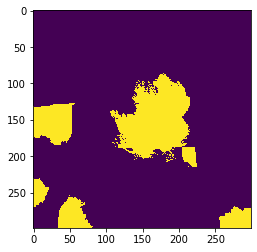

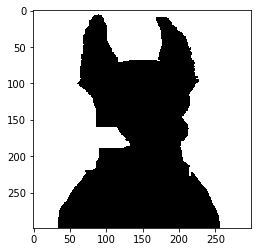

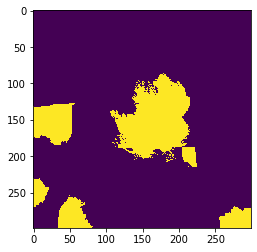

True Positive


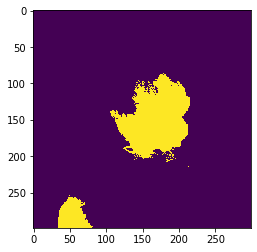

True Negative


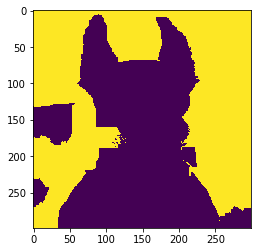

False Positive


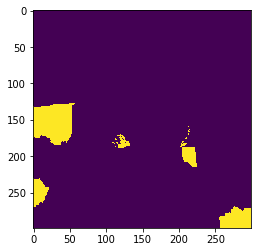

False Negative


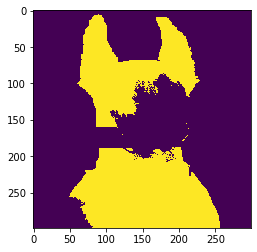

TP - FP: 10.17438283688102 5.459670473484636
FN - TN: 32.60478070715093 51.76116598248341
Acurracy: 61.93554881936443
Precision: 65.0783429920584
Recall: 23.783501111256374
Specificity: 90.45859723199625
clabel: 1
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 0

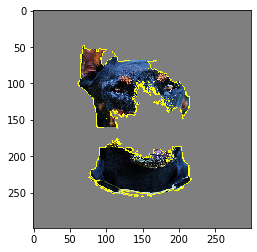

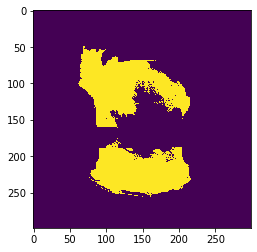

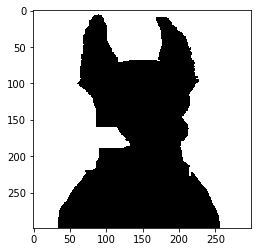

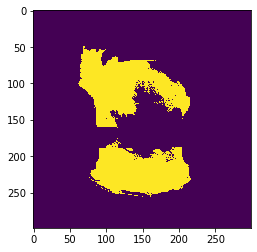

True Positive


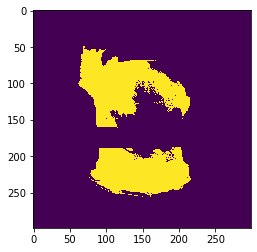

True Negative


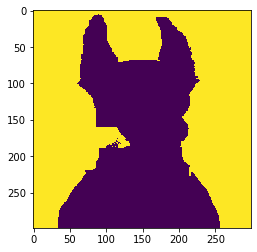

False Positive


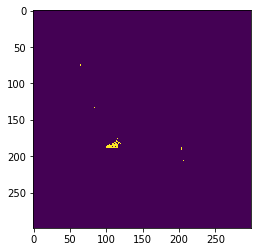

False Negative


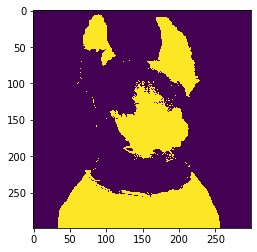

TP - FP: 16.85216049037483 0.11409268352702989
FN - TN: 25.927003053657117 57.10674377244103
Acurracy: 73.95890426281585
Precision: 99.32753164556962
Recall: 39.39338475617728
Specificity: 99.80060989913207
clabel: 1
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png'

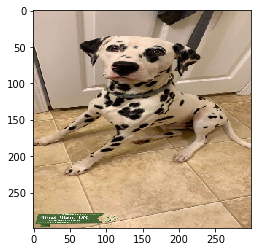

(1, 299, 299, 3)
Classpriori dalmatian
dalmatian, 100.00%
BACKGROUND_Google, 0.00%
german_shepherd, 0.00%
doberman, 0.00%
airplanes, 0.00%


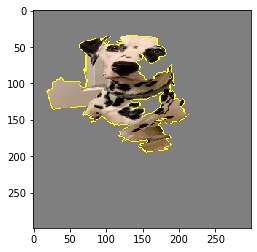

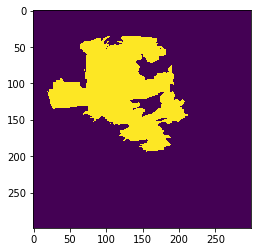

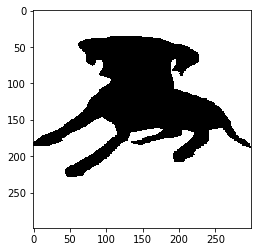

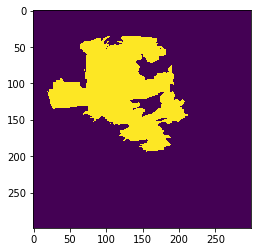

True Positive


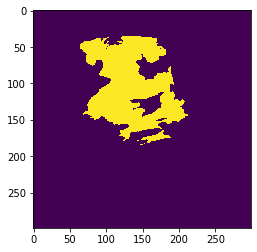

True Negative


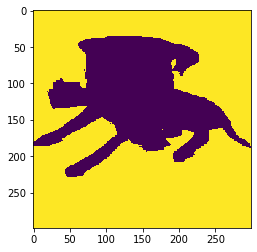

False Positive


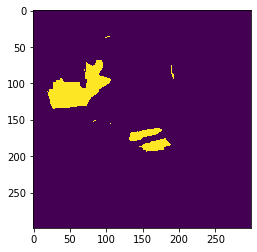

False Negative


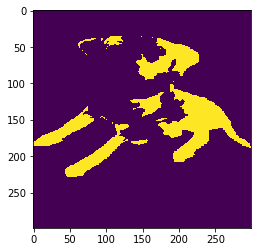

TP - FP: 12.978602029060077 4.18116128454939
FN - TN: 12.637442534199842 70.20279415219069
Acurracy: 83.18139618125076
Precision: 75.63392216935011
Recall: 50.665909785598885
Specificity: 94.37894736842105
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png',

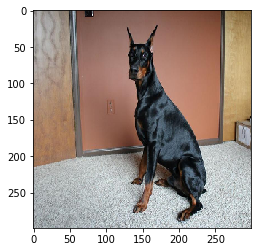

(1, 299, 299, 3)
Classpriori doberman
doberman, 94.46%
german_shepherd, 5.41%
BACKGROUND_Google, 0.06%
dalmatian, 0.06%
airplanes, 0.01%


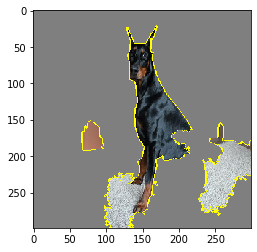

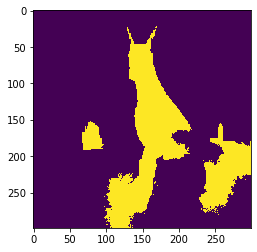

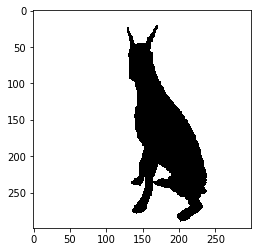

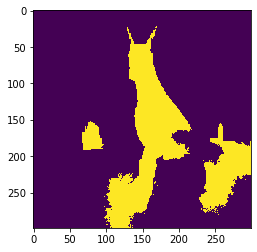

True Positive


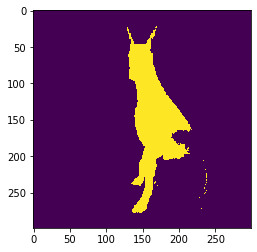

True Negative


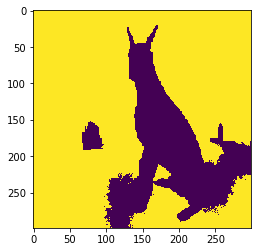

False Positive


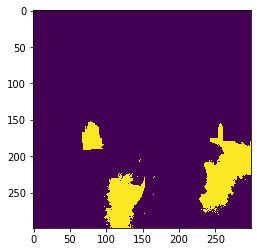

False Negative


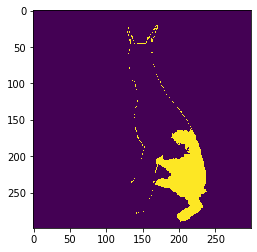

TP - FP: 10.135233386651157 8.707956286842428
FN - TN: 5.364593237212112 75.7922170892943
Acurracy: 85.92745047594545
Precision: 53.78724919862283
Recall: 65.38933391065888
Specificity: 89.69474743196018
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 0

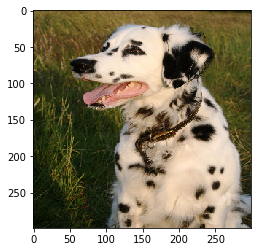

(1, 299, 299, 3)
Classpriori dalmatian
dalmatian, 100.00%
BACKGROUND_Google, 0.00%
german_shepherd, 0.00%
doberman, 0.00%
airplanes, 0.00%


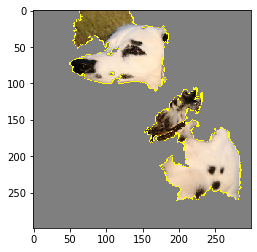

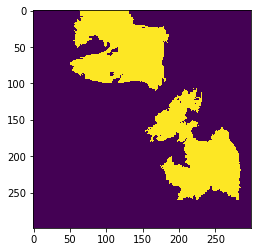

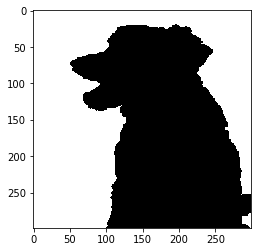

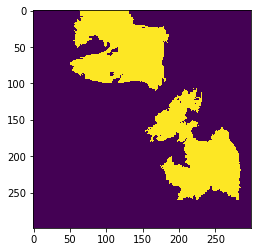

True Positive


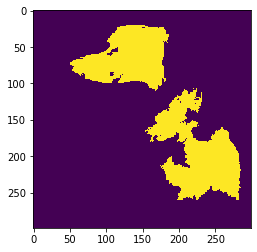

True Negative


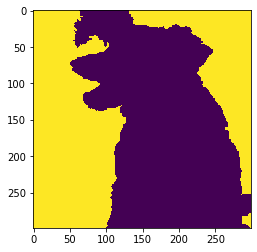

False Positive


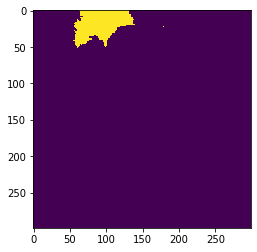

False Negative


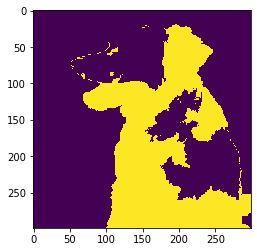

TP - FP: 18.970705025670853 2.9988478876075213
FN - TN: 31.549982662386327 46.4804644243353
Acurracy: 65.45116945000615
Precision: 86.3499821801334
Recall: 37.55036974715494
Specificity: 93.93918842545497
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 

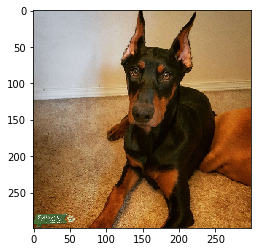

(1, 299, 299, 3)
Classpriori doberman
doberman, 100.00%
german_shepherd, 0.00%
BACKGROUND_Google, 0.00%
dalmatian, 0.00%
airplanes, 0.00%


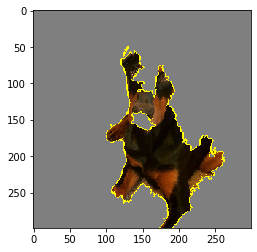

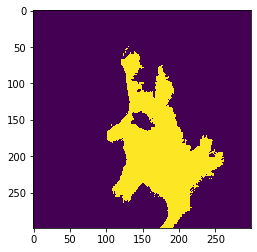

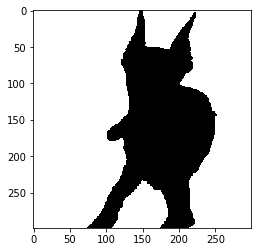

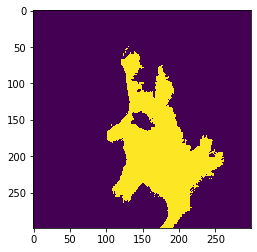

True Positive


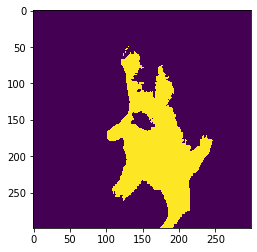

True Negative


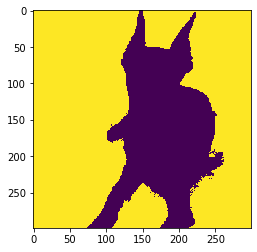

False Positive


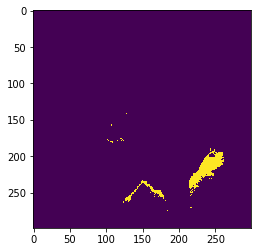

False Negative


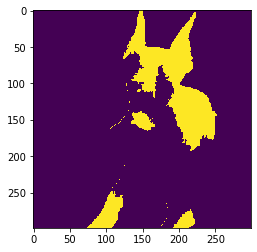

TP - FP: 16.300712519994185 1.484323441572242
FN - TN: 12.338788156732027 69.87617588170156
Acurracy: 86.17688840169573
Precision: 91.65408805031446
Recall: 56.91688798625215
Specificity: 97.91996488863113
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png',

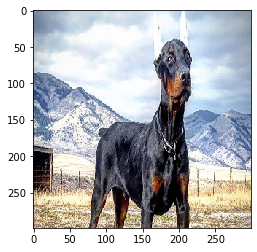

(1, 299, 299, 3)
Classpriori doberman
doberman, 100.00%
german_shepherd, 0.00%
BACKGROUND_Google, 0.00%
dalmatian, 0.00%
airplanes, 0.00%


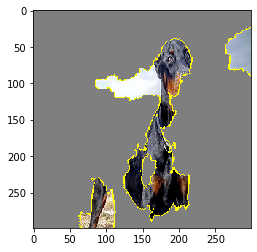

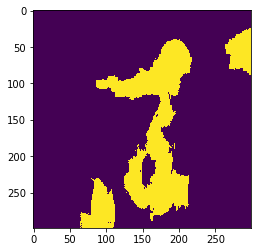

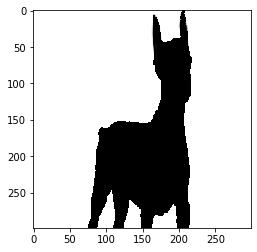

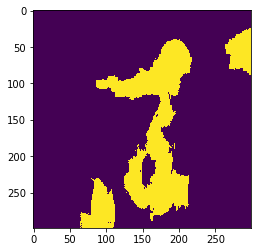

True Positive


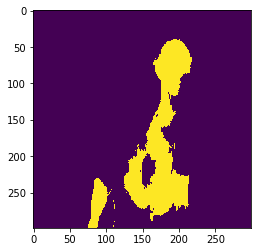

True Negative


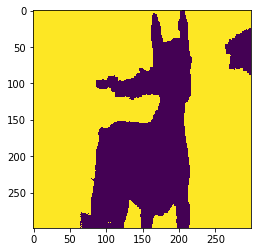

False Positive


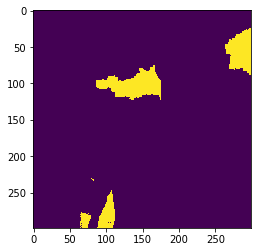

False Negative


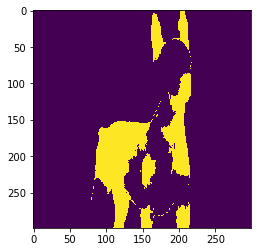

TP - FP: 12.071453339448105 5.393675685954296
FN - TN: 13.012158700685674 69.52271227391192
Acurracy: 81.59416561336002
Precision: 69.11745869091841
Recall: 48.12486064659978
Specificity: 92.80040611562352
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png',

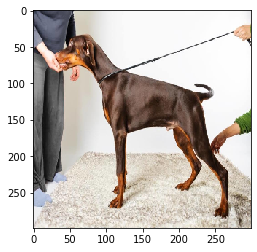

(1, 299, 299, 3)
Classpriori doberman
doberman, 99.34%
german_shepherd, 0.59%
BACKGROUND_Google, 0.05%
dalmatian, 0.02%
airplanes, 0.00%


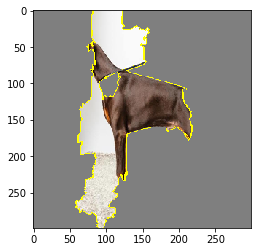

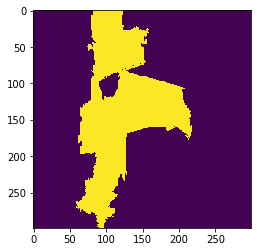

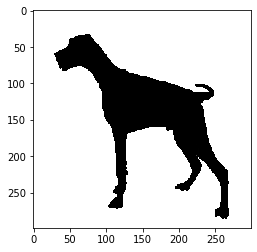

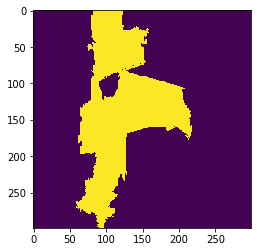

True Positive


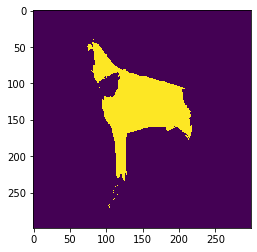

True Negative


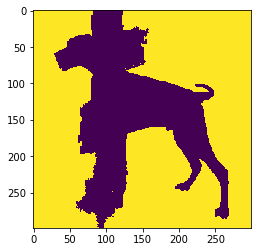

False Positive


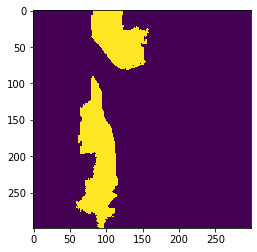

False Negative


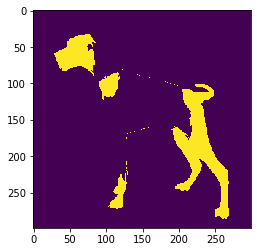

TP - FP: 10.80412970772139 12.069216228006399
FN - TN: 9.301909374615496 67.82474468965671
Acurracy: 78.6288743973781
Precision: 47.234583598219956
Recall: 53.73574408901253
Specificity: 84.89345616442192
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 

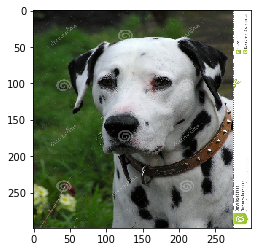

(1, 299, 299, 3)
Classpriori dalmatian
dalmatian, 100.00%
BACKGROUND_Google, 0.00%
german_shepherd, 0.00%
doberman, 0.00%
airplanes, 0.00%


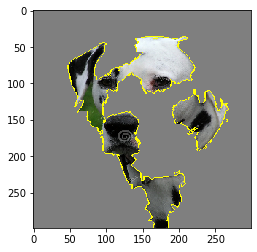

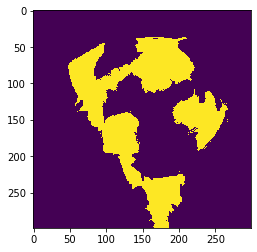

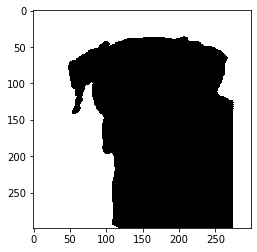

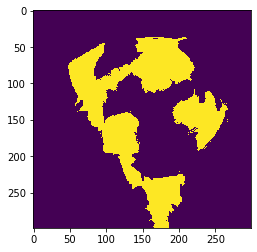

True Positive


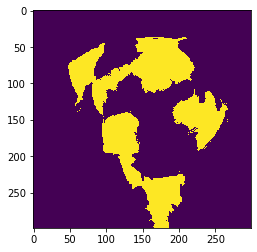

True Negative


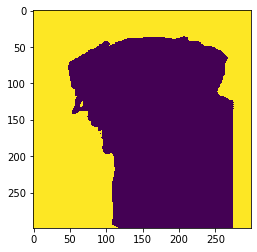

False Positive


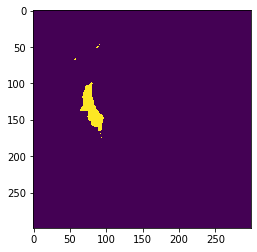

False Negative


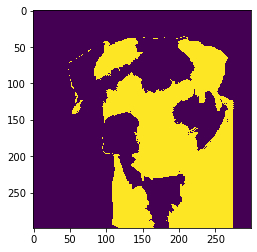

TP - FP: 19.35996241652778 1.0726949362982516
FN - TN: 32.365409782888335 47.20193286428563
Acurracy: 66.56189528081342
Precision: 94.75009580117151
Recall: 37.42836753670826
Specificity: 97.77793224894573
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png',

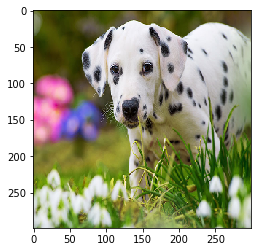

(1, 299, 299, 3)
Classpriori dalmatian
dalmatian, 100.00%
BACKGROUND_Google, 0.00%
german_shepherd, 0.00%
doberman, 0.00%
airplanes, 0.00%


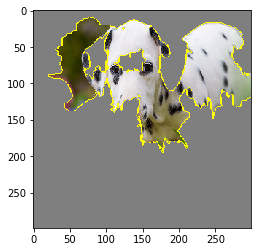

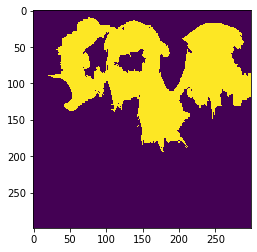

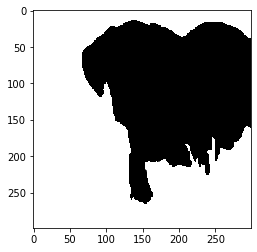

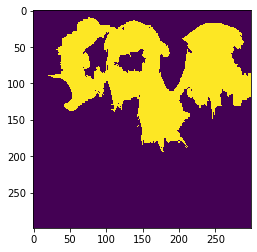

True Positive


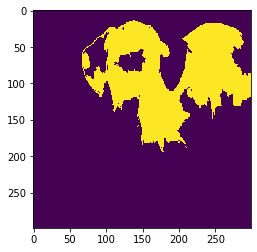

True Negative


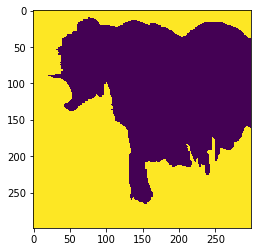

False Positive


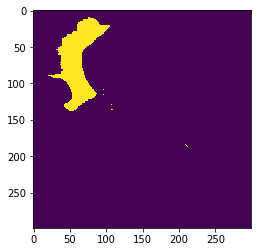

False Negative


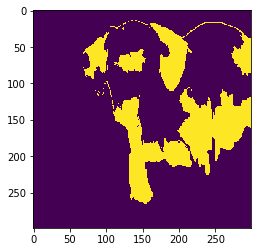

TP - FP: 22.291696960884106 4.6297021286115365
FN - TN: 19.11164304649836 53.96695786400599
Acurracy: 76.2586548248901
Precision: 82.8028918065481
Recall: 53.840334999324604
Specificity: 92.0990340930783
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 0

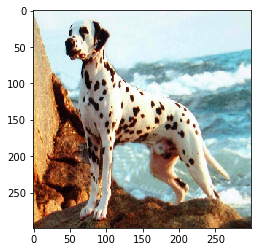

(1, 299, 299, 3)
Classpriori dalmatian
dalmatian, 100.00%
BACKGROUND_Google, 0.00%
german_shepherd, 0.00%
doberman, 0.00%
airplanes, 0.00%


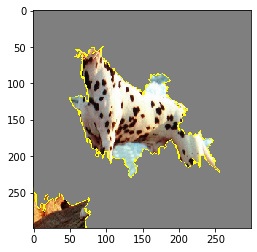

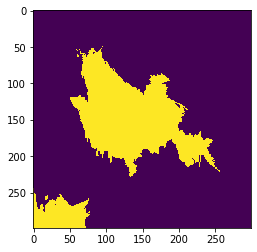

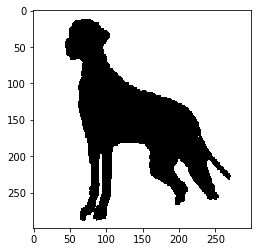

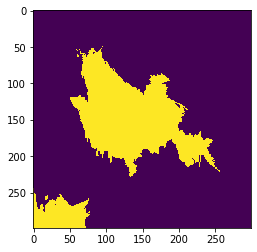

True Positive


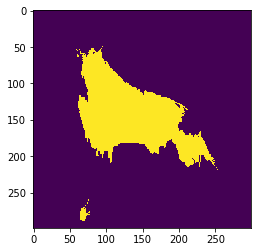

True Negative


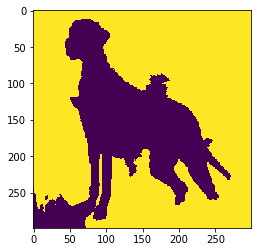

False Positive


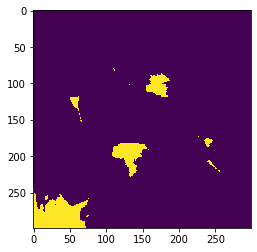

False Negative


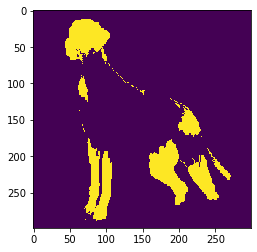

TP - FP: 15.736960436684152 5.103969754253308
FN - TN: 10.87348016241429 68.28558964664825
Acurracy: 84.0225500833324
Precision: 75.50987548303993
Recall: 59.13829340058848
Specificity: 93.0453734892015
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 0,

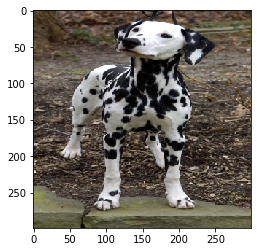

(1, 299, 299, 3)
Classpriori dalmatian
dalmatian, 100.00%
BACKGROUND_Google, 0.00%
german_shepherd, 0.00%
doberman, 0.00%
airplanes, 0.00%


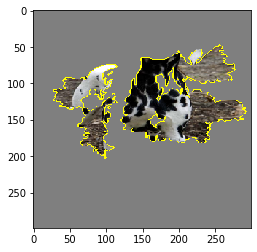

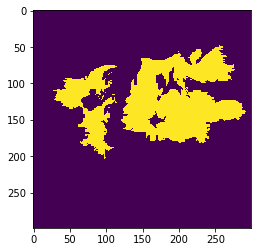

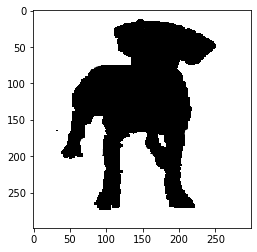

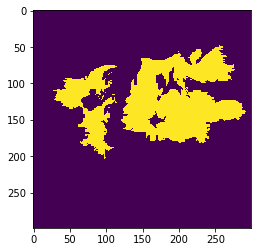

True Positive


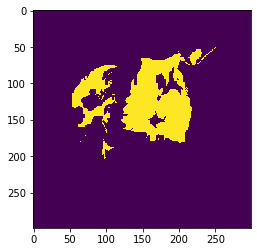

True Negative


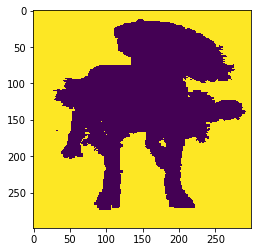

False Positive


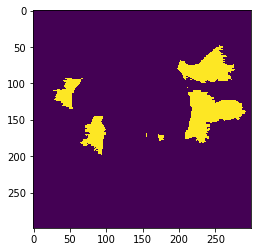

False Negative


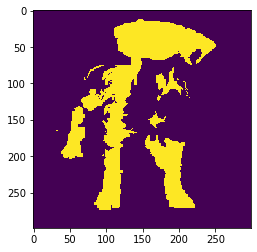

TP - FP: 11.235892215970738 7.778436482813392
FN - TN: 19.28390062750976 61.701770673706115
Acurracy: 72.93766288967686
Precision: 59.09171127713394
Recall: 36.81509987172439
Specificity: 88.80481679438469
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png',

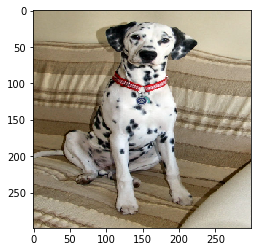

(1, 299, 299, 3)
Classpriori dalmatian
dalmatian, 100.00%
BACKGROUND_Google, 0.00%
german_shepherd, 0.00%
doberman, 0.00%
airplanes, 0.00%


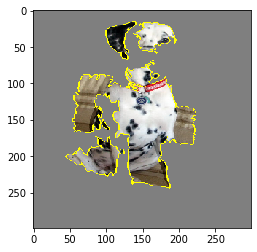

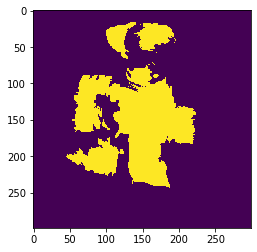

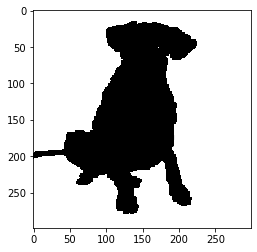

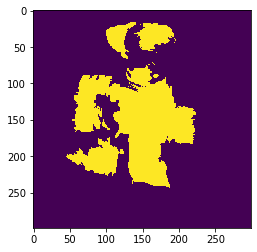

True Positive


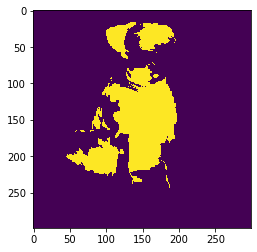

True Negative


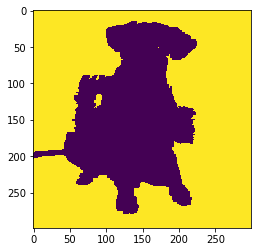

False Positive


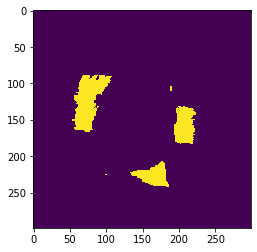

False Negative


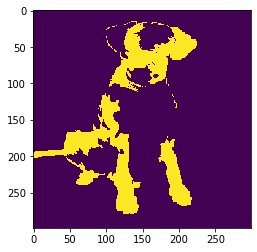

TP - FP: 14.986409547991633 5.068175971186005
FN - TN: 13.922663057460207 66.02275142336215
Acurracy: 81.00916097135378
Precision: 74.72809414914386
Recall: 51.8398142774231
Specificity: 92.87085404997167
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png', 

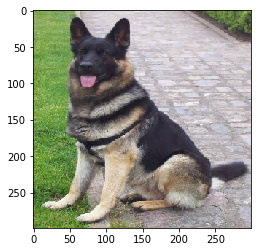

(1, 299, 299, 3)
Classpriori german_shepherd
german_shepherd, 100.00%
doberman, 0.00%
airplanes, 0.00%
BACKGROUND_Google, 0.00%
dalmatian, 0.00%


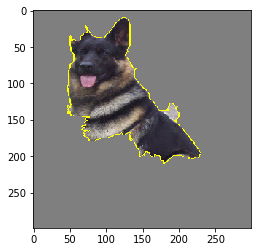

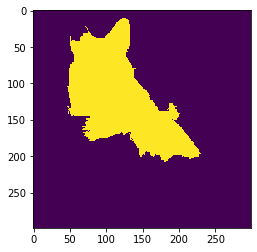

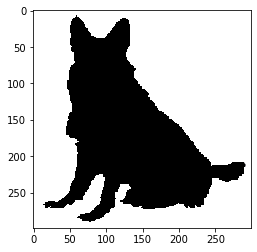

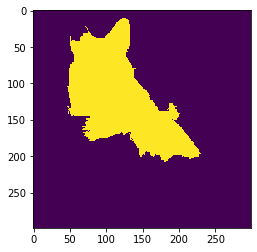

True Positive


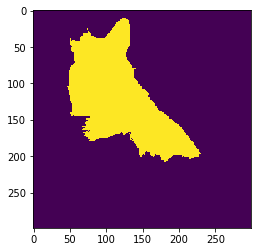

True Negative


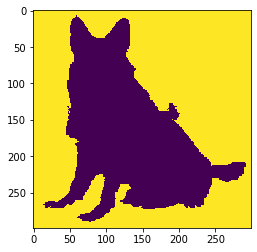

False Positive


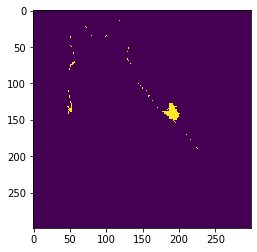

False Negative


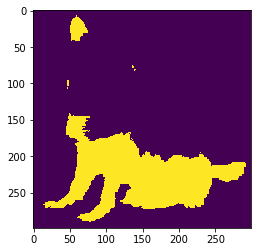

TP - FP: 18.62730841936891 0.48880885001286345
FN - TN: 18.92484424111587 61.95903848950235
Acurracy: 80.58634690887128
Precision: 97.44294909303687
Recall: 49.60383653044203
Specificity: 99.21725268229773
clabel: 0
[['11.9a11ca35bc0c6f639ed0959ea61d7058.png', 0, 'doberman', 'doberman', 99.94810223579407, 0.0, 33.62042930168566, 15.74590888245098, 50.63366181586336, 66.37957069831434, 100.0, 31.89604386640686, 100.0, 48.36542921440965], ['11.german-shepherd-ap-aozjlq-645.png', 0, 'german_shepherd', 'german_shepherd', 99.99866485595703, 10.306372411941702, 4.378027091419559, 14.404760573147952, 70.91083992349078, 85.31560049663874, 58.29259460438168, 76.69128156264888, 87.31011307138232, 66.23804135377019], ['11.german-shepherd-dog.png', 0, 'german_shepherd', 'german_shepherd', 100.0, 5.60955694007897, 18.30852003892574, 18.911421572465635, 57.170501448529656, 76.08192302099529, 77.12343764255087, 50.8099173553719, 91.06474717599686, 61.26057575592876], ['11.gsd_bred_to_do_header_.png',

In [12]:
#glob.glob("*.png*")

def path_leaf(path):
    head, tail = ntpath.split(path)
    return tail or ntpath.basename(head)


count=0
for f in glob.glob("C:/Users/andradee/Documents/audiodeep/image_downloader/image_downloader/images/3dogs/teste/*.png"):
    filen=path_leaf(f)
    count=count+1
    print(count, filen )
    getmasks(filen)
    data

df = pd.DataFrame(data, columns=['Filename','clabel','classpriori' ,'class_lime', 'prob', 'fp', 'fn','tp','tn', 'acc', 'pre', 'rec', 'spe','f1'])



In [13]:
df

,Filename,clabel,classpriori,class_lime,prob,fp,fn,tp,tn,acc,pre,rec,spe,f1
0,11.9a11ca35bc0c6f639ed0959ea61d7058.png,0,doberman,doberman,73.778641,1.684545,32.886657,16.479681,48.949117,65.428798,90.726030,33.382426,96.673073,48.806586
1,11.hqdefault.png,0,dalmatian,dalmatian,95.618904,7.117370,7.862328,9.291842,75.728459,85.020302,56.625767,54.166667,91.408898,55.368926
2,12.Dalmatian-Dog.png,0,dalmatian,dalmatian,99.869883,4.457445,26.426997,9.175513,59.940045,69.115558,67.303905,25.772095,93.078232,37.271963
3,12.doberman-p_1_orig.png,0,doberman,doberman,58.369720,12.599412,20.939363,5.497701,60.963524,66.461225,30.378886,20.795431,82.872609,24.689808
4,15.doberman-pinscher-dutchess-large-adult-fema...,0,doberman,doberman,99.689579,18.806277,26.259214,2.298632,52.635877,54.934509,10.891456,8.049038,73.676217,9.256965
5,16.big_A23481D2-8526-46DD-89CA-E1EE09A7C1A9.png,0,doberman,doberman,99.980098,12.035660,57.820382,7.422736,22.721222,30.143958,38.146700,11.377040,65.371866,17.526808
6,17.70af109bc007c9d30d1dd1a4aa92c435.png,0,doberman,doberman,98.944700,15.554636,20.523260,2.929497,60.992606,63.922104,15.848714,12.491057,79.679691,13.970980
7,17.774c9de81806c1cfbe2ae6325311ccd9---dalmatia...,0,dalmatian,dalmatian,99.999630,4.162146,36.632700,15.885728,43.319426,59.205154,79.238967,30.247913,91.234187,43.782659
8,17.img_4975.png,0,doberman,doberman,98.284882,15.589311,23.922551,1.260612,59.227525,60.488138,7.481413,5.005774,79.163365,5.998190
9,2.Adult-Dalmatian.png,0,dalmatian,dalmatian,97.856116,3.785193,14.433843,12.070335,69.710630,81.780964,76.126984,45.541253,94.849785,56.989702


In [13]:
writer = pd.ExcelWriter('output_base1_260321_t1_real.xlsx', engine='xlsxwriter')
df.to_excel(writer,'output')
writer.save()
